# LeNet 5 Architecture
(3 convolution layer, 2 average pooling layer, 2 hidden layer)
[reference](https://medium.com/@siddheshb008/lenet-5-architecture-explained-3b559cb2d52b)

In [ ]:
# LeNet convolution Network

import cv2
import torch
import torch.nn as nn
import plotly.express as ex

class LeNet(nn.Module):
  def __init__(self):
    super(LeNet,self).__init__()
    #Layer 1
    self.conv1=nn.Conv2d(in_channels=3, out_channels=6, kernel_size= 5, stride=1)
    self.pool1=nn.AvgPool2d(kernel_size=2, stride=2)

    # Layer 2
    self.conv2=nn.Conv2d(in_channels=6, out_channels=16, kernel_size= 5, stride=1)
    self.pool2=nn.AvgPool2d(kernel_size=2, stride=2)

    # Layer 3
    self.conv3=nn.Conv2d(in_channels=16, out_channels= 120, kernel_size= 5, stride=1)

    # FC Layer1
    self.linear1=nn.Linear(in_features= 10730880 , out_features=84)

    # FC Layer2(output layer)
    self.linear2=nn.Linear(in_features= 84, out_features=4)


  def forward(self,x):
    x=self.conv1(x)
    x=torch.tanh(x)
    x=self.pool1(x)

    x=self.conv2(x)
    x=torch.tanh(x)
    x=self.pool2(x)

    x=self.conv3(x)
    x=torch.tanh(x)

    #x=x.view(x.size(0),-1)
    #x=self.linear1(x)
    #x=torch.tanh(x)

    #x=self.linear2(x)

    return x


if torch.cuda.is_available():
  device=torch.device('cuda:0')
else:
  device=torch.device('cpu')

print('device')

image=cv2.imread('/content/drive/MyDrive/PYTORCH_COURCERA/PYTORCH Basics/cat2.jpg')
print(f"shape of original image= {image.shape}")
h, w=image.shape[0],image.shape[1]

image=image.reshape(1,3,h,w)

image= torch.tensor(image,dtype=torch.float32,device=device)

model=LeNet().to(device)
print(model.named_parameters())
x=model(image)

print(f"output shape= {x.shape}")



device
shape of original image= (1500, 1000, 3)
<generator object Module.named_parameters at 0x7f6dd23771b0>
output shape= torch.Size([1, 120, 368, 243])


In [ ]:
from torchsummary import summary
summary(model,(3,1500, 1000))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 6, 1496, 996]             456
         AvgPool2d-2          [-1, 6, 748, 498]               0
            Conv2d-3         [-1, 16, 744, 494]           2,416
         AvgPool2d-4         [-1, 16, 372, 247]               0
            Conv2d-5        [-1, 120, 368, 243]          48,120
Total params: 50,992
Trainable params: 50,992
Non-trainable params: 0
----------------------------------------------------------------
Input size (MB): 17.17
Forward/backward pass size (MB): 223.21
Params size (MB): 0.19
Estimated Total Size (MB): 240.57
----------------------------------------------------------------


(368, 243, 120)


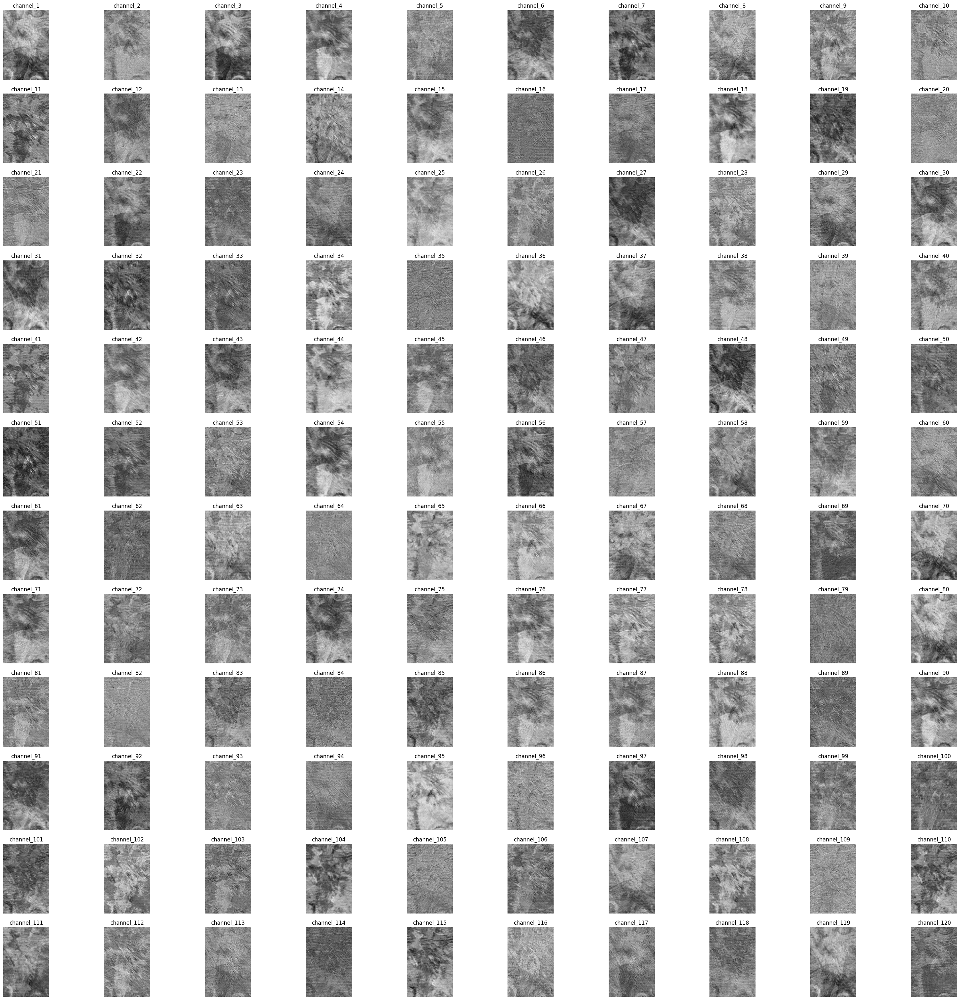

In [ ]:
A=x.cpu().squeeze().detach().numpy().transpose(1,2,0)
import matplotlib.pyplot as plt

print(A.shape)
plt.figure(figsize=(40,40))
#plt.suptitle(" 120 Channel image")
for i in range(120):
  plt.subplot(12,10,i+1)
  plt.title(f"channel_{i+1}")
  plt.imshow(A[:,:,i],cmap='gray')
  plt.axis('off')


# __AlexNet__

[5 convolution layer, 3 Maxpooling layer , 3 Hidden layer)

In [ ]:
class alexnet(nn.Module):
  def __init__(self):
    super(alexnet,self).__init__()

    # Layer 1
    self.conv1=nn.Conv2d(in_channels=3,out_channels=96,kernel_size=11,stride=4)
    self.maxpool1=nn.MaxPool2d(kernel_size=3,stride=2)

    # Layer 2
    self.conv2=nn.Conv2d(in_channels=96, out_channels=256,kernel_size=5,padding=2, stride=1)
    self.maxpool2=nn.MaxPool2d(kernel_size=3,stride=2)

    # Layer 3
    self.conv3=nn.Conv2d(in_channels= 256, out_channels= 384,kernel_size=3, stride=1,padding=1 )

    # Layer 4
    self.conv4= nn.Conv2d(in_channels=384, out_channels=384, kernel_size=3,stride=1,padding=1)

    # Layer 5
    self.conv5= nn.Conv2d(in_channels= 384, out_channels=256, kernel_size=3, stride=1,padding=1)
    self.maxpool3= nn.MaxPool2d(kernel_size=3,stride=2)

    # hidden layer 1

    self.linear1=nn.Linear(in_features=(9216),out_features=4096)
    self.dropout1=nn.Dropout(p=0.5)
    self.linear2=nn.Linear(in_features=4096, out_features= 4096)

    self.linear3=nn.Linear(in_features=4096, out_features=4)





  def forward(self,x):
    x=self.conv1(x)
    x=torch.relu(x)
    x=self.maxpool1(x)

    x=self.conv2(x)
    x=torch.relu(x)
    x=self.maxpool2(x)

    x=self.conv3(x)
    x=torch.relu(x)

    x=self.conv4(x)
    x=torch.relu(x)

    x=self.conv5(x)
    x=torch.relu(x)
    x=self.maxpool3(x)



    x=x.view(x.size(0),-1)
    x=self.linear1(x)
    x=torch.relu(x)
    x=self.dropout1(x)

    x=self.linear2(x)
    x=torch.relu(x)
    x=self.dropout1(x)

    x=self.linear3(x)

    return x

'\nif torch.cuda.is_available():\n  device=torch.device(\'cuda:0\')\nelse:\n  device=torch.device(\'cpu\')\n\nprint(\'device\')\n\nimport cv2\nimage=cv2.imread(\'/content/drive/MyDrive/PYTORCH_COURCERA/PYTORCH Basics/cat2.jpg\')\n\n\n#image=cv2.resize(image,(227,227));\nprint(f"shape of original image= {image.shape}")\n\nh, w=image.shape[0],image.shape[1]\n\nimage=image.reshape(1,3,h,w)\n\nimage= torch.tensor(image,dtype=torch.float32,device=device)\n\nmodel=alexnet().to(device)\nprint(model.named_parameters())\nx=model(image)\n\nprint(f"output shape= {x.shape}")\n\n'

torch.Size([1, 256, 45, 30])
(45, 30, 256)


torch.Size([2, 256, 45, 30])
----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 96, 373, 248]          34,944
         MaxPool2d-2         [-1, 96, 186, 123]               0
            Conv2d-3        [-1, 256, 186, 123]         614,656
         MaxPool2d-4          [-1, 256, 92, 61]               0
            Conv2d-5          [-1, 384, 92, 61]         885,120
            Conv2d-6          [-1, 384, 92, 61]       1,327,488
            Conv2d-7          [-1, 256, 92, 61]         884,992
         MaxPool2d-8          [-1, 256, 45, 30]               0
            Linear-9                 [-1, 4096]   1,415,581,696
          Dropout-10                 [-1, 4096]               0
           Linear-11                 [-1, 4096]      16,781,312
          Dropout-12                 [-1, 4096]               0
           Linear-13         

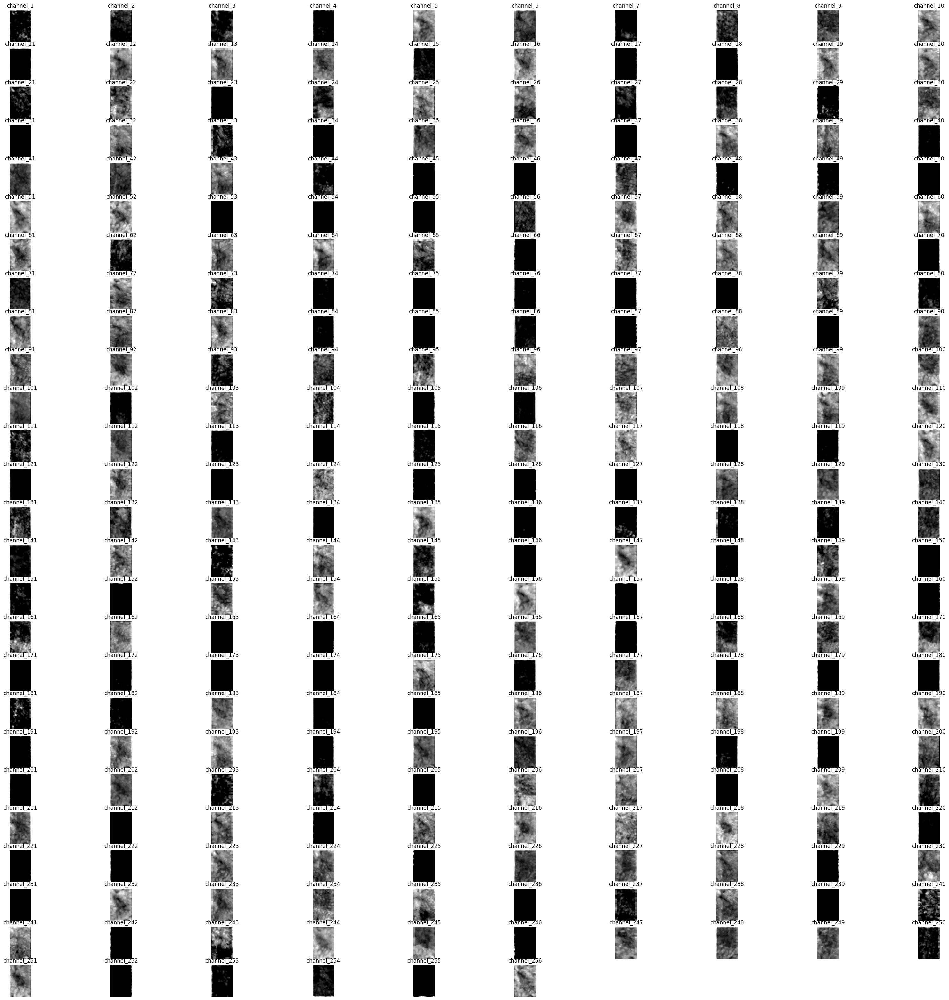

In [ ]:
from torchsummary import summary
import matplotlib.pyplot as plt
print(A.shape)

def model_information():

  B=A.cpu().squeeze().detach().numpy().transpose(1,2,0)



  print(B.shape)
  plt.figure(figsize=(40,40))
  #plt.suptitle(" 120 Channel image")
  for i in range(256):
    plt.subplot(26,10,i+1)
    plt.title(f"channel_{i+1}")
    plt.imshow(B[:,:,i],cmap='gray')
    plt.axis('off')


  print()
  print()
  return summary(model,(3,1500,1000))

model_information()

# one image is loaded in  4 different forms(Don't touch this)

In [ ]:
import os
import cv2
import numpy as np
import torch
import torchvision.transforms as transforms
from torch.utils.data import Dataset, DataLoader
from PIL import Image
import hashlib

transform = transforms.Compose([
    transforms.ToTensor(),  # Convert to tensor
])

def augment_and_save_images(image_path, class_name):
    images = []
    labels = []
    transformations = [
        transforms.RandomVerticalFlip(p=0.5),
        transforms.RandomAffine(degrees=10, shear=10),
        #transforms.RandomCrop(size=224, padding=20),
        transforms.RandomPerspective(distortion_scale=0.2, p=0.5),
        transforms.RandomRotation(degrees=10),
    ]
    generated_images = set()

    original_image = Image.open(image_path)
    original_image = original_image.resize((227, 227))
    original_image_array = np.array(original_image)

    images.append(original_image_array)
    labels.append(class_name)

    for transform_fn in transformations:
        augmented_image = transform_fn(original_image)
        augmented_image_array = np.array(augmented_image)
        image_hash = hashlib.sha256(augmented_image_array.tobytes()).hexdigest()
        if image_hash not in generated_images:
            generated_images.add(image_hash)
            images.append(augmented_image_array)
            labels.append(class_name)
    #print(images)
    return images, labels

class CustomDataset(Dataset):
    def __init__(self, folder_path, transform):
        self.folder_path = folder_path
        self.transform = transform

        self.images = []
        self.labels = []

        self.load_data()

    def load_data(self):
        class_names = ['Cyst','Normal','Stone','Tumor']
        for class_name in class_names:
            class_path = os.path.join(self.folder_path, class_name)
            for image_name in os.listdir(class_path):
                if not image_name.startswith('_DS_Store'):
                    image_path = os.path.join(class_path, image_name)

                    augmented_images, label = augment_and_save_images(image_path, class_name)
                    self.images.extend(augmented_images)
                    self.labels.extend(label)

        self.images=np.array(self.images)
        self.labels=np.array(self.labels)

    def __getitem__(self, index):
      image = self.images[index]
      label = self.labels[index]

      if self.transform:
        image=self.transform(image)

      return image,label

    def __len__(self):
        return len(self.images)


path = "/content/drive/MyDrive/Medical_cv/CT-KIDNEY-DATASET-Normal-Cyst-Tumor-Stone(just 10 image each)"

data = CustomDataset(path, transform)

data_loader = DataLoader(data)


In [ ]:
class alexnet(nn.Module):
  def __init__(self):
    super(alexnet,self).__init__()

    # Layer 1
    self.conv1=nn.Conv2d(in_channels=3,out_channels=96,kernel_size=11,stride=4)
    self.maxpool1=nn.MaxPool2d(kernel_size=3,stride=2)

    # Layer 2
    self.conv2=nn.Conv2d(in_channels=96, out_channels=256,kernel_size=5,padding=2, stride=1)
    self.maxpool2=nn.MaxPool2d(kernel_size=3,stride=2)

    # Layer 3
    self.conv3=nn.Conv2d(in_channels= 256, out_channels= 384,kernel_size=3, stride=1,padding=1 )

    # Layer 4
    self.conv4= nn.Conv2d(in_channels=384, out_channels=384, kernel_size=3,stride=1,padding=1)

    # Layer 5
    self.conv5= nn.Conv2d(in_channels= 384, out_channels=256, kernel_size=3, stride=1,padding=1)
    self.maxpool3= nn.MaxPool2d(kernel_size=3,stride=2)

    # hidden layer 1

    self.linear1=nn.Linear(in_features=(9216),out_features=4096)
    self.dropout1=nn.Dropout(p=0.5)
    self.linear2=nn.Linear(in_features=4096, out_features= 4096)

    self.linear3=nn.Linear(in_features=4096, out_features=4)

  def forward(self,x):
    x=self.conv1(x)
    x=torch.relu(x)
    x=self.maxpool1(x)

    x=self.conv2(x)
    x=torch.relu(x)
    x=self.maxpool2(x)

    x=self.conv3(x)
    x=torch.relu(x)

    x=self.conv4(x)
    x=torch.relu(x)

    x=self.conv5(x)
    x=torch.relu(x)
    x=self.maxpool3(x)

    x=x.view(x.size(0),-1)
    x=self.linear1(x)
    x=torch.relu(x)
    x=self.dropout1(x)

    x=self.linear2(x)
    x=torch.relu(x)
    x=self.dropout1(x)

    x=self.linear3(x)

    return x

# Fine-tune the pre-trained AlexNet model

In [ ]:
import torch
import torch.nn as nn
from torchvision import models

class FineTuneAlexNet(nn.Module):
  def __init__(self,num_classes):
    super(FineTuneAlexNet,self).__init__()
    self.alexnet=models.alexnet(weights=True)
    input_features=self.alexnet.classifier[-1].in_features
    self.alexnet.classifier[-1]=nn.Linear(in_features=input_features,out_features=num_classes)

  def forward(self,x):
    x=self.alexnet(x)
    return x



In [ ]:
device=torch.device('cuda')
model= models.alexnet(weights=True).to(device)
from torchsummary import summary
summary(model, (3,224,224))

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning:

Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=AlexNet_Weights.IMAGENET1K_V1`. You can also use `weights=AlexNet_Weights.DEFAULT` to get the most up-to-date weights.



----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1           [-1, 64, 55, 55]          23,296
              ReLU-2           [-1, 64, 55, 55]               0
         MaxPool2d-3           [-1, 64, 27, 27]               0
            Conv2d-4          [-1, 192, 27, 27]         307,392
              ReLU-5          [-1, 192, 27, 27]               0
         MaxPool2d-6          [-1, 192, 13, 13]               0
            Conv2d-7          [-1, 384, 13, 13]         663,936
              ReLU-8          [-1, 384, 13, 13]               0
            Conv2d-9          [-1, 256, 13, 13]         884,992
             ReLU-10          [-1, 256, 13, 13]               0
           Conv2d-11          [-1, 256, 13, 13]         590,080
             ReLU-12          [-1, 256, 13, 13]               0
        MaxPool2d-13            [-1, 256, 6, 6]               0
AdaptiveAvgPool2d-14            [-1, 25

# Training, Validation, Testing

In [ ]:
import os
import cv2
import numpy as np
import torch
import torchvision.transforms as transforms
from torch.utils.data import Dataset, DataLoader
from PIL import Image
import hashlib
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder

transform = transforms.Compose([
    transforms.ToTensor(),  # Convert to tensor
])

def augment_and_save_images(image_path, class_name):
    images = []
    labels = []
    transformations = [
        transforms.RandomVerticalFlip(p=0.5),
        transforms.RandomAffine(degrees=10, shear=10),
        #transforms.RandomCrop(size=224, padding=20),
        transforms.RandomPerspective(distortion_scale=0.2, p=0.5),
        transforms.RandomRotation(degrees=10),
    ]
    generated_images = set()

    original_image = Image.open(image_path)
    original_image = original_image.resize((227, 227))
    original_image_array = np.array(original_image)

    images.append(original_image_array)
    labels.append(class_name)

    for transform_fn in transformations:
        augmented_image = transform_fn(original_image)
        augmented_image_array = np.array(augmented_image)
        image_hash = hashlib.sha256(augmented_image_array.tobytes()).hexdigest()
        if image_hash not in generated_images:
            generated_images.add(image_hash)
            images.append(augmented_image_array)
            labels.append(class_name)
    #print(images)
    return images, labels

class CustomDataset(Dataset):
    def __init__(self, folder_path, transform,split,device):
        self.folder_path = folder_path
        self.transform = transform
        self.le=LabelEncoder()
        self.device=device
        self.images = []
        self.labels = []

        self.split=split

        self.load_data()

    def load_data(self):
        class_names = ['Cyst','Normal','Stone','Tumor']
        for class_name in class_names:
            class_path = os.path.join(self.folder_path, class_name)
            for image_name in os.listdir(class_path):
                if not image_name.startswith('_DS_Store'):
                    image_path = os.path.join(class_path, image_name)

                    augmented_images, label = augment_and_save_images(image_path, class_name)
                    self.images.extend(augmented_images)
                    self.labels.extend(label)

        #self.images=np.array(self.images)
        #self.labels=np.array(self.labels)

        self.labels=self.le.fit_transform(self.labels)

        x_train,x_mid,y_train,y_mid=train_test_split(self.images,self.labels,test_size=0.2)
        x_val,x_test,y_val,y_test=train_test_split(x_mid,y_mid,test_size=0.5)
        #print(len(y_train));print(len(x_val))
        if self.split=='train':
          self.images=x_train
          self.labels=y_train
          print("Train")

        if self.split=='val':
          self.images=x_val
          self.labels=y_val
          print("Val")

        if self.split=='test':
          self.images=x_test
          self.labels=y_test
          print("Test")

        return self.images,self.labels

    def __getitem__(self, index):
      image = self.images[index]
      label = self.labels[index]

      if self.transform:
        image=self.transform(image)
      image=image.to(self.device)

      return image,torch.tensor(label,device=self.device)

    def __len__(self):
        return len(self.images)


if torch.cuda.is_available():
  device=torch.device('cuda:0')
else:
  device=torch.device('cpu')
path = "/content/drive/MyDrive/Medical_cv/CT-KIDNEY-DATASET-Normal-Cyst-Tumor-Stone(just 10 image each)"

val_data = CustomDataset(path, transform,split='val',device=device)
train_data = CustomDataset(path,transform,split='train',device=device)
test_data = CustomDataset(path,transform,split='test', device=device)

val_loader = DataLoader(val_data)
train_loader = DataLoader(train_data,batch_size=2)

test_loader = DataLoader(test_data)



Val
Train
Test


In [ ]:
import torch
from torch import nn

def model_training(epochs,train_loader,val_loader):
  #model=alexnet().to(device)
  model= FineTuneAlexNet(4).to(device)  # Fine tune the model
  criterion=nn.CrossEntropyLoss().to(device)
  optimizer=torch.optim.SGD(model.parameters(),lr=0.01,momentum=0.2)
  report={
      'train_cost':[],
      'val_accuracy':[]
  }

  for i in range(epochs):
    Loss=0.0
    model.train()
    for x,y in train_loader:
      #print(x.shape);print(x.device)
      optimizer.zero_grad()
      yhat=model(x)
      #print(yhat.shape);print(y.device);print(yhat.device)
      loss=criterion(yhat,y.long())
      #oss=criterion(yhat.squeeze(),y.long())
      Loss+=loss.item()
      loss.backward()
      optimizer.step()
    #print(Loss)
    print(f"Epoch {i+1}/{epochs} : Training Loss = {(Loss)/len(train_loader)}")
    report['train_cost'].append((Loss)/len(train_loader))

    correct=0
    for x,y in val_loader:
      model.eval()
      z=model(x)
      _,yhat=torch.max(z.data,1)
      correct+=(yhat==y).sum().item()
    accuracy=correct/len(val_loader)
    report['val_accuracy'].append(accuracy)
  return report,model

report_fine_tune,model=model_training(5,train_loader,val_loader)

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning:

Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=AlexNet_Weights.IMAGENET1K_V1`. You can also use `weights=AlexNet_Weights.DEFAULT` to get the most up-to-date weights.



122.82392844557762
Epoch 1/5 : Training Loss = 1.6376523792743682
54.40340873692185
Epoch 2/5 : Training Loss = 0.725378783158958
13.471653378626797
Epoch 3/5 : Training Loss = 0.1796220450483573
6.283330829857732
Epoch 4/5 : Training Loss = 0.0837777443981031
0.3024785489669739
Epoch 5/5 : Training Loss = 0.004033047319559652


In [ ]:
import plotly.express as ex
fig=ex.line(report_fine_tune,title='AlexNet model')
fig.show()

In [ ]:
import plotly.express as ex
fig=ex.line(report_fine_tune,title='AlexNet model(Pretrained)')
fig.show()

In [ ]:
import numpy as np
def model_prediction(model,test_loader):
  model.eval()
  for x,y in test_loader:
    output=model(x)
    output=output.detach().numpy()
    output_class=np.argmax(output)
    #print(output_class)
    #print(y.long())
    print(f"Predicted Classes = {output_class}   Original Class = {int(y.numpy().item())}")

model_prediction(model,test_loader)

Predicted Classes = 3   Original Class = 3
Predicted Classes = 0   Original Class = 0
Predicted Classes = 2   Original Class = 2
Predicted Classes = 1   Original Class = 1
Predicted Classes = 3   Original Class = 3
Predicted Classes = 1   Original Class = 1
Predicted Classes = 0   Original Class = 0
Predicted Classes = 2   Original Class = 2
Predicted Classes = 2   Original Class = 2
Predicted Classes = 0   Original Class = 0
Predicted Classes = 3   Original Class = 3
Predicted Classes = 1   Original Class = 1
Predicted Classes = 1   Original Class = 1
Predicted Classes = 0   Original Class = 0
Predicted Classes = 0   Original Class = 0
Predicted Classes = 1   Original Class = 1
Predicted Classes = 3   Original Class = 3
Predicted Classes = 3   Original Class = 3
Predicted Classes = 1   Original Class = 1
Predicted Classes = 0   Original Class = 0


# __VGG16__

{ 'Learnable Parameters': [ 13 convolution layer, 3 FC layer],
  'Non Learnable Parameters' :[5 max pooling Layer]}


In [ ]:
import torch
import torch.nn as nn

class vgg16(nn.Module):
  def __init__(self,num_classes):
    super(vgg16,self).__init__()

    self.conv1=nn.Conv2d(in_channels=3,out_channels=64,kernel_size=3,stride=1,padding=1)
    self.conv2=nn.Conv2d(in_channels=64,out_channels=64,kernel_size=3,padding=1,stride=1)
    self.maxpool1=nn.MaxPool2d(kernel_size=3,stride=2,padding=1)

    self.conv3=nn.Conv2d(64,128,kernel_size=3,stride=1,padding=1)
    self.conv4=nn.Conv2d(128,128,kernel_size=3,padding=1,stride=1)
    self.maxpool2=nn.MaxPool2d(kernel_size=3,stride=2,padding=1)

    self.conv5=nn.Conv2d(128,256,kernel_size=3,stride=1,padding=1)
    self.conv6=nn.Conv2d(256,256,kernel_size=3,padding=1,stride=1)
    self.conv7=nn.Conv2d(256,256,kernel_size=3,padding=1,stride=1)
    self.maxpool3=nn.MaxPool2d(kernel_size=3,stride=2,padding=1)

    self.conv8=nn.Conv2d(256,512,kernel_size=3,stride=1,padding=1)
    self.conv9=nn.Conv2d(512,512,kernel_size=3,padding=1,stride=1)
    self.conv10=nn.Conv2d(512,512,kernel_size=3,padding=1,stride=1)
    self.maxpool4=nn.MaxPool2d(kernel_size=3,stride=2,padding=1)

    self.conv11=nn.Conv2d(512,512,kernel_size=3,stride=1,padding=1)
    self.conv12=nn.Conv2d(512,512,kernel_size=3,padding=1,stride=1)
    self.conv13=nn.Conv2d(512,512,kernel_size=3,padding=1,stride=1)
    self.maxpool5=nn.MaxPool2d(kernel_size=3,stride=2,padding=1)

    self.linear1 = nn.Linear(in_features=(7*7*512), out_features=4096)
    self.linear2 = nn.Linear(4096,4096)
    self.linear3 = nn.Linear(4096,num_classes)



  def forward(self,x):
    x=self.conv1(x)
    x=torch.relu(x)
    x=self.conv2(x)
    x=torch.relu(x)
    x=self.maxpool1(x)

    x=self.conv3(x)
    x=torch.relu(x)
    x=self.conv4(x)
    x=torch.relu(x)
    x=self.maxpool2(x)

    x=self.conv5(x)
    x=torch.relu(x)
    x=self.conv6(x)
    x=torch.relu(x)
    x=self.conv7(x)
    x=torch.relu(x)
    x=self.maxpool3(x)

    x=self.conv8(x)
    x=torch.relu(x)
    x=self.conv9(x)
    x=torch.relu(x)
    x=self.conv10(x)
    x=torch.relu(x)
    x=self.maxpool4(x)

    x=self.conv11(x)
    x=torch.relu(x)
    x=self.conv12(x)
    x=torch.relu(x)
    x=self.conv13(x)
    x=torch.relu(x)
    x=self.maxpool5(x)

    conv_image=x

    x=x.view(x.size(0),-1)

    x=self.linear1(x)
    x=torch.relu(x)

    x=self.linear2(x)
    x=torch.relu(x)

    x=self.linear3(x)

    return x



# VGG16 Fine Tune model

In [ ]:
import torch
import torch.nn as nn
from torchvision import models

class vgg16_finetune(nn.Module):
  def __init__(self,num_clases):
    super(vgg16_finetune,self).__init__()
    self.vgg16=models.vgg16(weights=True)
    in_fea=self.vgg16.classifier[-1].in_features
    self.vgg16.classifier[-1]=nn.Linear(in_fea,num_clases)
  def forward(self,x):
    x=self.vgg16(x)
    return x

device
shape of original image= (1500, 1000, 3)
output shape= torch.Size([1, 512, 7, 7])
(7, 7, 512)


----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 64, 224, 224]           1,792
            Conv2d-2         [-1, 64, 224, 224]          36,928
         MaxPool2d-3         [-1, 64, 112, 112]               0
            Conv2d-4        [-1, 128, 112, 112]          73,856
            Conv2d-5        [-1, 128, 112, 112]         147,584
         MaxPool2d-6          [-1, 128, 56, 56]               0
            Conv2d-7          [-1, 256, 56, 56]         295,168
            Conv2d-8          [-1, 256, 56, 56]         590,080
            Conv2d-9          [-1, 256, 56, 56]         590,080
        MaxPool2d-10          [-1, 256, 28, 28]               0
           Conv2d-11          [-1, 512, 28, 28]       1,180,160
           Conv2d-12          [-1, 512, 28, 28]       2,359,808


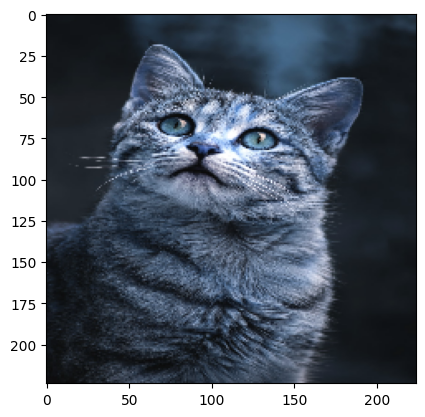

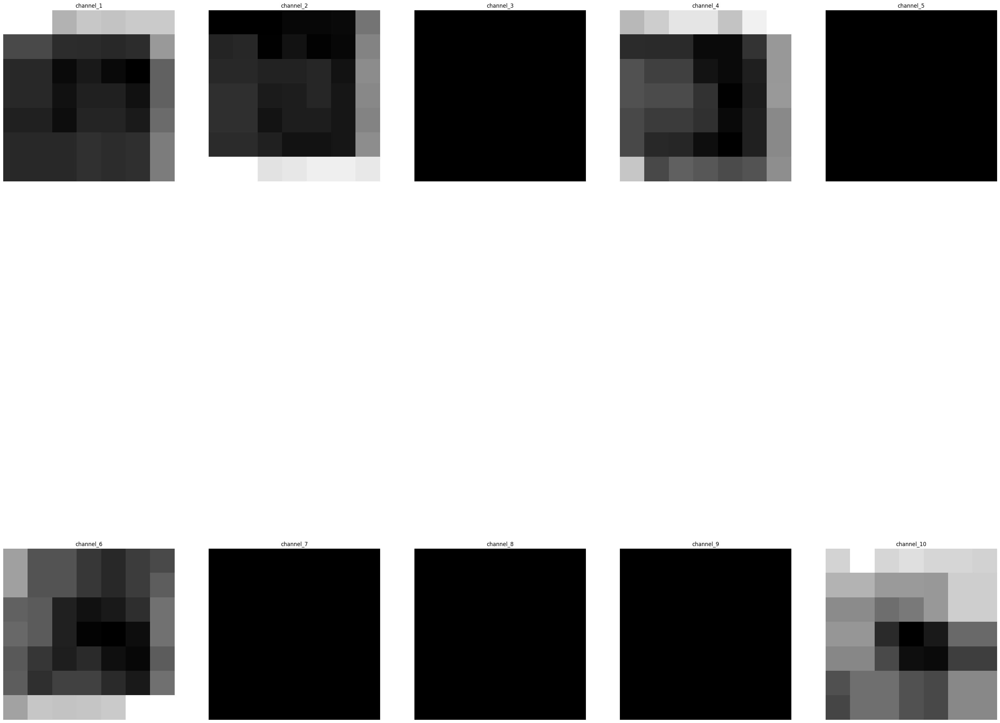

In [ ]:
if torch.cuda.is_available():
  device=torch.device('cuda:0')
else:
  device=torch.device('cpu')

print('device')

image=cv2.imread('/content/drive/MyDrive/PYTORCH_COURCERA/PYTORCH Basics/cat2.jpg')
imag=cv2.cvtColor(image,cv2.COLOR_BGR2RGB)
print(f"shape of original image= {image.shape}")

image=cv2.resize(image,(224,224))

plt.imshow(image)
h, w=image.shape[0],image.shape[1]

image=image.reshape(1,3,h,w)

image= torch.tensor(image,dtype=torch.float32,device=device)

model=vgg16(4).to(device)
#print(model.named_parameters())
x,conv_image=model(image)

print(f"output shape= {conv_image.shape}")

from torchsummary import summary
import matplotlib.pyplot as plt


def model_information():

  B = conv_image.cpu().squeeze().detach().numpy().transpose(1,2,0)



  print(B.shape)
  plt.figure(figsize=(40,40))
  #plt.suptitle(" 120 Channel image")
  for i in range(10):
    plt.subplot(2,5,i+1)
    plt.title(f"channel_{i+1}")
    plt.imshow(B[:,:,i],cmap='gray')
    plt.axis('off')


  print()
  print()
  return summary(model,(3,224,224))

model_information()


In [ ]:
import os
import cv2
import numpy as np
import torch
import torchvision.transforms as transforms
from torch.utils.data import Dataset, DataLoader
from PIL import Image
import hashlib
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder

transform = transforms.Compose([
    transforms.ToTensor(),  # Convert to tensor
])

def augment_and_save_images(image_path, class_name):
    images = []
    labels = []
    transformations = [
        transforms.RandomVerticalFlip(p=0.5),
        transforms.RandomAffine(degrees=10, shear=10),
        #transforms.RandomCrop(size=224, padding=20),
        transforms.RandomPerspective(distortion_scale=0.2, p=0.5),
        transforms.RandomRotation(degrees=10),
    ]
    generated_images = set()

    original_image = Image.open(image_path)
    original_image = original_image.resize((224, 224))
    original_image_array = np.array(original_image)

    images.append(original_image_array)
    labels.append(class_name)

    for transform_fn in transformations:
        augmented_image = transform_fn(original_image)
        augmented_image_array = np.array(augmented_image)
        image_hash = hashlib.sha256(augmented_image_array.tobytes()).hexdigest()
        if image_hash not in generated_images:
            generated_images.add(image_hash)
            images.append(augmented_image_array)
            labels.append(class_name)
    #print(images)
    return images, labels

class CustomDataset(Dataset):
    def __init__(self, folder_path, transform,split,device):
        self.folder_path = folder_path
        self.transform = transform
        self.le=LabelEncoder()
        self.device=device
        self.images = []
        self.labels = []

        self.split=split

        self.load_data()

    def load_data(self):
        class_names = ['Cyst','Normal','Stone','Tumor']
        for class_name in class_names:
            class_path = os.path.join(self.folder_path, class_name)
            for image_name in os.listdir(class_path):
                if not image_name.startswith('_DS_Store'):
                    image_path = os.path.join(class_path, image_name)

                    augmented_images, label = augment_and_save_images(image_path, class_name)
                    self.images.extend(augmented_images)
                    self.labels.extend(label)

        self.images=np.array(self.images)
        self.labels=np.array(self.labels)

        self.labels=self.le.fit_transform(self.labels)

        x_train,x_mid,y_train,y_mid=train_test_split(self.images,self.labels,test_size=0.2)
        x_val,x_test,y_val,y_test=train_test_split(x_mid,y_mid,test_size=0.5)
        #print(len(y_train));print(len(x_val))
        if self.split=='train':
          self.images=x_train
          self.labels=y_train
          print("Train")

        if self.split=='val':
          self.images=x_val
          self.labels=y_val
          print("Val")

        if self.split=='test':
          self.images=x_test
          self.labels=y_test
          print("Test")

        return self.images,self.labels

    def __getitem__(self, index):
      image = self.images[index]
      label = self.labels[index]

      if self.transform:
        image=self.transform(image)
      #label=torch.tensor(label)
      #print(label)
      image=image.to(self.device)
      label=torch.tensor(label,device=self.device)

      return image,label

    def __len__(self):
        return len(self.images)


if torch.cuda.is_available():
  device=torch.device('cuda:0')
else:
  device=torch.device('cpu')
path = "/content/drive/MyDrive/Medical_cv/CT-KIDNEY-DATASET-Normal-Cyst-Tumor-Stone(just 10 image each)"

val_data = CustomDataset(path, transform,split='val',device=device)
train_data = CustomDataset(path,transform,split='train',device=device)
test_data = CustomDataset(path,transform,split='test', device=device)

val_loader = DataLoader(val_data)
train_loader = DataLoader(train_data)

test_loader = DataLoader(test_data)
test_loader = DataLoader(test_data)


Val
Train
Test


In [ ]:
import torch
from torch import nn

def model_training(epochs,train_loader,val_loader,device):
  model=vgg16(4).to(device)
  #model= vgg16_finetune(4).to(device)  # Fine tune the model
  criterion=nn.CrossEntropyLoss()
  optimizer=torch.optim.SGD(model.parameters(),lr=0.01,momentum=0.2)
  report={
      'train_cost':[],
      'val_accuracy':[]
  }

  for i in range(epochs):
    Loss=0.0
    model.train()
    for x,y in train_loader:
      optimizer.zero_grad()
      yhat=model(x)
      #y=torch.tensor(y)
      loss=criterion(yhat,y)
      #oss=criterion(yhat.squeeze(),y.long())
      Loss+=loss.item()
      loss.backward()
      optimizer.step()
    print(Loss)
    print(f"Epoch {i+1}/{epochs} : Training Loss = {(Loss)/len(train_loader)}")
    report['train_cost'].append((Loss)/len(train_loader))

    correct=0
    for x,y in val_loader:
      model.eval()
      z=model(x)
      _,yhat=torch.max(z.data,1)
      correct+=(yhat==y).sum().item()
    accuracy=correct/len(val_loader)
    report['val_accuracy'].append(accuracy)
  return report,model

report,model=model_training(100,train_loader,val_loader,device)

203.08625781536102
Epoch 1/100 : Training Loss = 1.391001765858637
202.846608877182
Epoch 2/100 : Training Loss = 1.3893603347752193
202.77121078968048
Epoch 3/100 : Training Loss = 1.3888439095183596
202.7449642419815
Epoch 4/100 : Training Loss = 1.3886641386437089
202.7330995798111
Epoch 5/100 : Training Loss = 1.3885828738343227
202.72608077526093
Epoch 6/100 : Training Loss = 1.3885347998305544
202.72133421897888
Epoch 7/100 : Training Loss = 1.3885022891710883
202.71686482429504
Epoch 8/100 : Training Loss = 1.388471676878733
202.71302139759064
Epoch 9/100 : Training Loss = 1.388445352038292
202.70896637439728
Epoch 10/100 : Training Loss = 1.3884175779068306
202.70544517040253
Epoch 11/100 : Training Loss = 1.3883934600712502
202.70198702812195
Epoch 12/100 : Training Loss = 1.3883697741652188
202.69868314266205
Epoch 13/100 : Training Loss = 1.3883471448127538
202.6953958272934
Epoch 14/100 : Training Loss = 1.3883246289540643
202.69243037700653
Epoch 15/100 : Training Loss = 1

# Fine Tuned

In [ ]:
import torch
from torch import nn

def model_training(epochs,train_loader,val_loader,device):
  #model=vgg16(4).to(device)
  model= vgg16_finetune(4).to(device)  # Fine tune the model
  criterion=nn.CrossEntropyLoss()
  #criterion=nn.NLLLoss()
  optimizer=torch.optim.SGD(model.parameters(),lr=0.01,momentum=0.2)
  report={
      'train_cost':[],
      'val_accuracy':[]
  }
  #torch.autograd.set_detect_anomaly(True)
  for i in range(epochs):
    Loss=0.0
    model.train()
    for x,y in train_loader:
      optimizer.zero_grad()
      yhat=model(x)


      loss=criterion(yhat,y)
      Loss+=loss.item()
      loss.backward()

      nn.utils.clip_grad_norm_(model.parameters(), max_norm=1)
      optimizer.step()
    print(Loss)
    print(f"Epoch {i+1}/{epochs} : Training Loss = {(Loss)/len(train_loader)}")
    report['train_cost'].append((Loss)/len(train_loader))

    correct=0
    for x,y in val_loader:
      model.eval()
      z=model(x)
      _,yhat=torch.max(z.data,1)
      correct+=(yhat==y).sum().item()
    accuracy=correct/len(val_loader)
    report['val_accuracy'].append(accuracy)
  return report,model

report_fine,model_fine=model_training(10,train_loader,val_loader,device)

123.39868259348441
Epoch 1/10 : Training Loss = 0.8451964561197562
15.666726462733095
Epoch 2/10 : Training Loss = 0.10730634563515819
3.7601703504411006
Epoch 3/10 : Training Loss = 0.0257545914413774
0.5015858703643161
Epoch 4/10 : Training Loss = 0.0034355196600295624
0.09734442268548804
Epoch 5/10 : Training Loss = 0.0006667426211334797
0.03239837042905691
Epoch 6/10 : Training Loss = 0.0002219066467743624
0.07055328399610516
Epoch 7/10 : Training Loss = 0.00048324167120619975
0.014940558914219082
Epoch 8/10 : Training Loss = 0.00010233259530287043
0.009383228856314929
Epoch 9/10 : Training Loss = 6.42686907966776e-05
0.022488966337064653
Epoch 10/10 : Training Loss = 0.00015403401600729214


In [ ]:
import plotly.express as ex
fig=ex.line(report,title='AlexNet model(Pretrained)')
fig.show()

In [ ]:
import plotly.express as ex
fig=ex.line(report_fine,title='AlexNet model(Pretrained)')
fig.show()

In [ ]:
import numpy as np
def model_prediction(model,test_loader):
  model.eval()
  for x,y in test_loader:
    output=model(x)
    output=output.cpu().detach().numpy()
    output_class=np.argmax(output)
    #print(output_class)
    #print(y.long())
    print(f"Predicted Classes = {output_class}   Original Class = {int(y.cpu().numpy().item())}")

model_prediction(model_fine,test_loader)

Predicted Classes = 0   Original Class = 0
Predicted Classes = 0   Original Class = 0
Predicted Classes = 1   Original Class = 1
Predicted Classes = 0   Original Class = 0
Predicted Classes = 0   Original Class = 0
Predicted Classes = 3   Original Class = 3
Predicted Classes = 1   Original Class = 1
Predicted Classes = 2   Original Class = 2
Predicted Classes = 3   Original Class = 3
Predicted Classes = 1   Original Class = 1
Predicted Classes = 0   Original Class = 0
Predicted Classes = 3   Original Class = 3
Predicted Classes = 1   Original Class = 1
Predicted Classes = 1   Original Class = 1
Predicted Classes = 3   Original Class = 3
Predicted Classes = 2   Original Class = 2
Predicted Classes = 2   Original Class = 2
Predicted Classes = 0   Original Class = 0
Predicted Classes = 2   Original Class = 2


In [ ]:
import torch
torch.save(model_fine,"/content/drive/MyDrive/PYTORCH_COURCERA/PYTORCH Basics/Weight/vgg_fine")

#__ResNet__

[source](https://medium.com/analytics-vidhya/resnet-understand-and-implement-from-scratch-d0eb9725e0db)

In [ ]:
# ResNet
import torch
import torchvision.models as models
import torch.nn as nn

class ResNet(nn.Module):
  def __init__(self,num_clases):
    super(ResNet,self).__init__()
    self.resnet=models.resnet18(weights=True)
    in_feature=self.resnet.fc.in_features
    self.resnet.fc=nn.Linear(in_feature,num_clases)

  def forward(self,x):
    x=self.resnet(x)
    return x


In [ ]:
from torchsummary import summary
from torchvision import models
device=torch.device('cuda')
model=models.resnet18(weights=True).to(device)
summary(model,(3,224,224))

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 64, 112, 112]           9,408
       BatchNorm2d-2         [-1, 64, 112, 112]             128
              ReLU-3         [-1, 64, 112, 112]               0
         MaxPool2d-4           [-1, 64, 56, 56]               0
            Conv2d-5           [-1, 64, 56, 56]          36,864
       BatchNorm2d-6           [-1, 64, 56, 56]             128
              ReLU-7           [-1, 64, 56, 56]               0
            Conv2d-8           [-1, 64, 56, 56]          36,864
       BatchNorm2d-9           [-1, 64, 56, 56]             128
             ReLU-10           [-1, 64, 56, 56]               0
       BasicBlock-11           [-1, 64, 56, 56]               0
           Conv2d-12           [-1, 64, 56, 56]          36,864
      BatchNorm2d-13           [-1, 64, 56, 56]             128
             ReLU-14           [-1, 64,

In [ ]:
import os
import cv2
import numpy as np
import torch
import torchvision.transforms as transforms
from torch.utils.data import Dataset, DataLoader
from PIL import Image
import hashlib
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder

transform = transforms.Compose([
    transforms.ToTensor(),  # Convert to tensor
])

def augment_and_save_images(image_path, class_name):
    images = []
    labels = []
    transformations = [
        transforms.RandomVerticalFlip(p=0.5),
        transforms.RandomAffine(degrees=10, shear=10),
        #transforms.RandomCrop(size=224, padding=20),
        transforms.RandomPerspective(distortion_scale=0.2, p=0.5),
        transforms.RandomRotation(degrees=10),
    ]
    generated_images = set()

    original_image = Image.open(image_path)
    original_image = original_image.resize((224, 224))
    original_image_array = np.array(original_image)

    images.append(original_image_array)
    labels.append(class_name)

    for transform_fn in transformations:
        augmented_image = transform_fn(original_image)
        augmented_image_array = np.array(augmented_image)
        image_hash = hashlib.sha256(augmented_image_array.tobytes()).hexdigest()
        if image_hash not in generated_images:
            generated_images.add(image_hash)
            images.append(augmented_image_array)
            labels.append(class_name)
    #print(images)
    return images, labels

class CustomDataset(Dataset):
    def __init__(self, folder_path, transform,split,device):
        self.folder_path = folder_path
        self.transform = transform
        self.le=LabelEncoder()
        self.device=device
        self.images = []
        self.labels = []

        self.split=split

        self.load_data()

    def load_data(self):
        class_names = ['Cyst','Normal','Stone','Tumor']
        for class_name in class_names:
            class_path = os.path.join(self.folder_path, class_name)
            for image_name in os.listdir(class_path):
                if not image_name.startswith('_DS_Store'):
                    image_path = os.path.join(class_path, image_name)

                    augmented_images, label = augment_and_save_images(image_path, class_name)
                    self.images.extend(augmented_images)
                    self.labels.extend(label)

        self.images=np.array(self.images)
        self.labels=np.array(self.labels)

        self.labels=self.le.fit_transform(self.labels)

        x_train,x_mid,y_train,y_mid=train_test_split(self.images,self.labels,test_size=0.2)
        x_val,x_test,y_val,y_test=train_test_split(x_mid,y_mid,test_size=0.5)
        #print(len(y_train));print(len(x_val))
        if self.split=='train':
          self.images=x_train
          self.labels=y_train
          print("Train")

        if self.split=='val':
          self.images=x_val
          self.labels=y_val
          print("Val")

        if self.split=='test':
          self.images=x_test
          self.labels=y_test
          print("Test")

        return self.images,self.labels

    def __getitem__(self, index):
      image = self.images[index]
      label = self.labels[index]

      if self.transform:
        image=self.transform(image)
      #label=torch.tensor(label)
      #print(label)
      image=image.to(self.device)
      label=torch.tensor(label,device=self.device)

      return image,label

    def __len__(self):
        return len(self.images)


if torch.cuda.is_available():
  device=torch.device('cuda:0')
else:
  device=torch.device('cpu')
path = "/content/drive/MyDrive/Medical_cv/CT-KIDNEY-DATASET-Normal-Cyst-Tumor-Stone(just 10 image each)"

val_data = CustomDataset(path, transform,split='val',device=device)
train_data = CustomDataset(path,transform,split='train',device=device)
test_data = CustomDataset(path,transform,split='test', device=device)

val_loader = DataLoader(val_data)
train_loader = DataLoader(train_data,batch_size=2,shuffle=True)

test_loader = DataLoader(test_data)
test_loader = DataLoader(test_data)


Val
Train
Test


In [ ]:
import torch
from torch import nn

def model_training(epochs,train_loader,val_loader,device):

  model= ResNet(4).to(device)  # Fine tune the model
  criterion=nn.CrossEntropyLoss().to(device)
  #criterion=nn.NLLLoss()
  optimizer=torch.optim.SGD(model.parameters(),lr=0.01,momentum=0.2)
  report={
      'train_cost':[],
      'val_accuracy':[]
  }
  #torch.autograd.set_detect_anomaly(True)
  for i in range(epochs):
    Loss=0.0
    model.train()
    for x,y in train_loader:
      optimizer.zero_grad()
      yhat=model(x)


      loss=criterion(yhat,y)
      Loss+=loss.item()
      loss.backward()

      #nn.utils.clip_grad_norm_(model.parameters(), max_norm=1)
      optimizer.step()
    #print(Loss)
    print(f"Epoch {i+1}/{epochs} : Training Loss = {(Loss)/len(train_loader)}")
    report['train_cost'].append((Loss)/len(train_loader))

    correct=0
    for x,y in val_loader:
      model.eval()
      z=model(x)
      _,yhat=torch.max(z.data,1)
      correct+=(yhat==y).sum().item()
    accuracy=correct/len(val_loader)
    print(f"Epoch {i+1}/{epochs} : Validation Accuracy = {accuracy * 100} %")
    report['val_accuracy'].append(accuracy)
  return report,model

report_fine,model_fine=model_training(20,train_loader,val_loader,device)

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning:

Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.



Epoch 1/20 : Training Loss = 1.1763163487745547
Epoch 1/20 : Validation Accuracy = 100.0 %
Epoch 2/20 : Training Loss = 0.98921218534279
Epoch 2/20 : Validation Accuracy = 100.0 %
Epoch 3/20 : Training Loss = 0.6568919744547058
Epoch 3/20 : Validation Accuracy = 100.0 %
Epoch 4/20 : Training Loss = 0.5368370088659791
Epoch 4/20 : Validation Accuracy = 100.0 %
Epoch 5/20 : Training Loss = 0.2604559027834177
Epoch 5/20 : Validation Accuracy = 100.0 %
Epoch 6/20 : Training Loss = 0.20898049848370934
Epoch 6/20 : Validation Accuracy = 100.0 %
Epoch 7/20 : Training Loss = 0.23353001377683158
Epoch 7/20 : Validation Accuracy = 100.0 %
Epoch 8/20 : Training Loss = 0.2745793334875328
Epoch 8/20 : Validation Accuracy = 100.0 %
Epoch 9/20 : Training Loss = 0.17646236436197987
Epoch 9/20 : Validation Accuracy = 100.0 %
Epoch 10/20 : Training Loss = 0.03415760001562854
Epoch 10/20 : Validation Accuracy = 100.0 %
Epoch 11/20 : Training Loss = 0.05372612919956354
Epoch 11/20 : Validation Accuracy = 

In [ ]:
import plotly.express as ex
fig=ex.line(report_fine,title='ResNet model(Pretrained)')
fig.show()

In [ ]:
import numpy as np
def model_prediction(model,test_loader):
  model.eval()
  for x,y in test_loader:
    output=model(x)
    output=output.cpu().detach().numpy()
    output_class=np.argmax(output)
    #print(output_class)
    #print(y.long())
    print(f"Predicted Classes = {output_class}   Original Class = {int(y.cpu().numpy().item())}")

model_prediction(model_fine,test_loader)

Predicted Classes = 0   Original Class = 0
Predicted Classes = 0   Original Class = 0
Predicted Classes = 3   Original Class = 3
Predicted Classes = 1   Original Class = 1
Predicted Classes = 3   Original Class = 3
Predicted Classes = 3   Original Class = 3
Predicted Classes = 1   Original Class = 1
Predicted Classes = 1   Original Class = 1
Predicted Classes = 3   Original Class = 3
Predicted Classes = 3   Original Class = 3
Predicted Classes = 0   Original Class = 0
Predicted Classes = 0   Original Class = 0
Predicted Classes = 0   Original Class = 0
Predicted Classes = 0   Original Class = 0
Predicted Classes = 3   Original Class = 3
Predicted Classes = 0   Original Class = 0
Predicted Classes = 2   Original Class = 2
Predicted Classes = 3   Original Class = 3
Predicted Classes = 1   Original Class = 1


In [ ]:
import torch
torch.save(model_fine,"/content/drive/MyDrive/PYTORCH_COURCERA/PYTORCH Basics/Weight/ResNet_fine")

# Inception Model

In [ ]:
import torchvision.models as models
import torch.nn as nn
import torch

class inception(nn.Module):
  def __init__(self,num_clases):
    super(inception,self).__init__()
    self.inception = models.inception_v3(weights=True)
    in_feature=self.inception.fc.in_features
    self.inception.fc=nn.Linear(in_feature,num_clases)

  def forward(self,x):
    x=self.inception(x)
    return x


In [ ]:
from torchsummary import summary
model=models.inception_v3(weights=True).to('cuda')
summary(model,(3,299,299))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 32, 149, 149]             864
       BatchNorm2d-2         [-1, 32, 149, 149]              64
       BasicConv2d-3         [-1, 32, 149, 149]               0
            Conv2d-4         [-1, 32, 147, 147]           9,216
       BatchNorm2d-5         [-1, 32, 147, 147]              64
       BasicConv2d-6         [-1, 32, 147, 147]               0
            Conv2d-7         [-1, 64, 147, 147]          18,432
       BatchNorm2d-8         [-1, 64, 147, 147]             128
       BasicConv2d-9         [-1, 64, 147, 147]               0
        MaxPool2d-10           [-1, 64, 73, 73]               0
           Conv2d-11           [-1, 80, 73, 73]           5,120
      BatchNorm2d-12           [-1, 80, 73, 73]             160
      BasicConv2d-13           [-1, 80, 73, 73]               0
           Conv2d-14          [-1, 192,

In [ ]:
import os
import cv2
import numpy as np
import torch
import torchvision.transforms as transforms
from torch.utils.data import Dataset, DataLoader
from PIL import Image
import hashlib
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder

transform = transforms.Compose([
    transforms.ToTensor(),  # Convert to tensor
])

def augment_and_save_images(image_path, class_name):
    images = []
    labels = []
    transformations = [
        transforms.RandomVerticalFlip(p=0.5),
        transforms.RandomAffine(degrees=10, shear=10),
        #transforms.RandomCrop(size=224, padding=20),
        transforms.RandomPerspective(distortion_scale=0.2, p=0.5),
        transforms.RandomRotation(degrees=10),
    ]
    generated_images = set()

    original_image = Image.open(image_path)
    original_image = original_image.resize((299, 299))
    original_image_array = np.array(original_image)

    images.append(original_image_array)
    labels.append(class_name)

    for transform_fn in transformations:
        augmented_image = transform_fn(original_image)
        augmented_image_array = np.array(augmented_image)
        image_hash = hashlib.sha256(augmented_image_array.tobytes()).hexdigest()
        if image_hash not in generated_images:
            generated_images.add(image_hash)
            images.append(augmented_image_array)
            labels.append(class_name)
    #print(images)
    return images, labels

class CustomDataset(Dataset):
    def __init__(self, folder_path, transform,split,device):
        self.folder_path = folder_path
        self.transform = transform
        self.le=LabelEncoder()
        self.device=device
        self.images = []
        self.labels = []

        self.split=split

        self.load_data()

    def load_data(self):
        class_names = ['Cyst','Normal','Stone','Tumor']
        for class_name in class_names:
            class_path = os.path.join(self.folder_path, class_name)
            for image_name in os.listdir(class_path):
                if not image_name.startswith('_DS_Store'):
                    image_path = os.path.join(class_path, image_name)

                    augmented_images, label = augment_and_save_images(image_path, class_name)
                    self.images.extend(augmented_images)
                    self.labels.extend(label)

        self.images=np.array(self.images)
        self.labels=np.array(self.labels)

        self.labels=self.le.fit_transform(self.labels)

        x_train,x_mid,y_train,y_mid=train_test_split(self.images,self.labels,test_size=0.2)
        x_val,x_test,y_val,y_test=train_test_split(x_mid,y_mid,test_size=0.5)
        #print(len(y_train));print(len(x_val))
        if self.split=='train':
          self.images=x_train
          self.labels=y_train
          print("Train")

        if self.split=='val':
          self.images=x_val
          self.labels=y_val
          print("Val")

        if self.split=='test':
          self.images=x_test
          self.labels=y_test
          print("Test")

        return self.images,self.labels

    def __getitem__(self, index):
      image = self.images[index]
      label = self.labels[index]

      if self.transform:
        image=self.transform(image)
      #label=torch.tensor(label)
      #print(label)
      image=image.to(self.device)
      label=torch.tensor(label,device=self.device)

      return image,label

    def __len__(self):
        return len(self.images)


if torch.cuda.is_available():
  device=torch.device('cuda:0')
else:
  device=torch.device('cpu')
path = "/content/drive/MyDrive/Medical_cv/CT-KIDNEY-DATASET-Normal-Cyst-Tumor-Stone(just 10 image each)"

val_data = CustomDataset(path, transform,split='val',device=device)
train_data = CustomDataset(path,transform,split='train',device=device)
test_data = CustomDataset(path,transform,split='test', device=device)

val_loader = DataLoader(val_data)
train_loader = DataLoader(train_data,batch_size=2,shuffle=True)

test_loader = DataLoader(test_data)



Val
Train
Test


In [ ]:
import torch
from torch import nn

def model_training(epochs,train_loader,val_loader,device):

  model= inception(4).to(device)  # Fine tune the model
  criterion=nn.CrossEntropyLoss().to(device)
  #criterion=nn.NLLLoss()
  optimizer=torch.optim.SGD(model.parameters(),lr=0.01,momentum=0.2)
  report={
      'train_cost':[],
      'val_accuracy':[]
  }
  #torch.autograd.set_detect_anomaly(True)
  for i in range(epochs):
    Loss=0.0
    model.train()
    for x,y in train_loader:
      optimizer.zero_grad()

      yhat=model(x)
      #yhat=transforms.ToTensor(yhat)
      #print(type(yhat))
      #print(yhat)
      main_logits=yhat.logits
      #print(main_logits)
      yhat=nn.functional.softmax(main_logits,dim=1)
      #print(f"yhat={yhat}")


      loss=criterion(yhat,y)
      Loss+=loss.item()
      loss.backward()

      #nn.utils.clip_grad_norm_(model.parameters(), max_norm=1)
      optimizer.step()
    #print(Loss)
    print(f"Epoch {i+1}/{epochs} : Training Loss = {(Loss)/len(train_loader)}")
    report['train_cost'].append((Loss)/len(train_loader))

    correct=0
    for x,y in val_loader:
      model.eval()
      z=model(x)
      _,yhat=torch.max(z.data,1)
      correct+=(yhat==y).sum().item()
    accuracy=correct/len(val_loader)
    print(f"Epoch {i+1}/{epochs} : Validation Accuracy = {accuracy * 100} %")
    report['val_accuracy'].append(accuracy)
  return report,model

report_fine,model_fine=model_training(20,train_loader,val_loader,device)

Epoch 1/20 : Training Loss = 1.2828051692400224
Epoch 1/20 : Validation Accuracy = 100.0 %
Epoch 2/20 : Training Loss = 1.019534828571173
Epoch 2/20 : Validation Accuracy = 100.0 %
Epoch 3/20 : Training Loss = 0.9707860579857459
Epoch 3/20 : Validation Accuracy = 100.0 %
Epoch 4/20 : Training Loss = 0.9518820162002857
Epoch 4/20 : Validation Accuracy = 100.0 %
Epoch 5/20 : Training Loss = 0.89043155618203
Epoch 5/20 : Validation Accuracy = 100.0 %
Epoch 6/20 : Training Loss = 0.8899846191589649
Epoch 6/20 : Validation Accuracy = 100.0 %
Epoch 7/20 : Training Loss = 0.9056162054722126
Epoch 7/20 : Validation Accuracy = 94.73684210526315 %
Epoch 8/20 : Training Loss = 0.9047120396907513
Epoch 8/20 : Validation Accuracy = 100.0 %
Epoch 9/20 : Training Loss = 0.875977696516575
Epoch 9/20 : Validation Accuracy = 100.0 %
Epoch 10/20 : Training Loss = 0.8759098052978516
Epoch 10/20 : Validation Accuracy = 100.0 %
Epoch 11/20 : Training Loss = 0.8768288126358619
Epoch 11/20 : Validation Accura

In [ ]:
import numpy as np
def model_prediction(model,test_loader):
  model.eval()
  for x,y in test_loader:
    output=model(x)
    output=output.cpu().detach().numpy()
    output_class=np.argmax(output)
    #print(output_class)
    #print(y.long())
    print(f"Predicted Classes = {output_class}   Original Class = {int(y.cpu().numpy().item())}")

model_prediction(model_fine,test_loader)

Predicted Classes = 1   Original Class = 1
Predicted Classes = 3   Original Class = 3
Predicted Classes = 3   Original Class = 3
Predicted Classes = 0   Original Class = 0
Predicted Classes = 2   Original Class = 2
Predicted Classes = 0   Original Class = 0
Predicted Classes = 1   Original Class = 1
Predicted Classes = 3   Original Class = 3
Predicted Classes = 1   Original Class = 1
Predicted Classes = 2   Original Class = 2
Predicted Classes = 3   Original Class = 3
Predicted Classes = 3   Original Class = 3
Predicted Classes = 0   Original Class = 0
Predicted Classes = 1   Original Class = 1
Predicted Classes = 3   Original Class = 3
Predicted Classes = 2   Original Class = 2
Predicted Classes = 3   Original Class = 3
Predicted Classes = 2   Original Class = 2
Predicted Classes = 0   Original Class = 0


In [ ]:
m = nn.BatchNorm2d(3)

m = nn.BatchNorm2d(3, affine=False)
input = torch.randn(1,3,4,4)
output = m(input)
print(f"Input \n {input}")
print(f"Output \n{output}")

Input 
 tensor([[[[-0.1035,  1.5948, -0.0540,  0.9775],
          [-0.4533,  1.4349,  0.7172, -0.9897],
          [ 0.9248, -0.8346,  0.4691, -0.4106],
          [ 1.5115, -0.1911, -1.1899,  0.4954]],

         [[ 0.9983,  1.9392, -0.8970,  0.1070],
          [ 0.6069,  0.4919,  0.6839,  0.5261],
          [ 0.3590,  2.5746, -0.0174,  0.8209],
          [-0.6416,  1.0998,  0.3182,  1.9955]],

         [[-0.3907,  0.7485,  1.4072,  0.5476],
          [-0.3591, -0.9306,  1.8234,  0.1088],
          [-1.2335,  0.5102,  0.7353, -0.2636],
          [-0.8161,  0.5298, -0.1915,  0.9678]]]])
Output 
tensor([[[[-3.9687e-01,  1.5446e+00, -3.4025e-01,  8.3886e-01],
          [-7.9675e-01,  1.3618e+00,  5.4130e-01, -1.4099e+00],
          [ 7.7866e-01, -1.2326e+00,  2.5769e-01, -7.4793e-01],
          [ 1.4493e+00, -4.9701e-01, -1.6387e+00,  2.8784e-01]],

         [[ 3.5343e-01,  1.4158e+00, -1.7867e+00, -6.5302e-01],
          [-8.8587e-02, -2.1844e-01, -1.6490e-03, -1.7979e-01],
          [-3.6

# GoogLeNet Model

In [ ]:
import torch,torch.nn as nn, torchvision.models as models
class googlenet(nn.Module):
  def __init__(self,num_clases):
    super(googlenet,self).__init__()
    self.model=models.googlenet(weights=True)
    in_feature= self.model.fc.in_features
    self.model.fc=nn.Linear(in_feature,num_clases)
  def forward(self,x):
    x=self.model(x)
    return x



In [ ]:
from torchsummary import summary
model=models.googlenet(weights=True)
summary(model,(3,299,299))

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=GoogLeNet_Weights.IMAGENET1K_V1`. You can also use `weights=GoogLeNet_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/googlenet-1378be20.pth" to /root/.cache/torch/hub/checkpoints/googlenet-1378be20.pth
100%|██████████| 49.7M/49.7M [00:00<00:00, 84.8MB/s]


----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 64, 150, 150]           9,408
       BatchNorm2d-2         [-1, 64, 150, 150]             128
       BasicConv2d-3         [-1, 64, 150, 150]               0
         MaxPool2d-4           [-1, 64, 75, 75]               0
            Conv2d-5           [-1, 64, 75, 75]           4,096
       BatchNorm2d-6           [-1, 64, 75, 75]             128
       BasicConv2d-7           [-1, 64, 75, 75]               0
            Conv2d-8          [-1, 192, 75, 75]         110,592
       BatchNorm2d-9          [-1, 192, 75, 75]             384
      BasicConv2d-10          [-1, 192, 75, 75]               0
        MaxPool2d-11          [-1, 192, 37, 37]               0
           Conv2d-12           [-1, 64, 37, 37]          12,288
      BatchNorm2d-13           [-1, 64, 37, 37]             128
      BasicConv2d-14           [-1, 64,

In [ ]:
import torch
from torch import nn

def model_training(epochs,val_loader,device):

  hyperparameters={
      'lr':[0.001,0.1,1],
      'batchsize':[2,5,10,16]
  }
  best_accuracy=0
  best_batchsize=0

  best_report=None
  best_model=None

  for lr in hyperparameters['lr']:
    for batch_size in hyperparameters['batchsize']:

      train_loader = DataLoader(train_data,batch_size=batch_size,shuffle=True)

      model= googlenet(4).to(device)  # Fine tune the model
      criterion=nn.CrossEntropyLoss().to(device)
      #criterion=nn.NLLLoss()
      optimizer=torch.optim.SGD(model.parameters(),lr=lr,momentum=0.2)
      report={
          'train_cost':[],
          'val_accuracy':[]
      }
      #torch.autograd.set_detect_anomaly(True)
      for i in range(epochs):
        Loss=0.0
        model.train()
        for x,y in train_loader:
          optimizer.zero_grad()
          yhat=model(x)
          loss=criterion(yhat,y)
          Loss+=loss.item()
          loss.backward()

          #nn.utils.clip_grad_norm_(model.parameters(), max_norm=1)
          optimizer.step()
        #print(Loss)

        report['train_cost'].append((Loss)/len(train_loader))

        correct=0
        for x,y in val_loader:
          model.eval()
          z=model(x)
          _,yhat=torch.max(z.data,1)
          correct+=(yhat==y).sum().item()
        accuracy=correct/len(val_loader)
        report['val_accuracy'].append(accuracy)
        #print(f"Epoch {i+1}/{epochs} : Validation Accuracy = {accuracy * 100} %")

        if accuracy > best_accuracy:
          best_batchsize=batch_size
          best_lr=lr
          best_accuracy=accuracy
          best_model=model
          best_report= report


        print(f"Epoch  : {i+1}/{epochs} , Training Loss :  {(Loss)/len(train_loader)} , Validation Accuracy : {accuracy * 100} %, batchsize : {batch_size}, leraning rate : {lr} ")
  print()
  print()
  print(f" Best Accuarcy : {best_accuracy} , Best batch size : {best_batchsize} , Best learning rate : {best_lr}")

  return best_report,best_model


report_fine,model_fine=model_training(5,val_loader,device)

Epoch  : 1/5 , Training Loss :  1.2964131714482057 , Validation Accuracy : 94.73684210526315 %100, best batchsize : 2, best leraning rate : 0.001 
Epoch  : 2/5 , Training Loss :  1.1146341852451627 , Validation Accuracy : 100.0 %100, best batchsize : 2, best leraning rate : 0.001 
Epoch  : 3/5 , Training Loss :  0.9523791733540987 , Validation Accuracy : 100.0 %100, best batchsize : 2, best leraning rate : 0.001 
Epoch  : 4/5 , Training Loss :  0.8432574236863538 , Validation Accuracy : 100.0 %100, best batchsize : 2, best leraning rate : 0.001 
Epoch  : 5/5 , Training Loss :  0.8368668415044483 , Validation Accuracy : 100.0 %100, best batchsize : 2, best leraning rate : 0.001 
Epoch  : 1/5 , Training Loss :  1.320058084303333 , Validation Accuracy : 57.89473684210527 %100, best batchsize : 5, best leraning rate : 0.001 
Epoch  : 2/5 , Training Loss :  1.1371479418969923 , Validation Accuracy : 100.0 %100, best batchsize : 5, best leraning rate : 0.001 
Epoch  : 3/5 , Training Loss :  

In [ ]:
import torch
from torch import nn

def model_training(epochs,train_loader,val_loader,device):

  model= googlenet(4).to(device)  # Fine tune the model
  criterion=nn.CrossEntropyLoss().to(device)
  #criterion=nn.NLLLoss()
  optimizer=torch.optim.SGD(model.parameters(),lr=0.01,momentum=0.2)
  report={
      'train_cost':[],
      'val_accuracy':[]
  }
  #torch.autograd.set_detect_anomaly(True)
  for i in range(epochs):
    Loss=0.0
    model.train()
    for x,y in train_loader:
      optimizer.zero_grad()

      yhat=model(x)
      loss=criterion(yhat,y)
      Loss+=loss.item()
      loss.backward()

      #nn.utils.clip_grad_norm_(model.parameters(), max_norm=1)
      optimizer.step()
    #print(Loss)
    print(f"Epoch {i+1}/{epochs} : Training Loss = {(Loss)/len(train_loader)}")
    report['train_cost'].append((Loss)/len(train_loader))

    correct=0
    for x,y in val_loader:
      model.eval()
      z=model(x)
      _,yhat=torch.max(z.data,1)
      correct+=(yhat==y).sum().item()
    accuracy=correct/len(val_loader)
    print(f"Epoch {i+1}/{epochs} : Validation Accuracy = {accuracy * 100} %")
    report['val_accuracy'].append(accuracy)
  return report,model

report_fine,model_fine=model_training(10,train_loader,val_loader,device)

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=GoogLeNet_Weights.IMAGENET1K_V1`. You can also use `weights=GoogLeNet_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Epoch 1/10 : Training Loss = 1.1027956960598628
Epoch 1/10 : Validation Accuracy = 88.88888888888889 %
Epoch 2/10 : Training Loss = 0.7137168557196856
Epoch 2/10 : Validation Accuracy = 100.0 %
Epoch 3/10 : Training Loss = 0.4260541297495365
Epoch 3/10 : Validation Accuracy = 100.0 %
Epoch 4/10 : Training Loss = 0.43906194597482684
Epoch 4/10 : Validation Accuracy = 100.0 %
Epoch 5/10 : Training Loss = 0.4128572835524877
Epoch 5/10 : Validation Accuracy = 100.0 %
Epoch 6/10 : Training Loss = 0.27316515546292064
Epoch 6/10 : Validation Accuracy = 100.0 %
Epoch 7/10 : Training Loss = 0.18093823027486602
Epoch 7/10 : Validation Accuracy = 100.0 %
Epoch 8/10 : Training Loss = 0.18435118288422625
Epoch 8/10 : Validation Accuracy = 100.0 %
Epoch 9/10 : Training Loss = 0.19821517353877424
Epoch 9/10 : Validation Accuracy = 100.0 %
Epoch 10/10 : Training Loss = 0.10874686693151792
Epoch 10/10 : Validation Accuracy = 100.0 %


In [ ]:
import numpy as np
def model_prediction(model,test_loader):
  model.eval()
  correct=0
  for x,y in test_loader:
    output=model(x)                  #  ;print(output)
    output=output.cpu().detach().numpy()
    output_class=np.argmax(output)
    correct+=(y==output_class).sum().item()
    #print(output_class)
    #print(y.long())
    print(f"Predicted Classes = {output_class}   Original Class = {int(y.cpu().numpy().item())}")
  print(f" Overall Accuracy: {correct / len(test_loader) * 100}")

model_prediction(model_fine,test_loader)

Predicted Classes = 0   Original Class = 0
Predicted Classes = 0   Original Class = 0
Predicted Classes = 0   Original Class = 0
Predicted Classes = 0   Original Class = 0
Predicted Classes = 3   Original Class = 3
Predicted Classes = 3   Original Class = 3
Predicted Classes = 3   Original Class = 3
Predicted Classes = 3   Original Class = 3
Predicted Classes = 3   Original Class = 3
Predicted Classes = 2   Original Class = 2
Predicted Classes = 0   Original Class = 0
Predicted Classes = 1   Original Class = 1
Predicted Classes = 3   Original Class = 3
Predicted Classes = 0   Original Class = 0
Predicted Classes = 2   Original Class = 2
Predicted Classes = 3   Original Class = 3
Predicted Classes = 2   Original Class = 2
Predicted Classes = 3   Original Class = 3
Predicted Classes = 0   Original Class = 0
 Overall Accuracy: 100.0


In [ ]:
import plotly.express as ex
fig=ex.line(report_fine,title='GoogLeNet')

# MobileNet v2

In [ ]:
import torch,torch.nn as nn, torchvision.models as models
class mobilenet(nn.Module):
  def __init__(self,num_clases):
    super(mobilenet,self).__init__()
    self.model=models.googlenet(weights=True)
    in_feature= self.model.fc.in_features
    self.model.fc=nn.Linear(in_feature,num_clases)
  def forward(self,x):
    x=self.model(x)
    return x


In [ ]:
from torchsummary import summary
model=models.mobilenet_v2(weights=True)
summary(model,(3,299,299))

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=MobileNet_V2_Weights.IMAGENET1K_V1`. You can also use `weights=MobileNet_V2_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/mobilenet_v2-b0353104.pth" to /root/.cache/torch/hub/checkpoints/mobilenet_v2-b0353104.pth
100%|██████████| 13.6M/13.6M [00:00<00:00, 106MB/s] 


----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 32, 150, 150]             864
       BatchNorm2d-2         [-1, 32, 150, 150]              64
             ReLU6-3         [-1, 32, 150, 150]               0
            Conv2d-4         [-1, 32, 150, 150]             288
       BatchNorm2d-5         [-1, 32, 150, 150]              64
             ReLU6-6         [-1, 32, 150, 150]               0
            Conv2d-7         [-1, 16, 150, 150]             512
       BatchNorm2d-8         [-1, 16, 150, 150]              32
  InvertedResidual-9         [-1, 16, 150, 150]               0
           Conv2d-10         [-1, 96, 150, 150]           1,536
      BatchNorm2d-11         [-1, 96, 150, 150]             192
            ReLU6-12         [-1, 96, 150, 150]               0
           Conv2d-13           [-1, 96, 75, 75]             864
      BatchNorm2d-14           [-1, 96,

In [ ]:
import torch
from torch import nn

def model_training(epochs,train_loader,val_loader,device):

  model= mobilenet(4).to(device)  # Fine tune the model
  criterion=nn.CrossEntropyLoss().to(device)
  #criterion=nn.NLLLoss()
  optimizer=torch.optim.SGD(model.parameters(),lr=0.01,momentum=0.2)
  report={
      'train_cost':[],
      'val_accuracy':[]
  }
  #torch.autograd.set_detect_anomaly(True)
  for i in range(epochs):
    Loss=0.0
    model.train()
    for x,y in train_loader:
      optimizer.zero_grad()

      yhat=model(x)
      loss=criterion(yhat,y)
      Loss+=loss.item()
      loss.backward()

      #nn.utils.clip_grad_norm_(model.parameters(), max_norm=1)
      optimizer.step()
    #print(Loss)
    print(f"Epoch {i+1}/{epochs} : Training Loss = {(Loss)/len(train_loader)}")
    report['train_cost'].append((Loss)/len(train_loader))

    correct=0
    for x,y in val_loader:
      model.eval()
      z=model(x)
      _,yhat=torch.max(z.data,1)
      correct+=(yhat==y).sum().item()
    accuracy=correct/len(val_loader)
    print(f"Epoch {i+1}/{epochs} : Validation Accuracy = {accuracy * 100} %")
    report['val_accuracy'].append(accuracy)
  return report,model

report_fine,model_fine=model_training(20,train_loader,val_loader,device)

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=GoogLeNet_Weights.IMAGENET1K_V1`. You can also use `weights=GoogLeNet_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Epoch 1/20 : Training Loss = 1.0480274256070454
Epoch 1/20 : Validation Accuracy = 94.44444444444444 %
Epoch 2/20 : Training Loss = 0.6644390284518401
Epoch 2/20 : Validation Accuracy = 100.0 %
Epoch 3/20 : Training Loss = 0.43991497163971266
Epoch 3/20 : Validation Accuracy = 100.0 %
Epoch 4/20 : Training Loss = 0.30802362569918235
Epoch 4/20 : Validation Accuracy = 100.0 %
Epoch 5/20 : Training Loss = 0.35656613620618977
Epoch 5/20 : Validation Accuracy = 100.0 %
Epoch 6/20 : Training Loss = 0.26520748139048617
Epoch 6/20 : Validation Accuracy = 100.0 %
Epoch 7/20 : Training Loss = 0.19141971623214582
Epoch 7/20 : Validation Accuracy = 100.0 %
Epoch 8/20 : Training Loss = 0.17975359791889786
Epoch 8/20 : Validation Accuracy = 100.0 %
Epoch 9/20 : Training Loss = 0.10389294505429765
Epoch 9/20 : Validation Accuracy = 100.0 %
Epoch 10/20 : Training Loss = 0.09746767692267895
Epoch 10/20 : Validation Accuracy = 100.0 %
Epoch 11/20 : Training Loss = 0.08444214301028599
Epoch 11/20 : Vali

In [ ]:
import numpy as np
def model_prediction(model,test_loader):
  model.eval()
  correct=0
  for x,y in test_loader:
    output=model(x)                  #  ;print(output)
    output=output.cpu().detach().numpy()
    output_class=np.argmax(output)
    correct+=(y==output_class).sum().item()
    #print(output_class)
    #print(y.long())
    print(f"Predicted Classes = {output_class}   Original Class = {int(y.cpu().numpy().item())}")
  print(f" Overall Accuracy: {correct / len(test_loader) * 100}")

model_prediction(model_fine,test_loader)

Predicted Classes = 0   Original Class = 0
Predicted Classes = 0   Original Class = 0
Predicted Classes = 0   Original Class = 0
Predicted Classes = 0   Original Class = 0
Predicted Classes = 3   Original Class = 3
Predicted Classes = 3   Original Class = 3
Predicted Classes = 3   Original Class = 3
Predicted Classes = 3   Original Class = 3
Predicted Classes = 3   Original Class = 3
Predicted Classes = 2   Original Class = 2
Predicted Classes = 0   Original Class = 0
Predicted Classes = 1   Original Class = 1
Predicted Classes = 3   Original Class = 3
Predicted Classes = 0   Original Class = 0
Predicted Classes = 2   Original Class = 2
Predicted Classes = 3   Original Class = 3
Predicted Classes = 2   Original Class = 2
Predicted Classes = 3   Original Class = 3
Predicted Classes = 0   Original Class = 0
 Overall Accuracy: 100.0


In [ ]:
import plotly.express as ex
fig=ex.line(report_fine,title='mobilenet')
fig.show()

# EfficientNet

In [ ]:
!pip install efficientnet_pytorch

  Preparing metadata (setup.py) ... done
  Created wheel for efficientnet_pytorch: filename=efficientnet_pytorch-0.7.1-py3-none-any.whl size=16428 sha256=587ff9a857c2c86a37ad65ca24d4e27f9669aa51c773c54c7a9b82a4510f05ee
  Stored in directory: /root/.cache/pip/wheels/03/3f/e9/911b1bc46869644912bda90a56bcf7b960f20b5187feea3baf
Successfully built efficientnet_pytorch


In [ ]:
from efficientnet_pytorch import EfficientNet

class efficientnet(nn.Module):
  def __init__(self,num_clases):
    super(efficientnet,self).__init__()
    self.model=EfficientNet.from_pretrained('efficientnet-b0')
    in_feature=self.model._fc.in_features
    self.model._fc=nn.Linear(in_feature,num_clases)

  def forward(self,x):
    x=self.model(x)
    return x


In [ ]:
import torch
from torch import nn

def model_training(epochs,train_loader,val_loader,device):

  model= efficientnet(4).to(device)  # Fine tune the model
  criterion=nn.CrossEntropyLoss().to(device)
  #criterion=nn.NLLLoss()
  optimizer=torch.optim.SGD(model.parameters(),lr=0.01,momentum=0.2)
  report={
      'train_cost':[],
      'val_accuracy':[]
  }
  #torch.autograd.set_detect_anomaly(True)
  for i in range(epochs):
    Loss=0.0
    model.train()
    for x,y in train_loader:
      optimizer.zero_grad()

      yhat=model(x)
      loss=criterion(yhat,y)
      Loss+=loss.item()
      loss.backward()

      #nn.utils.clip_grad_norm_(model.parameters(), max_norm=1)
      optimizer.step()
    #print(Loss)
    print(f"Epoch {i+1}/{epochs} : Training Loss = {(Loss)/len(train_loader)}")
    report['train_cost'].append((Loss)/len(train_loader))

    correct=0
    for x,y in val_loader:
      model.eval()
      z=model(x)
      _,yhat=torch.max(z.data,1)
      correct+=(yhat==y).sum().item()
    accuracy=correct/len(val_loader)
    print(f"Epoch {i+1}/{epochs} : Validation Accuracy = {accuracy * 100} %")
    report['val_accuracy'].append(accuracy)
  return report,model

report_fine,model_fine=model_training(20,train_loader,val_loader,device)

Loaded pretrained weights for efficientnet-b0
Epoch 1/20 : Training Loss = 2.3144220911959805
Epoch 1/20 : Validation Accuracy = 0.0 %
Epoch 2/20 : Training Loss = 0.3778683746481935
Epoch 2/20 : Validation Accuracy = 11.11111111111111 %
Epoch 3/20 : Training Loss = 0.3510771663238605
Epoch 3/20 : Validation Accuracy = 83.33333333333334 %
Epoch 4/20 : Training Loss = 0.16857736280808847
Epoch 4/20 : Validation Accuracy = 100.0 %
Epoch 5/20 : Training Loss = 0.22679636718705296
Epoch 5/20 : Validation Accuracy = 100.0 %
Epoch 6/20 : Training Loss = 0.16454007825814188
Epoch 6/20 : Validation Accuracy = 100.0 %
Epoch 7/20 : Training Loss = 0.0906505789111058
Epoch 7/20 : Validation Accuracy = 100.0 %
Epoch 8/20 : Training Loss = 0.07512307757511735
Epoch 8/20 : Validation Accuracy = 100.0 %
Epoch 9/20 : Training Loss = 0.10441401589661836
Epoch 9/20 : Validation Accuracy = 100.0 %
Epoch 10/20 : Training Loss = 0.05688981448843455
Epoch 10/20 : Validation Accuracy = 100.0 %
Epoch 11/20 : 

In [ ]:
torch.save(model_fine,"/content/drive/MyDrive/PYTORCH_COURCERA/PYTORCH Basics/Weight/eff.pth")

In [ ]:
import numpy as np
def model_prediction(model,test_loader):
  model.eval()
  for x,y in test_loader:
    output=model(x)
    output=output.cpu().detach().numpy()
    output_class=np.argmax(output)
    #print(output_class)
    #print(y.long())
    print(f"Predicted Classes = {output_class}   Original Class = {int(y.cpu().numpy().item())}")

model_prediction(model_fine,test_loader)

Predicted Classes = 0   Original Class = 0
Predicted Classes = 0   Original Class = 0
Predicted Classes = 0   Original Class = 0
Predicted Classes = 0   Original Class = 0
Predicted Classes = 3   Original Class = 3
Predicted Classes = 3   Original Class = 3
Predicted Classes = 3   Original Class = 3
Predicted Classes = 3   Original Class = 3
Predicted Classes = 3   Original Class = 3
Predicted Classes = 2   Original Class = 2
Predicted Classes = 0   Original Class = 0
Predicted Classes = 1   Original Class = 1
Predicted Classes = 3   Original Class = 3
Predicted Classes = 0   Original Class = 0
Predicted Classes = 2   Original Class = 2
Predicted Classes = 3   Original Class = 3
Predicted Classes = 2   Original Class = 2
Predicted Classes = 3   Original Class = 3
Predicted Classes = 0   Original Class = 0


In [ ]:
summary(model_fine,(3,299,299))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
         ZeroPad2d-1          [-1, 3, 300, 300]               0
Conv2dStaticSamePadding-2         [-1, 32, 149, 149]             864
       BatchNorm2d-3         [-1, 32, 149, 149]              64
MemoryEfficientSwish-4         [-1, 32, 149, 149]               0
         ZeroPad2d-5         [-1, 32, 151, 151]               0
Conv2dStaticSamePadding-6         [-1, 32, 149, 149]             288
       BatchNorm2d-7         [-1, 32, 149, 149]              64
MemoryEfficientSwish-8         [-1, 32, 149, 149]               0
          Identity-9             [-1, 32, 1, 1]               0
Conv2dStaticSamePadding-10              [-1, 8, 1, 1]             264
MemoryEfficientSwish-11              [-1, 8, 1, 1]               0
         Identity-12              [-1, 8, 1, 1]               0
Conv2dStaticSamePadding-13             [-1, 32, 1, 1]             288
         I

In [ ]:
import plotly.express as ex
fig=ex.line(report_fine,title='EfficientNet')
fig.show()

# siamese network for one shot learning

In [ ]:
# Load the Dataset for Training


import os
import cv2
import numpy as np
import torch
import torchvision.transforms as transforms
from torch.utils.data import Dataset, DataLoader
from PIL import Image
import hashlib
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder

transform = transforms.Compose([
    transforms.ToTensor(),  # Convert to tensor
])


def augment_and_save_images(image_path, class_name):
    images = []
    labels = []
    transformations = [
        transforms.RandomVerticalFlip(p=0.5),
        transforms.RandomAffine(degrees=10, shear=10),
        #transforms.RandomCrop(size=224, padding=20),
        transforms.RandomPerspective(distortion_scale=0.2, p=0.5),
        transforms.RandomRotation(degrees=10),
    ]
    generated_images = set()

    original_image = Image.open(image_path)
    original_image = original_image.resize((224,224))
    original_image_array = np.array(original_image)

    images.append(original_image_array)
    labels.append(class_name)

    for transform_fn in transformations:
        augmented_image = transform_fn(original_image)
        augmented_image_array = np.array(augmented_image)
        image_hash = hashlib.sha256(augmented_image_array.tobytes()).hexdigest()
        if image_hash not in generated_images:
            generated_images.add(image_hash)
            images.append(augmented_image_array)
            labels.append(class_name)
    #print(images)
    return images, labels

class CustomDataset(Dataset):
    def __init__(self, folder_path, transform,device):
        self.folder_path = folder_path
        self.transform = transform
        self.le=LabelEncoder()
        self.device=device
        self.images = []
        self.labels = []
        self.load_data()

    def load_data(self):
        class_names = ['Cyst','Normal','Stone','Tumor']
        for class_name in class_names:
            class_path = os.path.join(self.folder_path, class_name)
            for image_name in os.listdir(class_path):
                if not image_name.startswith('_DS_Store'):
                    image_path = os.path.join(class_path, image_name)

                    augmented_images, label = augment_and_save_images(image_path, class_name)
                    self.images.extend(augmented_images)
                    self.labels.extend(label)

        self.images=np.array(self.images)
        self.labels=np.array(self.labels)
        #print(self.labels)
        self.labels=self.le.fit_transform(self.labels)
        #print(self.labels)
        return self.images,self.labels

    def __getitem__(self, index):
      image1_index = np.random.randint(0, len(self.images))
      image1 = self.images[image1_index]
      target1 = int(self.labels[image1_index])
      image2 = self.images[index]
      target2 = int(self.labels[index])


      target = 1.0 if target1 == target2 else 0.0

      image1 = Image.fromarray(image1)
      image2 = Image.fromarray(image2)

      if self.transform is not None:
          image1 = self.transform(image1).to(self.device)
          image2 = self.transform(image2).to(self.device)

      return image1, image2, target, target1
    def __len__(self):
        return len(self.images)

if torch.cuda.is_available():
  device=torch.device('cuda:0')
else:
  device=torch.device('cpu')

#device=torch.device('cpu')

#device=torch.device('cpu')
path = "/content/drive/MyDrive/Medical_cv/CT-KIDNEY-DATASET-Normal-Cyst-Tumor-Stone(just 10 image each)"


train_data = CustomDataset(path,transform,device=device)

train_loader = DataLoader(train_data,batch_size=1,shuffle=True)




In [ ]:
!pip install efficientnet_pytorch

  Preparing metadata (setup.py) ... done
  Created wheel for efficientnet_pytorch: filename=efficientnet_pytorch-0.7.1-py3-none-any.whl size=16428 sha256=d6db5c19ee102df05a61918ccec2518b91c1e71d4d198f6f749ad011f4a26fed
  Stored in directory: /root/.cache/pip/wheels/03/3f/e9/911b1bc46869644912bda90a56bcf7b960f20b5187feea3baf
Successfully built efficientnet_pytorch


In [ ]:
from efficientnet_pytorch import EfficientNet
import torch
import torch.nn as nn

class Net(nn.Module):
  def __init__(self,num_clases=1):
    super(Net,self).__init__()
    self.model=EfficientNet.from_pretrained('efficientnet-b0')

    self.fc1=nn.Linear(62720, 4096) # dense function
    self.fc2=nn.Linear(4096, 1)

  def forward_ones(self,x):
    x=self.model.extract_features(x)
    return x.view(x.size(0),-1)

  def forward(self,input1,input2):
    input1=self.forward_ones(input1)
    input2=self.forward_ones(input2)

    out=torch.abs(input1 - input2)
    out=self.fc1(out)
    out=torch.sigmoid(out)
    #out=torch.relu(out)
    out=self.fc2(out)
    out=torch.sigmoid(out)
    return out

In [ ]:
# Training

def training(epochs, train_loader):

    report={
      'Loss':[]
    }
    model = Net().to(device)
    optimizer=torch.optim.SGD(model.parameters(),lr=0.01,momentum=0.2)
    criterion = nn.BCELoss()

    for epoch in range(epochs):
        total_loss = 0.0
        for image1, image2, target, target1 in train_loader:
            optimizer.zero_grad()
            yhat = model(image1, image2)
            #print(yhat)
            #print(target)
            loss = criterion(yhat.squeeze(1), target.to(dtype=torch.float32, device=device))
            loss.backward()
            optimizer.step()

            total_loss += loss.item()

        print(f"Epoch {epoch+1}, Loss: {total_loss/len(train_loader)}")
        report['Loss'].append((total_loss)/len(train_loader))


    return report,model


print(device)
report, model_efficientnet=training(50, train_loader)

cuda:0


Downloading: "https://github.com/lukemelas/EfficientNet-PyTorch/releases/download/1.0/efficientnet-b0-355c32eb.pth" to /root/.cache/torch/hub/checkpoints/efficientnet-b0-355c32eb.pth
100%|██████████| 20.4M/20.4M [00:00<00:00, 358MB/s]


Loaded pretrained weights for efficientnet-b0
Epoch 1, Loss: 0.5779940891017304
Epoch 2, Loss: 0.09329741493899363
Epoch 3, Loss: 0.033063420519820405
Epoch 4, Loss: 0.0030477680623370793
Epoch 5, Loss: 0.002200563876421687
Epoch 6, Loss: 0.0008973301669333236
Epoch 7, Loss: 0.000609108560101839
Epoch 8, Loss: 0.009689164725698836
Epoch 9, Loss: 0.0006624756744457727
Epoch 10, Loss: 0.0005968203829617754
Epoch 11, Loss: 0.0003668208702453207
Epoch 12, Loss: 0.00021679785091059127
Epoch 13, Loss: 0.000328093095869669
Epoch 14, Loss: 0.0003572491445131738
Epoch 15, Loss: 0.00015779239604174372
Epoch 16, Loss: 0.0011478187108323074
Epoch 17, Loss: 0.0004478567755382444
Epoch 18, Loss: 0.0003303822967956493
Epoch 19, Loss: 0.00016441102318135622
Epoch 20, Loss: 0.00012183242909173942
Epoch 21, Loss: 0.00011424861310991063
Epoch 22, Loss: 8.538186821857906e-05
Epoch 23, Loss: 0.0004792538310706923
Epoch 24, Loss: 9.688216449723385e-05
Epoch 25, Loss: 0.0003214366985624314
Epoch 26, Loss: 0.

In [ ]:
torch.save(model_efficientnet,"/content/drive/MyDrive/PYTORCH_COURCERA/PYTORCH Basics/Weight/efficient_kidney.pth")

In [ ]:

import numpy as np
import torch
from torch import nn
from torchvision import transforms
from torchvision import datasets
from torch.utils.data import Dataset, DataLoader
from sklearn.model_selection import train_test_split
from PIL import Image


# LeNet model
class LeNet(nn.Module):
    def __init__(self):
        super(LeNet, self).__init__()
        # Layer 1
        self.conv1 = nn.Conv2d(in_channels=3, out_channels=6, kernel_size=5, stride=1)
        self.pool1 = nn.AvgPool2d(kernel_size=2, stride=2)

        # Layer 2
        self.conv2 = nn.Conv2d(in_channels=6, out_channels=16, kernel_size=5, stride=1)
        self.pool2 = nn.AvgPool2d(kernel_size=2, stride=2)

        # Layer 3
        self.conv3 = nn.Conv2d(in_channels=16, out_channels=120, kernel_size=5, stride=1)

        # FC Layers
        self.fc1 = nn.Linear(288120 , 1)
        #self.fc2 = nn.Linear(84, 1)

    def forward_ones(self, x):
        x = self.conv1(x)
        x = torch.tanh(x)
        x = self.pool1(x)

        x = self.conv2(x)
        x = torch.tanh(x)
        x = self.pool2(x)

        x = self.conv3(x)
        x = torch.tanh(x)

        x = x.view(x.size(0), -1)
        return x

    def forward(self, input1, input2):
        output1 = self.forward_ones(input1)
        output2 = self.forward_ones(input2)

        d_out = torch.abs(output1 - output2)
        out = self.fc1(d_out)
        out = torch.sigmoid(out)
        #out = self.fc2(out)
        #out = torch.sigmoid(out)

        return out


def training(epochs, train_loader):
    report={
      'Loss':[]
    }
    model = LeNet().to(device)
    optimizer = torch.optim.SGD(model.parameters(), lr=0.01, momentum=0.5)
    criterion = nn.BCELoss()

    for epoch in range(epochs):
        total_loss = 0.0
        for image1, image2, target, target1 in train_loader:
            optimizer.zero_grad()
            yhat = model(image1, image2)
            #print(yhat, target)
            loss = criterion(yhat.squeeze(0), target.to(dtype=torch.float32, device=device))
            loss.backward()
            optimizer.step()

            total_loss += loss.item()

        print(f"Epoch {epoch+1}, Loss: {total_loss/len(train_loader)}")
        report['Loss'].append((total_loss)/len(train_loader))

    return report,model

report, model=training(50, train_loader)


Epoch 1, Loss: 1.2627855459857935
Epoch 2, Loss: 0.28818270385668526
Epoch 3, Loss: 0.3151620759974997
Epoch 4, Loss: 0.5111728183251979
Epoch 5, Loss: 0.5014839948274117
Epoch 6, Loss: 0.5132610047178895
Epoch 7, Loss: 0.4400937657830839
Epoch 8, Loss: 0.5284429229182729
Epoch 9, Loss: 0.40403276590094467
Epoch 10, Loss: 0.3873643561173044
Epoch 11, Loss: 0.49091375046550534
Epoch 12, Loss: 0.5561604926930391
Epoch 13, Loss: 0.5665462809757594
Epoch 14, Loss: 0.230755925662822
Epoch 15, Loss: 0.3940547594211894
Epoch 16, Loss: 0.5661869654680955
Epoch 17, Loss: 0.5725219173227402
Epoch 18, Loss: 0.5819217779419639
Epoch 19, Loss: 0.5425631010277386
Epoch 20, Loss: 0.4886366425975124
Epoch 21, Loss: 0.5535125346327658
Epoch 22, Loss: 0.5873621831284487
Epoch 23, Loss: 0.588004531198739
Epoch 24, Loss: 0.5285878905000534
Epoch 25, Loss: 0.5345070452932368
Epoch 26, Loss: 0.611738032357578
Epoch 27, Loss: 0.3693598618868517
Epoch 28, Loss: 0.32226985100507083
Epoch 29, Loss: 0.6052907670

In [ ]:
# For testing

import os
import cv2
import numpy as np
import torch
import torchvision.transforms as transforms
from torch.utils.data import Dataset,DataLoader
from sklearn.preprocessing import LabelEncoder
from PIL import Image

transform = transforms.Compose([

    transforms.ToTensor(),  # Convert to tensor
])

def preprocess(image_path):
    image = cv2.imread(image_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # Convert to grayscale
    image = cv2.resize(image, (224, 224))


    return image
    #return sharpen_image.astype(np.uint8)

class CustomDataset(Dataset):
    def __init__(self, folder_path, transform,device):
        self.folder_path = folder_path
        self.transform = transform
        self.device=device
        self.sample_set = []
        self.sample_setlabels = []
        self.le=LabelEncoder()
        self.load_data()  # Load data

    def load_data(self):
        class_names = ['Cyst','Normal','Stone','Tumor']
        for class_name in class_names:
            class_path = os.path.join(self.folder_path, class_name)
            for image_name in os.listdir(class_path):
                if not image_name.startswith('_DS_Store'):
                    image_path = os.path.join(class_path, image_name)
                    pre_image = preprocess(image_path)
                    self.sample_set.append(pre_image)
                    self.sample_setlabels.append(class_name)


        self.sample_setlabels=self.le.fit_transform(self.sample_setlabels)
        print(f"Label={self.sample_setlabels}")
        print(f"Label={self.le.inverse_transform(self.sample_setlabels)}")

    def __getitem__(self, index):

      actual_image = self.sample_set[index]
      actual_target = int(self.sample_setlabels[index])
      actual_image = Image.fromarray(actual_image)


      if self.transform is not None:
          actual_image = self.transform(actual_image).to(self.device)

      return actual_image,actual_target
    def __len__(self):
        return len(self.sample_set)

if torch.cuda.is_available():
  device=torch.device('cuda:0')
else:
  device=torch.device('cpu')
# Define path
path = "/content/drive/MyDrive/Medical_cv/CT-KIDNEY-DATASET-Normal-Cyst-Tumor-Stone(just 10 image each)/support_set_one_shot"

# Create dataset
data = CustomDataset(path, transform,device)

support_set=DataLoader(data,shuffle=True)


Label=[0 1 2 3]
Label=['Cyst' 'Normal' 'Stone' 'Tumor']


In [ ]:
import torch
import torchvision.transforms as transforms
from PIL import Image
import cv2
import numpy as np


def testing(model, test_image, support_set):
    model.eval()
    predictions = []

    for support_image, _ in support_set:
        #print(support_image.shape);print(support_image.device)
        #print(test_image.shape);print(test_image.device)

        output = model(test_image, support_image)

        #print(output_class)
        predictions.append(output.item())
    output_class= np.argmax(predictions)
    print(output_class)
    return predictions

transform = transforms.Compose([
    transforms.ToTensor(),
])

if torch.cuda.is_available():
  device=torch.device('cuda:0')
else:
  device=torch.device('cuda:0')
#print(device)

#model_path = '/content/drive/MyDrive/prasad_datafolder/Weights/oneshotsiamese.pth'
#model = torch.load(model_path, map_location=torch.device('cuda:0'))


image = cv2.imread('/content/drive/MyDrive/Medical_cv/kidney_dataset_without_split/CT-KIDNEY-DATASET-Normal-Cyst-Tumor-Stone/Cyst/Cyst- (1038).jpg')
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
image = cv2.resize(image, (224, 224))
image = Image.fromarray(image)
image = transform(image).unsqueeze(0)  # Add batch dimension
image = image.to(device)

predictions = testing(model_efficientnet, image, support_set)
print(predictions)


1
[0.9996963739395142, 0.9999996423721313, 0.9880118370056152, 0.9995179176330566]


# siamese network for few shot learning

In [ ]:
# Load the Dataset for Training
'''

import os
import cv2
import numpy as np
import torch
import torchvision.transforms as transforms
from torch.utils.data import Dataset, DataLoader
from PIL import Image
import hashlib
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder

transform = transforms.Compose([
    transforms.ToTensor(),  # Convert to tensor
])


def augment_and_save_images(image_path, class_name):
    images = []
    labels = []
    transformations = [
        transforms.RandomVerticalFlip(p=0.5),
        transforms.RandomAffine(degrees=10, shear=10),
        #transforms.RandomCrop(size=224, padding=20),
        transforms.RandomPerspective(distortion_scale=0.2, p=0.5),
        transforms.RandomRotation(degrees=10),
    ]
    generated_images = set()

    original_image = Image.open(image_path)
    original_image = original_image.resize((224,224))
    original_image_array = np.array(original_image)

    images.append(original_image_array)
    labels.append(class_name)

    for transform_fn in transformations:
        augmented_image = transform_fn(original_image)
        augmented_image_array = np.array(augmented_image)
        image_hash = hashlib.sha256(augmented_image_array.tobytes()).hexdigest()
        if image_hash not in generated_images:
            generated_images.add(image_hash)
            images.append(augmented_image_array)
            labels.append(class_name)
    #print(images)
    return images, labels

class CustomDataset(Dataset):
    def __init__(self, folder_path, transform,device):
        self.folder_path = folder_path
        self.transform = transform
        self.le=LabelEncoder()
        self.device=device
        self.images = []
        self.labels = []

        self.support_set=None
        self.support_labels=None
        self.query_set=None
        self.query_labels=None

        self.load_data()

    def load_data(self):
        class_names = ['Cyst','Normal','Stone','Tumor']
        for class_name in class_names:
            class_path = os.path.join(self.folder_path, class_name)
            for image_name in os.listdir(class_path):
                if not image_name.startswith('_DS_Store'):
                    image_path = os.path.join(class_path, image_name)
                    augmented_images, label = augment_and_save_images(image_path, class_name)
                    self.images.extend(augmented_images)
                    self.labels.extend(label)

        self.images=np.array(self.images)
        self.labels=np.array(self.labels)

        self.labels=self.le.fit_transform(self.labels)

        self.support_set,self.support_labels,self.query_set,self.query_labels=train_test_split(self.images,self.labels,test_size=0.2,random_state=42)

        return self.support_set,self.support_labels,self.query_set,self.query_labels

    def __getitem__(self, index):

      support_image=self.support_set[index]
      support_label=self.support_labels[index]
      query_image=self.query_set[index]
      query_label=self.query_labels[index]



      support_image = Image.fromarray(support_image)
      query_image = Image.fromarray(query_image)

      if self.transform is not None:
          support_image = self.transform(support_image).to(self.device)
          query_image = self.transform(query_image).to(self.device)

      return support_image, support_label, query_image, query_label
    def __len__(self):
        return len(self.support_set) + len(self.query_set)

if torch.cuda.is_available():
  device=torch.device('cuda:0')
else:
  device=torch.device('cpu')

path = "/content/drive/MyDrive/Medical_cv/CT-KIDNEY-DATASET-Normal-Cyst-Tumor-Stone(just 10 image each)"


train_data = CustomDataset(path,transform,device=device)

train_loader = DataLoader(train_data,batch_size=1,shuffle=True)

'''



#######################################################################

In [ ]:
import os
import numpy as np
import torch
import torchvision.transforms as transforms
from torch.utils.data import Dataset, DataLoader
from PIL import Image
import hashlib
from sklearn.preprocessing import LabelEncoder
import torch.nn as nn


transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
])
if torch.cuda.is_available():
    device = torch.device('cuda:0')
else:
    device = torch.device('cpu')

def augment_and_save_images(image_path, class_name):
    images = []
    labels = []
    transformations = [
        transforms.RandomVerticalFlip(p=0.5),
        transforms.RandomAffine(degrees=10, shear=10),
        transforms.RandomPerspective(distortion_scale=0.2, p=0.5),
        transforms.RandomRotation(degrees=10),
    ]
    generated_images = set()

    original_image = Image.open(image_path)
    original_image = original_image.resize((224,224))
    original_image_array = np.array(original_image)

    images.append(original_image_array)
    labels.append(class_name)

    for transform_fn in transformations:
        augmented_image = transform_fn(original_image)
        augmented_image_array = np.array(augmented_image)
        image_hash = hashlib.sha256(augmented_image_array.tobytes()).hexdigest()
        if image_hash not in generated_images:
            generated_images.add(image_hash)
            images.append(augmented_image_array)
            labels.append(class_name)

    return images, labels

class FewShotDataset(Dataset):
    def __init__(self, folder_path, transform, num_support, num_queries, device):
        self.folder_path = folder_path
        self.transform = transform
        self.num_support = num_support
        self.num_queries = num_queries
        self.le = LabelEncoder()
        self.device = device
        self.class_names = ['Cyst', 'Normal', 'Stone', 'Tumor']
        self.images = []
        self.labels = []

        self.load_data()

    def load_data(self):
        for class_name in self.class_names:
            class_path = os.path.join(self.folder_path, class_name)
            for image_name in os.listdir(class_path):
                if not image_name.startswith('_DS_Store'):
                    image_path = os.path.join(class_path, image_name)
                    augmented_images, label = augment_and_save_images(image_path, class_name)
                    self.images.extend(augmented_images)
                    self.labels.extend(label)

        #self.images = np.array(self.images)
        #self.labels = np.array(self.labels)
        self.labels = self.le.fit_transform(self.labels)
        #print(self.labels)
        return self.images,str(self.labels)
    def __getitem__(self, index):
        support_set = []
        support_labels = []
        query_set = []
        query_labels = []

        support_images=[]
        support_l = []
        query_images=[]
        query_l = []

        for class_name in self.class_names:
            class_indices = np.where(self.labels == self.le.transform([class_name])[0])[0]
            selected_indices = np.random.choice(class_indices, self.num_support + self.num_queries, replace=False)

            support_indices = selected_indices[:self.num_support]
            query_indices = selected_indices[self.num_support:]


            for i in support_indices:
              support_set.extend(self.images[i])
              support_labels.extend(self.labels[i])
            for i in query_indices:
              query_set.extend(self.images[i])
              query_labels.extend(self.labels[i])

        for img in support_set:
          support_images.append(torch.tensor(img))
        for img in query_set:
          query_images.append(torch.tensor(img))

        for label in support_labels:
          support_l.append(torch.tensor(label))
        for label in query_labels:
          query_images.append(torch.tensor(l))

        s_i=None
        q_i=None
        s_l=None
        q_l=None

        s_i = torch.stack(support_images, dim=0)
        q_i = torch.stack(query_images, dim=0)
        s_l = torch.tensor(support_l)
        q_l = torch.tensor(query_l)

        print(s_i.shape)
            #support_set.extend([self.images[i] for i in support_indices])
            #support_labels.extend([self.labels[i] for i in support_indices])
            #query_set.extend([self.images[i] for i in query_indices])
            #query_labels.extend([self.labels[i] for i in query_indices])



        #support_set = [self.transform(Image.fromarray(img)) for img in support_set]
        #query_set = [self.transform(Image.fromarray(img)) for img in query_set]



        return s_i,s_l,q_i,q_l

    def __len__(self):
        return len(self.images)

path = "/content/drive/MyDrive/Medical_cv/CT-KIDNEY-DATASET-Normal-Cyst-Tumor-Stone(just 10 image each)"
num_support = 15
num_queries = 15

few_shot_dataset = FewShotDataset(path, transform, num_support, num_queries, device)
train_loader = DataLoader(dataset=few_shot_dataset, batch_size=2, shuffle=True)
'''
def custom_collate(batch):
    support_images, support_labels, query_images, query_labels = zip(*batch)

    support_array=np.array(support_images)
    print(support_array.shape)
    #support_array=support_array.squeeze()
    support_array = [img.squeeze() for img in support_array]
    support_array=np.array(support_array)
    print(support_array.shape)

    # Stack images along the batch dimension
    support_images = [torch.tensor(img) for img in support_images]
    query_images = [torch.tensor(img) for img in query_images]
    #print(type(support_images))
    #support_images=support_images.squeeze()

    support_images = torch.stack(support_images, dim=0)
    query_images = torch.stack(query_images, dim=0)
    support_labels = torch.tensor(support_labels)
    query_labels = torch.tensor(query_labels)
    print(type(support_images))
    support_images=support_images.squeeze()
    print(support_images.shape)
    #print(support_images)
    return support_images, support_labels, query_images, query_labels


train_loader = DataLoader(dataset=few_shot_dataset, batch_size=2, shuffle=True, collate_fn=custom_collate)
'''
print()


In [ ]:
for s,sl,ql,q in train_loader:
  print(s.shape)

TypeError: 'numpy.int64' object is not iterable

In [ ]:
from efficientnet_pytorch import EfficientNet

class Net(nn.Module):
  def __init__(self,num_clases):
    super(Net,self).__init__()
    self.model=EfficientNet.from_pretrained('efficientnet-b0')

    self.fc1=nn.Linear(62720, 4096) # dense function
    self.fc2=nn.Linear(4096, num_clases)

  def forward(self,support_set,query_set):
    # Feature Extraction
    support_features=self.model.extract_features(support_set)
    query_features=self.model.extract_features(query_set)
    support_features=support_features.view(support_features.size(0),-1)

    #mean caculation
    support_feature_mean=torch.mean(support_features, dim=1)
    support_features = F.normalize(support_feature_mean, p=2, dim=1)


    query_features=query_features.view(query_features.size(0),-1)
    query_features=query_features.unsqueeze(0)  #;print(query_features.shape)

    support_features=support_features.unsqueeze(1)

    #distances = -torch.sum((query_features - support_features)**2, dim=-1)
    distances = F.cosine_similarity(query_features, support_features, dim=-1)

    logits= distances.view(-1 , num_clases)
    return logits

import torch.optim as optim
import torch.nn.functional as F

def training(num_epochs, train_loader, device):
    model = Net(4).to(device)
    criterion = nn.CrossEntropyLoss()
    optimizer = optim.Adam(model.parameters(), lr=0.001)

    for epoch in range(num_epochs):
        model.train()

        for i, data in enumerate(train_loader):
            support_images, support_labels, query_images, query_labels = data

            support_images = support_images.to(device)
            support_labels = support_labels.to(device)
            query_images = query_images.to(device)
            query_labels = query_labels.to(device)

            optimizer.zero_grad()
            logits = model(support_images, query_images)
            loss = criterion(logits, support_labels)
            loss.backward()
            optimizer.step()

            if (i+1) % 10 == 0:
                print(f'Epoch [{epoch+1}/{num_epochs}], Step [{i+1}/{len(train_loader)}], Loss: {loss.item():.4f}')

training(20, train_loader, device)

Loaded pretrained weights for efficientnet-b0
(60, 224, 224, 3)
(60, 224, 224, 3)
(2, 60, 224, 224, 3)
(2, 60, 224, 224, 3)
<class 'torch.Tensor'>
torch.Size([2, 60, 224, 224, 3])


RuntimeError: Expected 3D (unbatched) or 4D (batched) input to conv2d, but got input of size: [2, 60, 224, 225, 4]

In [ ]:
import os
import numpy as np
import torch
import torchvision.transforms as transforms
from torch.utils.data import Dataset, DataLoader
from PIL import Image
import hashlib
from sklearn.preprocessing import LabelEncoder
import torch.nn as nn

transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
])

if torch.cuda.is_available():
    device = torch.device('cuda:0')
else:
    device = torch.device('cpu')

def augment_and_save_images(image_path, class_name):
    images = []
    labels = []
    transformations = [
        transforms.RandomVerticalFlip(p=0.5),
        transforms.RandomAffine(degrees=10, shear=10),
        transforms.RandomPerspective(distortion_scale=0.2, p=0.5),
        transforms.RandomRotation(degrees=10),
    ]
    generated_images = set()

    original_image = Image.open(image_path)
    original_image = original_image.resize((224,224))
    original_image_array = np.array(original_image)

    images.append(original_image_array)
    labels.append(class_name)

    for transform_fn in transformations:
        augmented_image = transform_fn(original_image)
        augmented_image_array = np.array(augmented_image)
        image_hash = hashlib.sha256(augmented_image_array.tobytes()).hexdigest()
        if image_hash not in generated_images:
            generated_images.add(image_hash)
            images.append(augmented_image_array)
            labels.append(class_name)

    return images, labels

class FewShotDataset(Dataset):
    def __init__(self, folder_path, transform, num_support, num_queries, device):
        self.folder_path = folder_path
        self.transform = transform
        self.num_support = num_support
        self.num_queries = num_queries
        self.le = LabelEncoder()
        self.device = device
        self.class_names = ['Cyst', 'Normal', 'Stone', 'Tumor']
        self.images = []
        self.labels = []

        self.load_data()

    def load_data(self):
        for class_name in self.class_names:
            class_path = os.path.join(self.folder_path, class_name)
            for image_name in os.listdir(class_path):
                if not image_name.startswith('_DS_Store'):
                    image_path = os.path.join(class_path, image_name)
                    augmented_images, label = augment_and_save_images(image_path, class_name)
                    self.images.extend(augmented_images)
                    self.labels.extend(label)

        self.labels = self.le.fit_transform(self.labels)

    def __getitem__(self, index):
        support_set = []
        support_labels = []
        query_set = []
        query_labels = []

        for class_name in self.class_names:
            class_indices = np.where(self.labels == self.le.transform([class_name])[0])[0]
            selected_indices = np.random.choice(class_indices, self.num_support + self.num_queries, replace=False)

            support_indices = selected_indices[:self.num_support]
            query_indices = selected_indices[self.num_support:]

            for i in support_indices:
                support_set.append(self.images[i])
                support_labels.append(self.labels[i])
            for i in query_indices:
                query_set.append(self.images[i])
                query_labels.append(self.labels[i])

        support_images = [torch.tensor(img) for img in support_set]
        query_images = [torch.tensor(img) for img in query_set]
        support_labels = torch.tensor(support_labels)
        query_labels = torch.tensor(query_labels)

        return torch.stack(support_images), support_labels, torch.stack(query_images), query_labels

    def __len__(self):
        return len(self.images)

path = "/content/drive/MyDrive/Medical_cv/CT-KIDNEY-DATASET-Normal-Cyst-Tumor-Stone(just 10 image each)"
num_support = 15
num_queries = 15

few_shot_dataset = FewShotDataset(path, transform, num_support, num_queries, device)
train_loader = DataLoader(dataset=few_shot_dataset, batch_size=2, shuffle=True)

class Net(nn.Module):
    def __init__(self, num_classes):
        super(Net, self).__init__()
        self.model = nn.Sequential(
            nn.Conv2d(3, 64, kernel_size=3, stride=1, padding=1),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=2, stride=2),
            nn.Conv2d(64, 128, kernel_size=3, stride=1, padding=1),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=2, stride=2),
            nn.Conv2d(128, 256, kernel_size=3, stride=1, padding=1),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=2, stride=2),
            nn.Flatten(),
            nn.Linear(256 * 28 * 28, 4096),
            nn.ReLU(inplace=True),
            nn.Linear(4096, num_classes)
        )

    def forward(self, x):
        return self.model(x)

def training(num_epochs, train_loader, device):
    model = Net(4).to(device)
    criterion = nn.CrossEntropyLoss()
    optimizer = torch.optim.Adam(model.parameters(), lr=0.001)

    for epoch in range(num_epochs):
        model.train()

        for i, data in enumerate(train_loader):
            support_images, support_labels, query_images, query_labels = data

            support_images = support_images.to(device).float()
            support_labels = support_labels.to(device)

            query_images = query_images.to(device).float()
            query_labels = query_labels.to(device)

            optimizer.zero_grad()
            logits = model(support_images)
            loss = criterion(logits, support_labels)
            loss.backward()
            optimizer.step()

            if (i+1) % 10 == 0:
                print(f'Epoch [{epoch+1}/{num_epochs}], Step [{i+1}/{len(train_loader)}], Loss: {loss.item():.4f}')

training(20, train_loader, device)


RuntimeError: Expected 3D (unbatched) or 4D (batched) input to conv2d, but got input of size: [2, 60, 224, 224, 3]

#######################################################

In [ ]:
def get_dimensions(lst):
    if isinstance(lst, list):
        return [len(lst)] + get_dimensions(lst[0])
    else:
        return []

# Example list
my_list = [[[1, 2], [3, 4]],
           [[5, 6], [7, 8]],
          [[9, 10], [11, 12]]]

# Get dimensions
dimensions = get_dimensions(my_list)
print("Dimensions:", dimensions)


Dimensions: [3, 2, 2]


In [ ]:
import torch
from torchvision import transforms

def custom_collate(batch):
    # Separate support and query samples
    support_images, support_labels, query_images, query_labels = zip(*batch)

    # Convert support and query images to PIL images
    support_images = [Image.fromarray(img) for img in support_images]
    query_images = [Image.fromarray(img) for img in query_images]

    # Apply transformations
    transform = transforms.Compose([
        transforms.ToTensor(),
        # Add more transformations if needed
    ])
    support_images = [transform(img) for img in support_images]
    query_images = [transform(img) for img in query_images]

    # Stack tensors along the batch dimension
    support_images = torch.stack(support_images)
    query_images = torch.stack(query_images)

    # Convert labels to tensors
    support_labels = torch.tensor(support_labels)
    query_labels = torch.tensor(query_labels)

    return support_images, support_labels, query_images, query_labels
from efficientnet_pytorch import EfficientNet
import torch
import torch.nn as nn
import torch.nn.functional as F

class Net(nn.Module):
  def __init__(self,num_clases):
    super(Net,self).__init__()
    self.model=EfficientNet.from_pretrained('efficientnet-b0')

    self.fc1=nn.Linear(62720, 4096) # dense function
    self.fc2=nn.Linear(4096, num_clases)

  def forward(self,support_set,query_set):
    # Feature Extraction
    support_features=self.model.extract_features(support_set)
    query_features=self.model.extract_features(query_set)
    support_features=support_features.view(support_features.size(0),-1)

    #mean caculation
    support_feature_mean=torch.mean(support_features, dim=1)
    support_features = F.normalize(support_feature_mean, p=2, dim=1)


    query_features=query_features.view(query_features.size(0),-1)
    query_features=query_features.unsqueeze(0)  #;print(query_features.shape)

    support_features=support_features.unsqueeze(1)

    #distances = -torch.sum((query_features - support_features)**2, dim=-1)
    distances = F.cosine_similarity(query_features, support_features, dim=-1)

    logits= distances.view(-1 , num_clases)
    return logits

import torch
from torch import optim
from torch import nn

def training(num_epochs, train_loader, device):
    model = Net(4).to(device)
    criterion = nn.CrossEntropyLoss()
    optimizer = optim.Adam(model.parameters(), lr=0.001)
    for epoch in range(num_epochs):
        model.train()
        for i, data in enumerate(train_loader):
            support_images, support_labels, query_images, query_labels = data
            # Move tensors to the specified device
            support_images = support_images.to(device)
            support_labels = support_labels.to(device)
            query_images = query_images.to(device)
            query_labels = query_labels.to(device)
            optimizer.zero_grad()
            logits = model(support_images, query_images)
            loss = criterion(logits, query_labels)
            loss.backward()
            optimizer.step()
            if (i+1) % 10 == 0:
                print(f'Epoch [{epoch+1}/{num_epochs}], Step [{i+1}/{len(train_loader)}], Loss: {loss.item():.4f}')

if torch.cuda.is_available():
    device = torch.device('cuda:0')
else:
    device = torch.device('cpu')

training(20, train_loader, device)

Loaded pretrained weights for efficientnet-b0


TypeError: Unexpected type <class 'numpy.ndarray'>

In [ ]:
!pip install efficientnet_pytorch

  Preparing metadata (setup.py) ... done
  Created wheel for efficientnet_pytorch: filename=efficientnet_pytorch-0.7.1-py3-none-any.whl size=16428 sha256=b9c757b04db918967e1c48f62e4e8cc8c2d64f6eb8703c6d41335e766d38f859
  Stored in directory: /root/.cache/pip/wheels/03/3f/e9/911b1bc46869644912bda90a56bcf7b960f20b5187feea3baf
Successfully built efficientnet_pytorch


In [ ]:
from efficientnet_pytorch import EfficientNet
import torch
import torch.nn as nn
import torch.nn.functional as F

class Net(nn.Module):
  def __init__(self,num_clases):
    super(Net,self).__init__()
    self.model=EfficientNet.from_pretrained('efficientnet-b0')

    self.fc1=nn.Linear(62720, 4096) # dense function
    self.fc2=nn.Linear(4096, num_clases)

  def forward(self,support_set,query_set):
    # Feature Extraction
    support_features=self.model.extract_features(support_set)
    query_features=self.model.extract_features(query_set)
    support_features=support_features.view(support_features.size(0),-1)

    #mean caculation
    support_feature_mean=torch.mean(support_features, dim=1)
    support_features = F.normalize(support_feature_mean, p=2, dim=1)


    query_features=query_features.view(query_features.size(0),-1)
    query_features=query_features.unsqueeze(0)  #;print(query_features.shape)

    support_features=support_features.unsqueeze(1)

    #distances = -torch.sum((query_features - support_features)**2, dim=-1)
    distances = F.cosine_similarity(query_features, support_features, dim=-1)

    logits= distances.view(-1 , num_clases)
    return logits



In [ ]:
import torch
from torch import optim
from torch import nn

def training(num_epochs, train_loader, device):
    model = Net(4).to(device)
    criterion = nn.CrossEntropyLoss()
    optimizer = optim.Adam(model.parameters(), lr=0.001)
    for epoch in range(num_epochs):
        model.train()
        for i, data in enumerate(train_loader):
            support_images, support_labels, query_images, query_labels = data
            # Move tensors to the specified device
            support_images = support_images.to(device)
            support_labels = support_labels.to(device)
            query_images = query_images.to(device)
            query_labels = query_labels.to(device)
            optimizer.zero_grad()
            logits = model(support_images, query_images)
            loss = criterion(logits, query_labels)
            loss.backward()
            optimizer.step()
            if (i+1) % 10 == 0:
                print(f'Epoch [{epoch+1}/{num_epochs}], Step [{i+1}/{len(train_loader)}], Loss: {loss.item():.4f}')

if torch.cuda.is_available():
    device = torch.device('cuda:0')
else:
    device = torch.device('cpu')

training(20, train_loader, device)

Loaded pretrained weights for efficientnet-b0


TypeError: Unexpected type <class 'numpy.ndarray'>

##########################################################################################################################################

In [ ]:
# Final



In [ ]:
import random
from typing import Dict, Iterator, List, Tuple, Union

import torch
from torch import Tensor
from torch.utils.data import Sampler

from easyfsl.datasets import FewShotDataset

GENERIC_TYPING_ERROR_MESSAGE = (
    "Check out the output's type of your dataset's __getitem__() method."
    "It must be a Tuple[Tensor, int] or Tuple[Tensor, 0-dim Tensor]."
)


class TaskSampler(Sampler):
    """
    Samples batches in the shape of few-shot classification tasks. At each iteration, it will sample
    n_way classes, and then sample support and query images from these classes.
    """

    def __init__(
        self,
        dataset: FewShotDataset,
        n_way: int,
        n_shot: int,
        n_query: int,
        n_tasks: int,
    ):
        """
        Args:
            dataset: dataset from which to sample classification tasks. Must have implement get_labels() from
                FewShotDataset.
            n_way: number of classes in one task
            n_shot: number of support images for each class in one task
            n_query: number of query images for each class in one task
            n_tasks: number of tasks to sample
        """
        super().__init__(data_source=None)
        self.n_way = n_way
        self.n_shot = n_shot
        self.n_query = n_query
        self.n_tasks = n_tasks

        self.items_per_label: Dict[int, List[int]] = {}
        for item, label in enumerate(dataset.get_labels()):
            if label in self.items_per_label:
                self.items_per_label[label].append(item)
            else:
                self.items_per_label[label] = [item]

        self._check_dataset_size_fits_sampler_parameters()

    def __len__(self) -> int:
        return self.n_tasks

    def __iter__(self) -> Iterator[List[int]]:
        """
        Sample n_way labels uniformly at random,
        and then sample n_shot + n_query items for each label, also uniformly at random.
        Yields:
            a list of indices of length (n_way * (n_shot + n_query))
        """
        for _ in range(self.n_tasks):
            yield torch.cat(
                [
                    torch.tensor(
                        random.sample(
                            self.items_per_label[label], self.n_shot + self.n_query
                        )
                    )
                    for label in random.sample(
                        sorted(self.items_per_label.keys()), self.n_way
                    )
                ]
            ).tolist()

    def episodic_collate_fn(
        self, input_data: List[Tuple[Tensor, Union[Tensor, int]]]
    ) -> Tuple[Tensor, Tensor, Tensor, Tensor, List[int]]:
        """
        Collate function to be used as argument for the collate_fn parameter of episodic
            data loaders.
        Args:
            input_data: each element is a tuple containing:
                - an image as a torch Tensor of shape (n_channels, height, width)
                - the label of this image as an int or a 0-dim tensor
        Returns:
            tuple(Tensor, Tensor, Tensor, Tensor, list[int]): respectively:
                - support images of shape (n_way * n_shot, n_channels, height, width),
                - their labels of shape (n_way * n_shot),
                - query images of shape (n_way * n_query, n_channels, height, width)
                - their labels of shape (n_way * n_query),
                - the dataset class ids of the class sampled in the episode
        """
        input_data_with_int_labels = self._cast_input_data_to_tensor_int_tuple(
            input_data
        )
        true_class_ids = list({x[1] for x in input_data_with_int_labels})
        all_images = torch.cat([x[0].unsqueeze(0) for x in input_data_with_int_labels])
        all_images = all_images.reshape(
            (self.n_way, self.n_shot + self.n_query, *all_images.shape[1:])
        )
        all_labels = torch.tensor(
            [true_class_ids.index(x[1]) for x in input_data_with_int_labels]
        ).reshape((self.n_way, self.n_shot + self.n_query))
        support_images = all_images[:, : self.n_shot].reshape(
            (-1, *all_images.shape[2:])
        )
        query_images = all_images[:, self.n_shot :].reshape((-1, *all_images.shape[2:]))
        support_labels = all_labels[:, : self.n_shot].flatten()
        query_labels = all_labels[:, self.n_shot :].flatten()
        return (
            support_images,
            support_labels,
            query_images,
            query_labels,
            true_class_ids,
        )

    @staticmethod
    def _cast_input_data_to_tensor_int_tuple(
        input_data: List[Tuple[Tensor, Union[Tensor, int]]]
    ) -> List[Tuple[Tensor, int]]:
        """
        Check the type of the input for the episodic_collate_fn method, and cast it to the right type if possible.
        Args:
            input_data: each element is a tuple containing:
                - an image as a torch Tensor of shape (n_channels, height, width)
                - the label of this image as an int or a 0-dim tensor
        Returns:
            the input data with the labels cast to int
        Raises:
            TypeError : Wrong type of input images or labels
            ValueError: Input label is not a 0-dim tensor
        """
        for image, label in input_data:
            if not isinstance(image, Tensor):
                raise TypeError(
                    f"Illegal type of input instance: {type(image)}. "
                    + GENERIC_TYPING_ERROR_MESSAGE
                )
            if not isinstance(label, int):
                if not isinstance(label, Tensor):
                    raise TypeError(
                        f"Illegal type of input label: {type(label)}. "
                        + GENERIC_TYPING_ERROR_MESSAGE
                    )
                if label.dtype not in {
                    torch.uint8,
                    torch.int8,
                    torch.int16,
                    torch.int32,
                    torch.int64,
                }:
                    raise TypeError(
                        f"Illegal dtype of input label tensor: {label.dtype}. "
                        + GENERIC_TYPING_ERROR_MESSAGE
                    )
                if label.ndim != 0:
                    raise ValueError(
                        f"Illegal shape for input label tensor: {label.shape}. "
                        + GENERIC_TYPING_ERROR_MESSAGE
                    )

        return [(image, int(label)) for (image, label) in input_data]

    def _check_dataset_size_fits_sampler_parameters(self):
        """
        Check that the dataset size is compatible with the sampler parameters
        """
        self._check_dataset_has_enough_labels()
        self._check_dataset_has_enough_items_per_label()

    def _check_dataset_has_enough_labels(self):
        if self.n_way > len(self.items_per_label):
            raise ValueError(
                f"The number of labels in the dataset ({len(self.items_per_label)} "
                f"must be greater or equal to n_way ({self.n_way})."
            )

    def _check_dataset_has_enough_items_per_label(self):
        number_of_samples_per_label = [
            len(items_for_label) for items_for_label in self.items_per_label.values()
        ]
        minimum_number_of_samples_per_label = min(number_of_samples_per_label)
        label_with_minimum_number_of_samples = number_of_samples_per_label.index(
            minimum_number_of_samples_per_label
        )
        if self.n_shot + self.n_query > minimum_number_of_samples_per_label:
            raise ValueError(
                f"Label {label_with_minimum_number_of_samples} has only {minimum_number_of_samples_per_label} samples"
                f"but all classes must have at least n_shot + n_query ({self.n_shot + self.n_query}) samples."
            )

In [ ]:
import os
import numpy as np
import torch
import torchvision.transforms as transforms
from torch.utils.data import Dataset, DataLoader
from PIL import Image
import hashlib
from sklearn.preprocessing import LabelEncoder
import torch.nn as nn


transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
])
if torch.cuda.is_available():
    device = torch.device('cuda:0')
else:
    device = torch.device('cpu')

def augment_and_save_images(image_path, class_name):
    images = []
    labels = []
    transformations = [
        transforms.RandomVerticalFlip(p=0.5),
        transforms.RandomAffine(degrees=10, shear=10),
        transforms.RandomPerspective(distortion_scale=0.2, p=0.5),
        transforms.RandomRotation(degrees=10),
    ]
    generated_images = set()

    original_image = Image.open(image_path)
    original_image = original_image.resize((224,224))
    original_image_array = np.array(original_image)

    images.append(original_image_array)
    labels.append(class_name)

    for transform_fn in transformations:
        augmented_image = transform_fn(original_image)
        augmented_image_array = np.array(augmented_image)
        image_hash = hashlib.sha256(augmented_image_array.tobytes()).hexdigest()
        if image_hash not in generated_images:
            generated_images.add(image_hash)
            images.append(augmented_image_array)
            labels.append(class_name)

    return images, labels

class FewShotDataset(Dataset):
    def __init__(self, folder_path, transform, num_support, num_queries, device):
        self.folder_path = folder_path
        self.transform = transform
        self.num_support = num_support
        self.num_queries = num_queries
        self.le = LabelEncoder()
        self.device = device
        self.class_names = ['Cyst', 'Normal', 'Stone', 'Tumor']
        self.images = []
        self.labels = []

        self.load_data()

    def load_data(self):
        for class_name in self.class_names:
            class_path = os.path.join(self.folder_path, class_name)
            for image_name in os.listdir(class_path):
                if not image_name.startswith('_DS_Store'):
                    image_path = os.path.join(class_path, image_name)
                    augmented_images, label = augment_and_save_images(image_path, class_name)
                    self.images.extend(augmented_images)
                    self.labels.extend(label)

        #self.images = np.array(self.images)
        #self.labels = np.array(self.labels)
        self.labels = self.le.fit_transform(self.labels)
        #print(self.labels)
        return self.images,str(self.labels)
    def __getitem__(self, index):
        support_set = []
        support_labels = []
        query_set = []
        query_labels = []

        support_images=[]
        support_l = []
        query_images=[]
        query_l = []

        for class_name in self.class_names:
            class_indices = np.where(self.labels == self.le.transform([class_name])[0])[0]
            selected_indices = np.random.choice(class_indices, self.num_support + self.num_queries, replace=False)

            support_indices = selected_indices[:self.num_support]
            query_indices = selected_indices[self.num_support:]


            for i in support_indices:
              support_set.extend(self.images[i])
              support_labels.extend(self.labels[i])
            for i in query_indices:
              query_set.extend(self.images[i])
              query_labels.extend(self.labels[i])

        for img in support_set:
          support_images.append(torch.tensor(img))
        for img in query_set:
          query_images.append(torch.tensor(img))

        for label in support_labels:
          support_l.append(torch.tensor(label))
        for label in query_labels:
          query_images.append(torch.tensor(l))

        s_i=None
        q_i=None
        s_l=None
        q_l=None

        s_i = torch.stack(support_images, dim=0)
        q_i = torch.stack(query_images, dim=0)
        s_l = torch.tensor(support_l)
        q_l = torch.tensor(query_l)

        print(s_i.shape)
            #support_set.extend([self.images[i] for i in support_indices])
            #support_labels.extend([self.labels[i] for i in support_indices])
            #query_set.extend([self.images[i] for i in query_indices])
            #query_labels.extend([self.labels[i] for i in query_indices])



        #support_set = [self.transform(Image.fromarray(img)) for img in support_set]
        #query_set = [self.transform(Image.fromarray(img)) for img in query_set]



        return s_i,s_l,q_i,q_l

    def __len__(self):
        return len(self.images)

path = "/content/drive/MyDrive/Medical_cv/CT-KIDNEY-DATASET-Normal-Cyst-Tumor-Stone(just 10 image each)"
num_support = 15
num_queries = 15

few_shot_dataset = FewShotDataset(path, transform, num_support, num_queries, device)
train_loader = DataLoader(dataset=few_shot_dataset, batch_size=2, shuffle=True)
'''
def custom_collate(batch):
    support_images, support_labels, query_images, query_labels = zip(*batch)

    support_array=np.array(support_images)
    print(support_array.shape)
    #support_array=support_array.squeeze()
    support_array = [img.squeeze() for img in support_array]
    support_array=np.array(support_array)
    print(support_array.shape)

    # Stack images along the batch dimension
    support_images = [torch.tensor(img) for img in support_images]
    query_images = [torch.tensor(img) for img in query_images]
    #print(type(support_images))
    #support_images=support_images.squeeze()

    support_images = torch.stack(support_images, dim=0)
    query_images = torch.stack(query_images, dim=0)
    support_labels = torch.tensor(support_labels)
    query_labels = torch.tensor(query_labels)
    print(type(support_images))
    support_images=support_images.squeeze()
    print(support_images.shape)
    #print(support_images)
    return support_images, support_labels, query_images, query_labels


train_loader = DataLoader(dataset=few_shot_dataset, batch_size=2, shuffle=True, collate_fn=custom_collate)
'''
print()


#NEw one

Val
Train
Test


In [ ]:
import os
import cv2
import numpy as np
import torch
import torchvision.transforms as transforms
from torch.utils.data import Dataset, DataLoader
from PIL import Image
import hashlib
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder

transform = transforms.Compose([
    transforms.ToTensor(),  # Convert to tensor
])

def augment_and_save_images(image_path, class_name):
    images = []
    labels = []
    transformations = [
        transforms.RandomVerticalFlip(p=0.5),
        transforms.RandomAffine(degrees=10, shear=10),
        #transforms.RandomCrop(size=224, padding=20),
        transforms.RandomPerspective(distortion_scale=0.2, p=0.5),
        transforms.RandomRotation(degrees=10),
    ]
    generated_images = set()

    original_image = Image.open(image_path)
    original_image = original_image.resize((227, 227))
    original_image_array = np.array(original_image)

    images.append(original_image_array)
    labels.append(class_name)

    for transform_fn in transformations:
        augmented_image = transform_fn(original_image)
        augmented_image_array = np.array(augmented_image)
        image_hash = hashlib.sha256(augmented_image_array.tobytes()).hexdigest()
        if image_hash not in generated_images:
            generated_images.add(image_hash)
            images.append(augmented_image_array)
            labels.append(class_name)
    #print(images)
    return images, labels

class CustomDataset(Dataset):
    def __init__(self, folder_path, transform,device):
        self.folder_path = folder_path
        self.transform = transform
        self.class_names = ['Cyst','Normal','Stone','Tumor']
        self.le=LabelEncoder()
        self.device=device
        self.images = []
        self.labels = []
        self.load_data()

    def load_data(self):
        class_names = ['Cyst','Normal','Stone','Tumor']
        for class_name in class_names:
            class_path = os.path.join(self.folder_path, class_name)
            for image_name in os.listdir(class_path):
                if not image_name.startswith('_DS_Store'):
                    image_path = os.path.join(class_path, image_name)

                    augmented_images, label = augment_and_save_images(image_path, class_name)
                    self.images.extend(augmented_images)
                    self.labels.extend(label)

        #self.images=np.array(self.images)
        #self.labels=np.array(self.labels)

        self.labels=self.le.fit_transform(self.labels)
        return self.images,self.labels

    def __getitem__(self, index):
      image = self.images[index]
      label = self.labels[index]

      if self.transform:
        image=self.transform(image)
      image=image.to(self.device)

      return image,torch.tensor(label)

    def __len__(self):
        return len(self.images)

    def get_labels(self):
      return self.labels

    def number_of_classes(self):
      return len(self.class_names)


if torch.cuda.is_available():
  device=torch.device('cuda:0')
else:
  device=torch.device('cpu')
path = "/content/drive/MyDrive/Medical_cv/CT-KIDNEY-DATASET-Normal-Cyst-Tumor-Stone(just 10 image each)"


data = CustomDataset(path,transform,device=device)
print(len(data))


193


In [ ]:
import os
import cv2
import numpy as np
import torch
import torchvision.transforms as transforms
from torch.utils.data import Dataset, DataLoader
from PIL import Image
import hashlib
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder

transform = transforms.Compose([
    transforms.ToTensor(),  # Convert to tensor
])

def augment_and_save_images(image_path, class_name):
    images = []
    labels = []
    transformations = [
        transforms.RandomVerticalFlip(p=0.5),
        transforms.RandomAffine(degrees=10, shear=10),
        #transforms.RandomCrop(size=224, padding=20),
        transforms.RandomPerspective(distortion_scale=0.2, p=0.5),
        transforms.RandomRotation(degrees=10),
    ]
    generated_images = set()

    original_image = Image.open(image_path)
    original_image = original_image.resize((224, 224))
    original_image_array = np.array(original_image)

    images.append(original_image_array)
    labels.append(class_name)

    for transform_fn in transformations:
        augmented_image = transform_fn(original_image)
        augmented_image_array = np.array(augmented_image)
        image_hash = hashlib.sha256(augmented_image_array.tobytes()).hexdigest()
        if image_hash not in generated_images:
            generated_images.add(image_hash)
            images.append(augmented_image_array)
            labels.append(class_name)
    #print(images)
    return images, labels

class CustomDataset(Dataset):
    def __init__(self, folder_path, transform,split,device):
        self.folder_path = folder_path
        self.transform = transform
        self.class_names= ['Cyst','Normal','Stone','Tumor']
        self.le=LabelEncoder()
        self.device=device
        self.images = []
        self.labels = []

        self.split=split

        self.load_data()

    def load_data(self):
        class_names = ['Cyst','Normal','Stone','Tumor']
        for class_name in class_names:
            class_path = os.path.join(self.folder_path, class_name)
            for image_name in os.listdir(class_path):
                if not image_name.startswith('_DS_Store'):
                    image_path = os.path.join(class_path, image_name)

                    augmented_images, label = augment_and_save_images(image_path, class_name)
                    self.images.extend(augmented_images)
                    self.labels.extend(label)

        #self.images=np.array(self.images)
        #self.labels=np.array(self.labels)

        self.labels=self.le.fit_transform(self.labels)

        x_train,x_mid,y_train,y_mid=train_test_split(self.images,self.labels,test_size=0.3)
        x_val,x_test,y_val,y_test=train_test_split(x_mid,y_mid,test_size=0.5)
        #print(len(y_train));print(len(x_val))
        if self.split=='train':
          self.images=x_train
          self.labels=y_train
          print("Train")

        if self.split=='val':
          self.images=x_val
          self.labels=y_val
          print("Val")

        if self.split=='test':
          self.images=x_test
          self.labels=y_test
          print("Test")

        return self.images,self.labels

    def __getitem__(self, index):
      image = self.images[index]
      label = self.labels[index]

      if self.transform:
        image=self.transform(image)

      image=image.to(self.device)
      label=torch.tensor(label,device=self.device)

      return image,label

    def __len__(self):
        return len(self.images)

    def get_labels(self):
      return self.labels

    def number_of_classes(self):
      return len(self.class_names)





if torch.cuda.is_available():
  device=torch.device('cuda:0')
else:
  device=torch.device('cpu')


path = "/content/drive/MyDrive/Medical_cv/CT-KIDNEY-DATASET-Normal-Cyst-Tumor-Stone(just 10 image each)"

val_data = CustomDataset(path, transform,split='val',device=device)
train_data = CustomDataset(path,transform,split='train',device=device)
test_data = CustomDataset(path,transform,split='test', device=device)

print(f"Number of datapoints in train data = {len(train_data)} \nNumber of datapoints in test data = {len(test_data)} \nNumber of datapoints in validation set = {len(val_data)}")



Val
Train
Test
Number of datapoints in train data = 133 
Number of datapoints in test data = 29 
Number of datapoints in validation set = 27


In [ ]:
from torch import Tensor
import random
from torch.utils.data import Sampler

class TaskSampler(Sampler):

    def __init__(self, dataset, n_way ,n_shot ,n_query, n_tasks):

        super().__init__(data_source=None)
        self.n_way = n_way
        self.n_shot = n_shot
        self.n_query = n_query
        self.n_tasks = n_tasks

        self.items_per_label  = {}

        for item, label in enumerate(dataset.get_labels()):
            if label in self.items_per_label:
                self.items_per_label[label].append(item)
            else:
                self.items_per_label[label] = [item]

        self._check_dataset_size_fits_sampler_parameters()

    def __len__(self):
        return self.n_tasks

    def __iter__(self):

        for _ in range(self.n_tasks):
            yield torch.cat(
                [
                    torch.tensor(
                        random.sample(  #random.sample(population, k)
                            self.items_per_label[label], self.n_shot + self.n_query
                        )
                    )
                    for label in random.sample(
                        sorted(self.items_per_label.keys()), self.n_way
                    )
                ]
            ).tolist()

    def episodic_collate_fn(self, input_data) :

        input_data_with_int_labels = self._cast_input_data_to_tensor_int_tuple(input_data)
        true_class_ids = list({x[1] for x in input_data_with_int_labels})
        all_images = torch.cat([x[0].unsqueeze(0) for x in input_data_with_int_labels])
        all_images = all_images.reshape(
            (self.n_way, self.n_shot + self.n_query, *all_images.shape[1:])
        )
        all_labels = torch.tensor(
            [true_class_ids.index(x[1]) for x in input_data_with_int_labels]
        ).reshape((self.n_way, self.n_shot + self.n_query))
        support_images = all_images[:, : self.n_shot].reshape(
            (-1, *all_images.shape[2:])
        )
        query_images = all_images[:, self.n_shot :].reshape((-1, *all_images.shape[2:]))
        support_labels = all_labels[:, : self.n_shot].flatten()
        query_labels = all_labels[:, self.n_shot :].flatten()
        print(f"Support images shape = {support_images.shape}")
        print()
        print(f"Support image Labels :\n{support_labels}")
        print()
        print(f"Query images shape = {query_images.shape}")
        print()
        print(f"Query image Labels :\n{query_labels}")
        print()
        print(f"True Class Id:\n{true_class_ids}")
        print()
        return (
            support_images,
            support_labels,
            query_images,
            query_labels,
            true_class_ids,
        )

    @staticmethod
    def _cast_input_data_to_tensor_int_tuple(input_data):

        for image, label in input_data:
            if not isinstance(image, Tensor):
                raise TypeError(f"Illegal type of input instance: {type(image)}. " )
            if not isinstance(label, int):
                if not isinstance(label, Tensor):
                    raise TypeError(f"Illegal type of input label: {type(label)}. "  )
                if label.dtype not in {
                    torch.uint8,
                    torch.int8,
                    torch.int16,
                    torch.int32,
                    torch.int64,
                }:
                    raise TypeError(f"Illegal dtype of input label tensor: {label.dtype}. "  )
                if label.ndim != 0:
                    raise ValueError(f"Illegal shape for input label tensor: {label.shape}. ")

        return [(image, int(label)) for (image, label) in input_data]

    def _check_dataset_size_fits_sampler_parameters(self):

        self._check_dataset_has_enough_labels()
        self._check_dataset_has_enough_items_per_label()

    def _check_dataset_has_enough_labels(self):
        print(f"The number of labels in the dataset = {len(self.items_per_label)}")
        if self.n_way > len(self.items_per_label):
            raise ValueError(
                f"The number of labels in the dataset ({len(self.items_per_label)} "
                f"must be greater or equal to n_way ({self.n_way})."
            )

    def _check_dataset_has_enough_items_per_label(self):
        number_of_samples_per_label = [
            len(items_for_label) for items_for_label in self.items_per_label.values()
        ]
        minimum_number_of_samples_per_label = min(number_of_samples_per_label)
        label_with_minimum_number_of_samples = number_of_samples_per_label.index(
            minimum_number_of_samples_per_label
        )
        print(f"number_of_samples_per_label = {number_of_samples_per_label}")
        print(f"label_with_minimum_number_of_samples = {label_with_minimum_number_of_samples}")
        print(f"minimum_number_of_samples_per_label = {minimum_number_of_samples_per_label} \n")
        if self.n_shot + self.n_query > minimum_number_of_samples_per_label:
            raise ValueError(
                f"Label {label_with_minimum_number_of_samples} has only {minimum_number_of_samples_per_label} samples"
                f"but all classes must have at least n_shot + n_query ({self.n_shot + self.n_query}) samples."
            )

def data_loader(data,N_WAY,N_SHOT,N_QUERY,N_EVALUATION_TASKS):
  #N_WAY = 4 # Number of classes in a task
  #N_SHOT = 2 # Number of images per class in the support set
  #N_QUERY = 2 # Number of images per class in the query set
  #N_EVALUATION_TASKS = 100

  test_sampler = TaskSampler(
      data, n_way=N_WAY, n_shot=N_SHOT, n_query=N_QUERY, n_tasks=N_EVALUATION_TASKS
  )

  data_loader = DataLoader(
      data,
      batch_sampler=test_sampler,

      pin_memory=False,
      collate_fn=test_sampler.episodic_collate_fn,
  )
  return data_loader

In [ ]:
train_loader=data_loader(train_data,4,25,3,10)
test_loader=data_loader(test_data,4,1,1,10)
val_loader=data_loader(val_data,4,1,1,10)

The number of labels in the dataset = 4
number_of_samples_per_label = [36, 32, 34, 31]
label_with_minimum_number_of_samples = 3
minimum_number_of_samples_per_label = 31 

The number of labels in the dataset = 4
number_of_samples_per_label = [11, 7, 7, 4]
label_with_minimum_number_of_samples = 3
minimum_number_of_samples_per_label = 4 

The number of labels in the dataset = 4
number_of_samples_per_label = [8, 3, 8, 8]
label_with_minimum_number_of_samples = 1
minimum_number_of_samples_per_label = 3 



In [ ]:
from torchvision.models import resnet18
import torch.nn as nn

class PrototypicalNetworks(nn.Module):
    def __init__(self, backbone: nn.Module):
        super(PrototypicalNetworks, self).__init__()
        self.backbone = backbone

    def forward(
        self,
        support_images: torch.Tensor,
        support_labels: torch.Tensor,
        query_images: torch.Tensor,
        device : torch.device
    ):
        """
        Predict query labels using labeled support images.
        """
        # Extract the features of support and query images
        z_support = self.backbone.forward(support_images.to(device))
        z_query = self.backbone.forward(query_images.to(device))

        # Infer the number of different classes from the labels of the support set
        n_way = len(torch.unique(support_labels.to(device)))
        # Prototype i is the mean of all instances of features corresponding to labels == i
        z_proto = torch.cat(
            [
                z_support[torch.nonzero(support_labels == label)].mean(0)
                for label in range(n_way)
            ]
        )

        # Compute the euclidean distance from queries to prototypes
        dists = torch.cdist(z_query, z_proto)
        print(dists)
        scores = -dists
        return scores


if torch.cuda.is_available():
  device=torch.device('cuda:0')
else:
  device=torch.device('cpu')
convolutional_network = resnet18(pretrained=True)
convolutional_network.fc = nn.Flatten()
#print(convolutional_network)

model = PrototypicalNetworks(convolutional_network).to(device)

(
    example_support_images,
    example_support_labels,
    example_query_images,
    example_query_labels,
    example_class_ids,
) = next(iter(val_loader))


model.eval()
example_scores = model(
    example_support_images,
    example_support_labels,
    example_query_images,
    device

)
print(example_scores.data)
#print(example_scores)
_, example_predicted_labels = torch.max(example_scores, 1)

correct=0

print("Ground Truth / Predicted")
for i in range(len(example_query_labels)):
    print(f"{example_query_labels[i]} / {example_predicted_labels[i]}")
    if example_query_labels[i] == example_predicted_labels[i]:
      correct+=1
accuracy=correct / len(example_query_labels)
print(f"accuracy = {accuracy}")


/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth
100%|██████████| 44.7M/44.7M [00:01<00:00, 27.0MB/s]


Support images shape = torch.Size([4, 3, 224, 224])

Support image Labels :
tensor([0, 3, 1, 2])

Query images shape = torch.Size([4, 3, 224, 224])

Query image Labels :
tensor([0, 3, 1, 2])

True Class Id:
[0, 1, 2, 3]

tensor([[ 6.0411, 13.8759, 14.6310, 16.4605],
        [15.5141, 11.4722, 10.0109,  7.1506],
        [14.5906,  6.8310, 10.8938, 12.0519],
        [15.0432, 11.5257,  8.9475,  9.1078]], grad_fn=<CdistBackward0>)
tensor([[ -6.0411, -13.8759, -14.6310, -16.4605],
        [-15.5141, -11.4722, -10.0109,  -7.1506],
        [-14.5906,  -6.8310, -10.8938, -12.0519],
        [-15.0432, -11.5257,  -8.9475,  -9.1078]])
Ground Truth / Predicted
0 / 0
3 / 3
1 / 1
2 / 2
accuracy = 1.0


In [ ]:
(
    example_support_images,
    example_support_labels,
    example_query_images,
    example_query_labels,
    example_class_ids,
) = next(iter(val_loader))

Support images shape = torch.Size([4, 3, 224, 224])

Support image Labels :
tensor([2, 1, 3, 0])

Query images shape = torch.Size([4, 3, 224, 224])

Query image Labels :
tensor([2, 1, 3, 0])

True Class Id:
[0, 1, 2, 3]



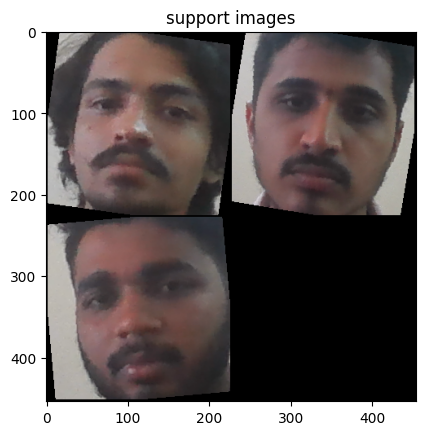

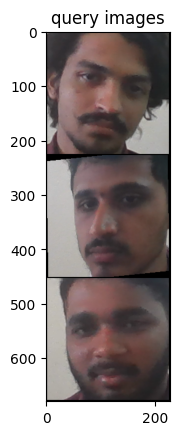

In [ ]:
import matplotlib.pyplot as plt
import torchvision
def plot_images(images: Tensor, title: str, images_per_row: int):

    plt.figure()
    plt.title(title)
    plt.imshow(
        torchvision.utils.make_grid(images, nrow=images_per_row).permute(1, 2, 0)
    )

(
    example_support_images,
    example_support_labels,
    example_query_images,
    example_query_labels,
    example_class_ids,
) = next(iter(val_loader))

#print(example_support_images.cpu().numpy())
plot_images(example_support_images.cpu(), "support images", images_per_row=2)
plot_images(example_query_images.cpu(), "query images", images_per_row=1)

In [ ]:
!pip install efficientnet_pytorch

  Using cached efficientnet_pytorch-0.7.1.tar.gz (21 kB)
  Preparing metadata (setup.py) ... done
  Using cached nvidia_cuda_nvrtc_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (23.7 MB)
  Using cached nvidia_cuda_runtime_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (823 kB)
  Using cached nvidia_cuda_cupti_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (14.1 MB)
  Using cached nvidia_cudnn_cu12-8.9.2.26-py3-none-manylinux1_x86_64.whl (731.7 MB)
  Using cached nvidia_cublas_cu12-12.1.3.1-py3-none-manylinux1_x86_64.whl (410.6 MB)
  Using cached nvidia_cufft_cu12-11.0.2.54-py3-none-manylinux1_x86_64.whl (121.6 MB)
  Using cached nvidia_curand_cu12-10.3.2.106-py3-none-manylinux1_x86_64.whl (56.5 MB)
  Using cached nvidia_cusolver_cu12-11.4.5.107-py3-none-manylinux1_x86_64.whl (124.2 MB)
  Using cached nvidia_cusparse_cu12-12.1.0.106-py3-none-manylinux1_x86_64.whl (196.0 MB)
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 166.0/166.0 MB 1.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━

In [ ]:

from efficientnet_pytorch import EfficientNet
from torchsummary import summary
import torch
import torch.nn as nn
efficientnet= EfficientNet.from_pretrained('efficientnet-b1')
#summary(model, (3,224,224))
efficientnet.fc=nn.Flatten()


Downloading: "https://github.com/lukemelas/EfficientNet-PyTorch/releases/download/1.0/efficientnet-b1-f1951068.pth" to /root/.cache/torch/hub/checkpoints/efficientnet-b1-f1951068.pth
100%|██████████| 30.1M/30.1M [00:00<00:00, 92.9MB/s]


Loaded pretrained weights for efficientnet-b1


In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from torchvision.models import resnet18




class MetaBaseline_(nn.Module):

    def __init__(self, backbone, method='cos',temp=10., temp_learnable=True):
        super().__init__()
        self.backbone = backbone
        self.method = method
        #self.compute_logits()

        if temp_learnable:
            self.temp = nn.Parameter(torch.tensor(temp))
        else:
            self.temp = temp

    def compute_logits(self,proto , feat, metric, temp=1.0):
        print(feat.shape)
        print(proto.shape)

        assert feat.dim() == proto.dim()

        #print(feat.ndim())

        if feat.dim() == 2:
            if metric == 'dot':
                logits = torch.mm(feat, proto.t())
            elif metric == 'cos':
                #feat = F.normalize(feat, p=2, dim=1)
                #proto = F.normalize(proto, p=2, dim=1)

                logits = torch.mm(feat, proto.t())
                print(feat.shape);print(proto.t().shape)
                logits1 = F.cosine_similarity(feat, proto, dim = -1)
                print(logits1)
            elif metric == 'sqr':
                logits = -(feat.unsqueeze(1) -
                          proto.unsqueeze(0)).pow(2).sum(dim=-1)
        '''
        elif feat.dim() == 3:
            if metric == 'dot':
                logits = torch.bmm(feat, proto.permute(0, 2, 1))
            elif metric == 'cos':
                #feat = F.normalize(feat, p=2, dim=1)
                #proto = F.normalize(proto, p=2, dim=1)
                logits = torch.bmm(feat,proto.permute(0, 2, 1))

            elif metric == 'sqr':
                logits = -(feat.unsqueeze(2) -
                          proto.unsqueeze(1)).pow(2).sum(dim=-1)
        '''
        return logits * temp

    def forward(self, support_images, support_labels, query_images):
        '''
        x_shot = support_images; print(support_images.shape)
        x_query = query_images ; print(query_images.shape)
        shot_shape = x_shot.shape[:-3] ;print(shot_shape)
        query_shape = x_query.shape[:-3] ;print(query_shape)
        img_shape = x_shot.shape[-3:] ;print(img_shape)

        x_shot = x_shot.view(-1, *img_shape)
        x_query = x_query.view(-1, *img_shape)
        x_tot = self.backbone(torch.cat([x_shot, x_query], dim=0))
        x_shot, x_query = x_tot[:len(x_shot)], x_tot[-len(x_query):]
        x_shot = x_shot.view(*shot_shape, -1) ; print(f"shot_shape : {x_shot.shape}")
        x_query = x_query.view(*query_shape, -1) ; print(f"query_shape : {x_query.shape}")
        '''
        z_support = self.backbone.forward(support_images)
        z_query = self.backbone.forward(query_images)


        n_way = len(torch.unique(support_labels))
        # Mean of of the support set shot images
        z_proto = torch.cat(
            [
                z_support[torch.nonzero(support_labels == label)].mean(0)
                for label in range(n_way)
            ]
        )

        # Normalization (optional)
        z_proto = F.normalize(z_proto, p=2 , dim=-1)
        z_query = F.normalize(z_query, p=2 , dim = -1)

        if self.method == 'dot':
          metric = 'dot'

        elif self.method == 'cos':
          metric = 'cos'

        elif self.method == 'sqr' :

          metric = 'sqr'

        print(f"Metric = {metric}")
        logits = self.compute_logits(z_proto, z_query, metric, self.temp)
        #print(logits)
        return logits

if torch.cuda.is_available():
  device=torch.device('cuda:0')
else:
  device=torch.device('cpu')
convolutional_network = resnet18(pretrained=True)
convolutional_network.fc = nn.Flatten()
#print(convolutional_network)

model = MetaBaseline_(convolutional_network).to(device)
#model = MetaBaseline_(efficientnet).to(device)
####################### validation data ######################
(
    example_support_images,
    example_support_labels,
    example_query_images,
    example_query_labels,
    example_class_ids,
) = next(iter(test_loader))

 ###########################################################
model.eval()
example_scores = model(
    example_support_images,
    example_support_labels,
    example_query_images,

)
print(example_scores.data)
#print(example_scores)
_, example_predicted_labels = torch.max(example_scores, 1)

correct=0

print("Ground Truth / Predicted")
for i in range(len(example_query_labels)):
    print(f"{example_query_labels[i]} / {example_predicted_labels[i]}")
    if example_query_labels[i] == example_predicted_labels[i]:
      correct+=1
accuracy=correct / len(example_query_labels)
print(f"accuracy = {accuracy}")


/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Support images shape = torch.Size([4, 3, 224, 224])

Support image Labels :
tensor([1, 0, 2, 3])

Query images shape = torch.Size([4, 3, 224, 224])

Query image Labels :
tensor([1, 0, 2, 3])

True Class Id:
[0, 1, 2, 3]

Metric = cos
torch.Size([4, 512])
torch.Size([4, 512])
torch.Size([4, 512])
torch.Size([512, 4])
tensor([0.8471, 0.8112, 0.8144, 0.9641], grad_fn=<SumBackward1>)
tensor([[8.4710, 8.9867, 8.9988, 8.6312],
        [9.7377, 8.1121, 8.1089, 7.8582],
        [7.8488, 8.9165, 8.1435, 8.2527],
        [7.9842, 8.1721, 8.8105, 9.6413]])
Ground Truth / Predicted
1 / 2
0 / 0
2 / 1
3 / 3
accuracy = 0.5


In [ ]:
import torch
import torch.nn.functional as F

feat = torch.tensor([[1, 2, 3],
                     [4, 5, 6]], dtype=torch.float32)
proto = torch.tensor([[2, 3, 4],
                      [5, 6, 7]], dtype=torch.float32)

# Normalize along dimension 1
feat_normalized = F.normalize(feat, p=2, dim=1)
proto_normalized = F.normalize(proto, p=2, dim=1)

# Compute matrix multiplication
cosine_similarity_manual = torch.mm(feat_normalized, proto_normalized.t())
print("Cosine Similarity (Manual):\n", cosine_similarity_manual)

# Reshape feat and proto to (batch_size, embedding_size)
#feat = feat.view(1, -1)
#proto = proto.view(1, -1)

# Compute cosine similarity using F.cosine_similarity()
cosine_similarity_direct = F.cosine_similarity(feat, proto, dim=1)
print("Cosine Similarity (Direct):\n", cosine_similarity_direct)


Cosine Similarity (Manual):
 tensor([[0.9926, 0.9683],
        [0.9946, 0.9996]])
Cosine Similarity (Direct):
 tensor([0.9926, 0.9996])


In [ ]:
import torch

def cosine_similarity_manual(x1, x2):
    # Compute dot product
    dot_product = torch.sum(x1 * x2, dim=1)

    # Compute magnitudes
    magnitude_x1 = torch.sqrt(torch.sum(x1 ** 2, dim=1))
    magnitude_x2 = torch.sqrt(torch.sum(x2 ** 2, dim=1))

    # Compute cosine similarity
    similarity = dot_product / (magnitude_x1 * magnitude_x2)

    return similarity

# Example feature vectors
feat = torch.tensor([[1, 2, 3],
                     [4, 5, 6]], dtype=torch.float32)
proto = torch.tensor([[2, 3, 4],
                      [5, 6, 7]], dtype=torch.float32)

# Compute cosine similarity using the manual function
cosine_similarity_manual_result = cosine_similarity_manual(feat, proto)
print("Cosine Similarity (Manual):\n", cosine_similarity_manual_result)


Cosine Similarity (Manual):
 tensor([0.9926, 0.9996])


In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from torchvision.models import resnet18

class MetaBaseline(nn.Module):

    def __init__(self, backbone, method='cos', temp=1.0, temp_learnable=True):
        super().__init__()
        self.backbone = backbone
        self.method = method
        #self.compute_logits()

        if temp_learnable:
            self.temp = nn.Parameter(torch.tensor(temp)).to(device)
        else:

            self.temp = temp
    '''
    def compute_logits(self, a, b, metric, temp=1.0):
      """
      Computes the logits based on the given similarity metric.

      Args:
          a (torch.Tensor): Support images embeddings.
          b (torch.Tensor): Query images embeddings.
          metric (str): The similarity metric to be used ('dot', 'cos', or 'sqr').
          temp (float): Temperature parameter for scaling logits. Default is 1.0.

      Returns:
          torch.Tensor: The computed logits.
      """

      # Ensure input shapes are valid
      #assert a.dim() == 3 and b.dim() == 3

      if metric == 'dot' or metric == 'cos':
          # Normalize embeddings if using cosine similarity
          if metric == 'cos':
              a = F.normalize(a, p=2, dim=-1)
              b = F.normalize(b, p=2, dim=-1)

          # Compute pairwise similarity scores
          logits = torch.matmul(a.unsqueeze(1), b.unsqueeze(2)).squeeze()

      elif metric == 'sqr':
          # Compute squared Euclidean distance
          logits = -((a.unsqueeze(1) - b.unsqueeze(2))**2).sum(dim=-1)

      # Scale logits by temperature
      logits *= temp

      return logits

    #'''
    def compute_logits(self,a, b, metric, temp=1.0):
        print("Shape of a(Support Image) : ", a.shape);print();print(f"Shape of b(query Image): {b.shape}")
        #assert a.dim() == 3 and b.dim() == 3

        if metric == 'dot':
          f = []
          for i in range(b.shape[0]):
              f.append([])
              for j in range(a.shape[0]):
                  f[-1].append([])
                  for k in range(a.shape[1]):
                      # print(a[j][k].unsqueeze(0));print(b[i].unsqueeze(1))
                      mul = torch.matmul(a[j][k].unsqueeze(0), b[i].unsqueeze(1))

                      f[-1][-1].append(mul[0][0].item())
          logits = torch.tensor(f)
          #print("Result f:",logits )
          #print(logits.shape)
          logits,_=torch.max(logits,dim=2)
          #logits=logits / temp  #;print(logits.shape)
          #print(logits)

        elif metric == 'cos':
            a=F.normalize(a,p=2,dim=-1)
            b=F.normalize(b,p=2,dim=-1)

            f = []
            for i in range(b.shape[0]):
                f.append([])
                for j in range(a.shape[0]):
                    f[-1].append([])
                    for k in range(a.shape[1]):
                        # print(a[j][k].unsqueeze(0));print(b[i].unsqueeze(1))
                        mul = torch.matmul(a[j][k].unsqueeze(0), b[i].unsqueeze(1))

                        f[-1][-1].append(mul[0][0].item())
            logits = torch.tensor(f)
            #print(logits)
            #print("Result f:",logits )
            #print(logits.shape)
            logits,_=torch.max(logits,dim=2)
            #print(logits)
            #logits = logits / temp #;print(logits.shape)
            #print(logits)
        elif metric == 'sqr':
          b=b.unsqueeze(1)
          f = []
          for i in range(b.shape[0]):
              f.append([])
              for j in range(a.shape[0]):
                  f[-1].append([])
                  for k in range(a.shape[1]):
                      #print(a[j][k].unsqueeze(0)); print(b[i]);print()
                      mul = - (a[j][k].unsqueeze(0) - b[i]).pow(2).sum(dim=-1)

                      f[-1][-1].append(mul[0])
          #print(f)
          logits = torch.tensor(f)
          #print("Result f:",logits )
          #print(logits.shape)
          logits,_=torch.max(logits,dim=2) #;print(logits.shape)
          print(logits.device)
          print(self.temp.device)

        logits = logits.to(device) * self.temp

        # Additional ( Similarity Based similarity)

        #logits= F.softmax(logits, dim=-1)
        #print(f"Logits = {logits}")
        return logits
      #'''
    def forward(self, support_images, support_labels, query_images):
        '''
        x_shot = support_images; print(support_images.shape)
        x_query = query_images ; print(query_images.shape)
        shot_shape = x_shot.shape[:-3] ;print(shot_shape)
        query_shape = x_query.shape[:-3] ;print(query_shape)
        img_shape = x_shot.shape[-3:] ;print(img_shape)

        x_shot = x_shot.view(-1, *img_shape)
        x_query = x_query.view(-1, *img_shape)
        x_tot = self.backbone(torch.cat([x_shot, x_query], dim=0))
        x_shot, x_query = x_tot[:len(x_shot)], x_tot[-len(x_query):]
        x_shot = x_shot.view(*shot_shape, -1) ; print(f"shot_shape : {x_shot.shape}")
        x_query = x_query.view(*query_shape, -1) ; print(f"query_shape : {x_query.shape}")
        '''
        z_support = self.backbone.forward(support_images)
        z_query = self.backbone.forward(query_images)


        n_way = len(torch.unique(support_labels))


        z_proto = torch.cat(
        [
            z_support[torch.nonzero(support_labels == label)]
            for label in range(0, n_way,1)
        ] , dim=1
        )
        z_proto = z_support.view(n_way, -1, z_support.size(-1))

        # Normalization (optional)
        #z_proto = F.normalize(z_proto, p=2 , dim=-1)
        #z_query = F.normalize(z_query, p=2 , dim = -1)



        if self.method == 'cos':
            metric = 'cos'
            print(metric)
        elif self.method == 'sqr':
            metric = 'sqr'
            print(metric)
        elif self.method == 'dot':
            metric = 'dot'
            print(metric)

        logits = self.compute_logits(z_proto, z_query, metric, self.temp)



        #print(logit1);print();print(logit2)
        return logits

if torch.cuda.is_available():
  device=torch.device('cuda:0')
else:
  device=torch.device('cpu')
convolutional_network = resnet18(pretrained=True)
convolutional_network.fc = nn.Flatten()
#print(convolutional_network)

model = MetaBaseline(efficientnet).to(device)

####################### validation data ######################
(
    example_support_images,
    example_support_labels,
    example_query_images,
    example_query_labels,
    example_class_ids,
) = next(iter(test_loader))

 ###########################################################


model.eval()
example_scores = model(
    example_support_images,
    example_support_labels,
    example_query_images,

)
#print(example_scores.data)
print(example_scores)
_, example_predicted_labels = torch.max(example_scores, 1)

correct=0

print("Ground Truth / Predicted")
for i in range(len(example_query_labels)):
    print(f"{example_query_labels[i]} / {example_predicted_labels[i]}")
    if example_query_labels[i] == example_predicted_labels[i]:
      correct+=1
accuracy=correct / len(example_query_labels)
print(f"accuracy = {accuracy}")


Support images shape = torch.Size([4, 3, 224, 224])

Support image Labels :
tensor([3, 0, 2, 1])

Query images shape = torch.Size([4, 3, 224, 224])

Query image Labels :
tensor([3, 0, 2, 1])

True Class Id:
[0, 1, 2, 3]

cos
Shape of a(Support Image) :  torch.Size([4, 1, 1000])

Shape of b(query Image): torch.Size([4, 1000])
tensor([[0.9282, 0.7162, 0.9008, 0.8360],
        [0.6913, 0.9588, 0.7148, 0.7637],
        [0.8090, 0.6964, 0.9894, 0.8915],
        [0.7096, 0.5930, 0.8298, 0.8856]], grad_fn=<MulBackward0>)
Ground Truth / Predicted
3 / 0
0 / 1
2 / 2
1 / 3
accuracy = 0.25


In [ ]:
import torch.nn as nn
import torch
from torchvision.models import resnet18
import torch.nn. functional as F
class MetaBaseline_(nn.Module):

    def __init__(self, backbone, method='cos',temp=10., temp_learnable=True):
        super().__init__()
        self.backbone = backbone
        self.method = method
        #self.compute_logits()

        if temp_learnable:
            self.temp = nn.Parameter(torch.tensor(temp))
        else:
            self.temp = temp

    def compute_logits(self,proto , feat, metric, temp=1.0):
        print(feat.shape)
        print(proto.shape)

        assert feat.dim() == proto.dim()

        #print(feat.ndim())

        if feat.dim() == 2:
            if metric == 'dot':
                logits = torch.mm(feat, proto.t())
            elif metric == 'cos':
                #feat = F.normalize(feat, p=2, dim=1)
                #proto = F.normalize(proto, p=2, dim=1)

                logits = torch.mm(feat, proto.t())
            elif metric == 'sqr':
                logits = -(feat.unsqueeze(1) -
                          proto.unsqueeze(0)).pow(2).sum(dim=-1)

        elif feat.dim() == 3:
            if metric == 'dot':
                logits = torch.bmm(feat, proto.permute(0, 2, 1))
            elif metric == 'cos':
                #feat = F.normalize(feat, p=2, dim=1)
                #proto = F.normalize(proto, p=2, dim=1)
                logits = torch.bmm(feat,proto.permute(0, 2, 1))

            elif metric == 'sqr':
                logits = -(feat.unsqueeze(2) -
                          proto.unsqueeze(1)).pow(2).sum(dim=-1)
        logits = logits.to(device) * self.temp
        return logits * temp

    def forward(self, support_images, support_labels, query_images):

        z_support = self.backbone.forward(support_images)
        z_query = self.backbone.forward(query_images)


        n_way = len(torch.unique(support_labels))
        # Mean of of the support set shot images
        z_proto = torch.cat(
            [
                z_support[torch.nonzero(support_labels == label)].mean(0)
                for label in range(n_way)
            ]
        )

        # Normalization (optional)
        z_proto = F.normalize(z_proto, p=2 , dim=-1)
        z_query = F.normalize(z_query, p=2 , dim = -1)

        if self.method == 'dot':
          metric = 'dot'

        elif self.method == 'cos':
          metric = 'cos'

        elif self.method == 'sqr' :

          metric = 'sqr'

        print(f"Metric = {metric}")
        logits = self.compute_logits(z_proto, z_query, metric, self.temp)
        #print(logits)
        return logits

if torch.cuda.is_available():
  device=torch.device('cuda:0')
else:
  device=torch.device('cpu')
convolutional_network = resnet18(pretrained=True)
convolutional_network.fc = nn.Flatten()


#!pip install efficientnet_pytorch
from efficientnet_pytorch import EfficientNet
from torchsummary import summary
import torch
import torch.nn as nn
efficientnet= EfficientNet.from_pretrained('efficientnet-b1')
#summary(model, (3,224,224))
efficientnet.fc=nn.Flatten()

Loaded pretrained weights for efficientnet-b1


In [ ]:
'''
#  Meta Baseline Traing


# Wrong method
def training(epochs, train_loader,val_loader):
  model = MetaBaseline_(efficientnet).to(device)
  criterion=torch.nn.CrossEntropyLoss().to(device)
  optimizer=torch.optim.SGD(model.parameters(),lr=0.01)
  report={
      'loss' : [],
  }
  for epoch in range(epochs):
    loss=0.0
    for support_image,support_label,query_image,query_label,_ in train_loader:
      model.train()
      optimizer.zero_grad()
      logits = model(support_image,support_label,query_image)
      #print(logits.device);print(query_label.device)
      loss = criterion(logits,query_label.to(device))
      loss+=loss.item()
      loss.backward()
      optimizer.step()
    report['loss'].append(loss / len(train_loader))


    # Validation
    for support_image,support_label,query_image,query_label, _ in val_loader:
      model.eval()
      example_scores = model( support_image, support_label, query_image)
      _, example_predicted_labels = torch.max(example_scores, 1)
      print(example_predicted_labels)
      print(query_label)

      correct=0
      for i in range(len(query_label)):
        if (query_label[i] == example_predicted_labels[i]):
          correct+=1
    accuracy=correct / len(query_label)

    print(f"Epoch {epoch + 1} / {epochs} Loss : {loss / len(train_loader)} Validation Accuracy : {accuracy}")
  return model, report


model_metabaseline, report = training(10, train_loader, val_loader)

'''
print()





In [ ]:
# Modified model

import torch
import torch.nn as nn
import torch.nn.functional as F
from torchvision.models import resnet18
from efficientnet_pytorch import EfficientNet


class MetaBaseline(nn.Module):

    def __init__(self, backbone, method='cos', temp=1.0, temp_learnable=True):
        super().__init__()
        self.backbone = backbone
        self.method = method
        #self.compute_logits()

        if temp_learnable:
            self.temp = nn.Parameter(torch.tensor(temp)).to(device)
        else:

            self.temp = temp

    def compute_logits(self,a, b, metric, temp=1.0):
        print("Shape of a(Support Image) : ", a.shape);print();print(f"Shape of b(query Image): {b.shape}")
        #assert a.dim() == 3 and b.dim() == 3

        if metric == 'dot':
          f = []
          for i in range(b.shape[0]):
              f.append([])
              for j in range(a.shape[0]):
                  f[-1].append([])
                  for k in range(a.shape[1]):
                      # print(a[j][k].unsqueeze(0));print(b[i].unsqueeze(1))
                      mul = torch.matmul(a[j][k].unsqueeze(0), b[i].unsqueeze(1))

                      f[-1][-1].append(mul[0][0].item())
          logits = torch.tensor(f)
          #print("Result f:",logits )
          #print(logits.shape)
          logits,_=torch.max(logits,dim=2)
          #logits=logits / temp  #;print(logits.shape)
          #print(logits)

        elif metric == 'cos':
            a=F.normalize(a,p=2,dim=-1)
            b=F.normalize(b,p=2,dim=-1)

            f = []
            for i in range(b.shape[0]):
                f.append([])
                for j in range(a.shape[0]):
                    f[-1].append([])
                    for k in range(a.shape[1]):
                        # print(a[j][k].unsqueeze(0));print(b[i].unsqueeze(1))
                        mul = torch.matmul(a[j][k].unsqueeze(0), b[i].unsqueeze(1))

                        f[-1][-1].append(mul[0][0].item())
            logits = torch.tensor(f)
            #print("Result f:",logits )
            #print(logits.shape)
            logits,_=torch.max(logits,dim=2)
            #print(logits)
            #logits = logits / temp #;print(logits.shape)
            #print(logits)
        elif metric == 'sqr':
          b=b.unsqueeze(1)
          f = []
          for i in range(b.shape[0]):
              f.append([])
              for j in range(a.shape[0]):
                  f[-1].append([])
                  for k in range(a.shape[1]):
                      #print(a[j][k].unsqueeze(0)); print(b[i]);print()
                      mul = - (a[j][k].unsqueeze(0) - b[i]).pow(2).sum(dim=-1)

                      f[-1][-1].append(mul[0])
          #print(f)
          logits = torch.tensor(f)
          #print("Result f:",logits )
          #print(logits.shape)
          logits,_=torch.max(logits,dim=2) #;print(logits.shape)
          print(logits.device)
          print(self.temp.device)

        logits = logits.to(device) * self.temp

        # Additional ( Similarity Based similarity)

        #logits= F.softmax(logits, dim=-1)
        #print(f"Logits = {logits}")
        return logits
      #'''
    def forward(self, support_images, support_labels, query_images):

        z_support = self.backbone.forward(support_images)
        z_query = self.backbone.forward(query_images)


        n_way = len(torch.unique(support_labels))


        z_proto = torch.cat(
        [
            z_support[torch.nonzero(support_labels == label)]
            for label in range(0, n_way,1)
        ] , dim=1
        )
        z_proto = z_support.view(n_way, -1, z_support.size(-1))

        # Normalization (optional)
        #z_proto = F.normalize(z_proto, p=2 , dim=-1)
        #z_query = F.normalize(z_query, p=2 , dim = -1)



        if self.method == 'cos':
            metric = 'cos'
            print(metric)
        elif self.method == 'sqr':
            metric = 'sqr'
            print(metric)
        elif self.method == 'dot':
            metric = 'dot'
            print(metric)

        logits = self.compute_logits(z_proto, z_query, metric, self.temp)



        #print(logit1);print();print(logit2)
        return logits

if torch.cuda.is_available():
  device=torch.device('cuda:0')
else:
  device=torch.device('cpu')
convolutional_network = resnet18(pretrained=True)
convolutional_network.fc = nn.Flatten()

efficientnet = EfficientNet.from_pretrained('efficientnet-b1')
efficientnet.fc = nn.Flatten()


Loaded pretrained weights for efficientnet-b1


In [ ]:
'''
#  Meta Baseline Traing  (wrong method)

def training(epochs, train_loader,val_loader):
  #model = MetaBaseline(convolutional_network).to(device)
  model = MetaBaseline(efficientnet).to(device)
  criterion=torch.nn.CrossEntropyLoss().to(device)
  optimizer=torch.optim.SGD(model.parameters(),lr=0.01)
  report={
      'loss' : [],
  }
  for epoch in range(epochs):
    loss=0.0
    for support_image,support_label,query_image,query_label,_ in train_loader:
      model.train()
      optimizer.zero_grad()
      logits = model(support_image,support_label,query_image)
      #print(logits.device);print(query_label.device)
      loss = criterion(logits,query_label.to(device))
      loss+=loss.item()
      loss.backward()
      optimizer.step()
    report['loss'].append(loss / len(train_loader))


    # Validation
    for support_image,support_label,query_image,query_label, _ in val_loader:
      model.eval()
      example_scores = model( support_image, support_label, query_image)
      _, example_predicted_labels = torch.max(example_scores, 1)
      print(example_predicted_labels)
      print(query_label)

      correct=0
      for i in range(len(query_label)):
        if (query_label[i] == example_predicted_labels[i]):
          correct+=1
    accuracy=correct / len(query_label)

    print(f"Epoch {epoch + 1} / {epochs} Loss : {loss / len(train_loader)} Validation Accuracy : {accuracy}")
  return model, report


model_metabaseline, report = training(50, train_loader, val_loader)



'''
print()



In [ ]:
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
from tqdm import tqdm
import warnings
warnings.filterwarnings('ignore')

if torch.cuda.is_available():
    device = torch.device('cuda')
else:
    device = torch.device('cpu')

#######################################################
# Custom Dataset Creation
import os
import cv2
import numpy as np
import torch
import torchvision.transforms as transforms
from torch.utils.data import Dataset, DataLoader
from PIL import Image
import hashlib
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder

transform = transforms.Compose([
    transforms.ToTensor(),  # Convert to tensor
])

def augment_and_save_images(image_path, class_name):
    images = []
    labels = []
    transformations = [
        transforms.RandomVerticalFlip(p=0.5),
        transforms.RandomAffine(degrees=10, shear=10),
        #transforms.RandomCrop(size=224, padding=20),
        transforms.RandomPerspective(distortion_scale=0.2, p=0.5),
        transforms.RandomRotation(degrees=10),
    ]
    generated_images = set()

    original_image = Image.open(image_path)
    original_image = original_image.resize((224, 224))
    original_image_array = np.array(original_image)

    images.append(original_image_array)
    labels.append(class_name)

    for transform_fn in transformations:
        augmented_image = transform_fn(original_image)
        augmented_image_array = np.array(augmented_image)
        image_hash = hashlib.sha256(augmented_image_array.tobytes()).hexdigest()
        if image_hash not in generated_images:
            generated_images.add(image_hash)
            images.append(augmented_image_array)
            labels.append(class_name)
    #print(images)
    return images, labels

class CustomDataset(Dataset):
    def __init__(self, folder_path, transform,split,device):
        self.folder_path = folder_path
        self.transform = transform
        self.class_names= ['Cyst','Normal','Stone','Tumor']
        self.le=LabelEncoder()
        self.device=device
        self.images = []
        self.labels = []
        self.split=split
        self.load_data()

    def load_data(self):
        class_names = ['Cyst','Normal','Stone','Tumor']
        for class_name in class_names:
            class_path = os.path.join(self.folder_path, class_name)
            for image_name in os.listdir(class_path):
                if not image_name.startswith('_DS_Store'):
                    image_path = os.path.join(class_path, image_name)

                    augmented_images, label = augment_and_save_images(image_path, class_name)
                    self.images.extend(augmented_images)
                    self.labels.extend(label)

        self.labels=self.le.fit_transform(self.labels)

        x_train,x_mid,y_train,y_mid=train_test_split(self.images,self.labels,test_size=0.3)
        x_val,x_test,y_val,y_test=train_test_split(x_mid,y_mid,test_size=0.5)
        #print(len(y_train));print(len(x_val))
        if self.split=='train':
          self.images=x_train
          self.labels=y_train
          print("Train")

        if self.split=='val':
          self.images=x_val
          self.labels=y_val
          print("Val")

        if self.split=='test':
          self.images=x_test
          self.labels=y_test
          print("Test")

        return self.images,self.labels

    def __getitem__(self, index):
      image = self.images[index]
      label = self.labels[index]

      if self.transform:
        image=self.transform(image)

      image=image.to(self.device)
      label=torch.tensor(label,device=self.device)

      return image,label

    def __len__(self):
        return len(self.images)

    def get_labels(self):
      return self.labels

    def number_of_classes(self):
      return len(self.class_names)

if torch.cuda.is_available():
  device=torch.device('cuda:0')
else:
  device=torch.device('cpu')


path = "/content/drive/MyDrive/Medical_cv/CT-KIDNEY-DATASET-Normal-Cyst-Tumor-Stone(just 10 image each)"

val_data = CustomDataset(path, transform,split='val',device=device)
train_data = CustomDataset(path,transform,split='train',device=device)
test_data = CustomDataset(path,transform,split='test', device=device)

print(f"Number of datapoints in train data = {len(train_data)} \nNumber of datapoints in test data = {len(test_data)} \nNumber of datapoints in validation set = {len(val_data)}")

########################################################
# Data Loading
from torch import Tensor
import random
from torch.utils.data import Sampler

class TaskSampler(Sampler):
    def __init__(self, dataset, n_way ,n_shot ,n_query, n_tasks):

        super().__init__(data_source=None)
        self.n_way = n_way
        self.n_shot = n_shot
        self.n_query = n_query
        self.n_tasks = n_tasks

        self.items_per_label  = {}

        for item, label in enumerate(dataset.get_labels()):
            if label in self.items_per_label:
                self.items_per_label[label].append(item)
            else:
                self.items_per_label[label] = [item]

        self._check_dataset_size_fits_sampler_parameters()

    def __len__(self):
        return self.n_tasks

    def __iter__(self):

        for _ in range(self.n_tasks):
            yield torch.cat(
                [
                    torch.tensor(
                        random.sample(  #random.sample(population, k)
                            self.items_per_label[label], self.n_shot + self.n_query
                        )
                    )
                    for label in random.sample(
                        sorted(self.items_per_label.keys()), self.n_way
                    )
                ]
            ).tolist()

    def episodic_collate_fn(self, input_data) :

        input_data_with_int_labels = self._cast_input_data_to_tensor_int_tuple(input_data)
        true_class_ids = list({x[1] for x in input_data_with_int_labels})
        all_images = torch.cat([x[0].unsqueeze(0) for x in input_data_with_int_labels])
        all_images = all_images.reshape(
            (self.n_way, self.n_shot + self.n_query, *all_images.shape[1:])
        )
        all_labels = torch.tensor(
            [true_class_ids.index(x[1]) for x in input_data_with_int_labels]
        ).reshape((self.n_way, self.n_shot + self.n_query))
        support_images = all_images[:, : self.n_shot].reshape(
            (-1, *all_images.shape[2:])
        )
        query_images = all_images[:, self.n_shot :].reshape((-1, *all_images.shape[2:]))
        support_labels = all_labels[:, : self.n_shot].flatten()
        query_labels = all_labels[:, self.n_shot :].flatten()
        '''
        print(f"Support images shape = {support_images.shape}")
        print()
        print(f"Support image Labels :\n{support_labels}")
        print()
        print(f"Query images shape = {query_images.shape}")
        print()
        print(f"Query image Labels :\n{query_labels}")
        print()
        print(f"True Class Id:\n{true_class_ids}")
        print()
        '''
        return (
            support_images,
            support_labels,
            query_images,
            query_labels,
            true_class_ids,
        )

    @staticmethod
    def _cast_input_data_to_tensor_int_tuple(input_data):

        for image, label in input_data:
            if not isinstance(image, Tensor):
                raise TypeError(f"Illegal type of input instance: {type(image)}. " )
            if not isinstance(label, int):
                if not isinstance(label, Tensor):
                    raise TypeError(f"Illegal type of input label: {type(label)}. "  )
                if label.dtype not in {
                    torch.uint8,
                    torch.int8,
                    torch.int16,
                    torch.int32,
                    torch.int64,
                }:
                    raise TypeError(f"Illegal dtype of input label tensor: {label.dtype}. "  )
                if label.ndim != 0:
                    raise ValueError(f"Illegal shape for input label tensor: {label.shape}. ")

        return [(image, int(label)) for (image, label) in input_data]

    def _check_dataset_size_fits_sampler_parameters(self):

        self._check_dataset_has_enough_labels()
        self._check_dataset_has_enough_items_per_label()

    def _check_dataset_has_enough_labels(self):
        print(f"The number of labels in the dataset = {len(self.items_per_label)}")
        if self.n_way > len(self.items_per_label):
            raise ValueError(
                f"The number of labels in the dataset ({len(self.items_per_label)} "
                f"must be greater or equal to n_way ({self.n_way})."
            )

    def _check_dataset_has_enough_items_per_label(self):
        number_of_samples_per_label = [
            len(items_for_label) for items_for_label in self.items_per_label.values()
        ]
        minimum_number_of_samples_per_label = min(number_of_samples_per_label)
        label_with_minimum_number_of_samples = number_of_samples_per_label.index(
            minimum_number_of_samples_per_label
        )
        print(f"number_of_samples_per_label = {number_of_samples_per_label}")
        print(f"label_with_minimum_number_of_samples = {label_with_minimum_number_of_samples}")
        print(f"minimum_number_of_samples_per_label = {minimum_number_of_samples_per_label} \n")
        if self.n_shot + self.n_query > minimum_number_of_samples_per_label:
            raise ValueError(
                f"Label {label_with_minimum_number_of_samples} has only {minimum_number_of_samples_per_label} samples"
                f"but all classes must have at least n_shot + n_query ({self.n_shot + self.n_query}) samples."
            )
print()
print()
def data_loader(data,N_WAY,N_SHOT,N_QUERY,N_EVALUATION_TASKS):
  #N_WAY = 4 # Number of classes in a task
  #N_SHOT = 2 # Number of images per class in the support set
  #N_QUERY = 2 # Number of images per class in the query set
  #N_EVALUATION_TASKS = 100

  test_sampler = TaskSampler(
      data, n_way=N_WAY, n_shot=N_SHOT, n_query=N_QUERY, n_tasks=N_EVALUATION_TASKS
  )

  data_loader = DataLoader(
      data,
      batch_sampler=test_sampler,

      pin_memory=False,
      collate_fn=test_sampler.episodic_collate_fn,
  )
  return data_loader

train_loader=data_loader(train_data,4,25,3,10)
test_loader=data_loader(test_data,4,1,1,10)
val_loader=data_loader(val_data,4,1,1,10)
#########################################################
# Model creation
import torch.nn as nn
import torch
from torchvision.models import resnet18
import torch.nn. functional as F
class MetaBaseline_(nn.Module):

    def __init__(self, backbone, method='cos',temp=10., temp_learnable=True):
        super().__init__()
        self.backbone = backbone
        self.method = method
        #self.compute_logits()

        if temp_learnable:
            self.temp = nn.Parameter(torch.tensor(temp))
        else:
            self.temp = temp

    def compute_logits(self,proto , feat, metric, temp=1.0):
        #print(feat.shape)
        #print(proto.shape)

        assert feat.dim() == proto.dim()

        #print(feat.ndim())

        if feat.dim() == 2:
            if metric == 'dot':
                logits = torch.mm(feat, proto.t())
            elif metric == 'cos':
                feat = F.normalize(feat, p=2, dim=1)
                proto = F.normalize(proto, p=2, dim=1)

                logits = torch.mm(feat, proto.t())
            elif metric == 'sqr':
                logits = -(feat.unsqueeze(1) -
                          proto.unsqueeze(0)).pow(2).sum(dim=-1)

        elif feat.dim() == 3:
            if metric == 'dot':
                logits = torch.bmm(feat, proto.permute(0, 2, 1))
            elif metric == 'cos':
                feat = F.normalize(feat, p=2, dim=1)
                proto = F.normalize(proto, p=2, dim=1)
                logits = torch.bmm(feat,proto.permute(0, 2, 1))

            elif metric == 'sqr':
                logits = -(feat.unsqueeze(2) -
                          proto.unsqueeze(1)).pow(2).sum(dim=-1)
        logits = logits.to(device) * self.temp
        return logits * temp

    def forward(self, support_images, support_labels, query_images):

        z_support = self.backbone.forward(support_images)
        z_query = self.backbone.forward(query_images)


        n_way = len(torch.unique(support_labels))
        # Mean of of the support set shot images
        z_proto = torch.cat(
            [
                z_support[torch.nonzero(support_labels == label)].mean(0)
                for label in range(n_way)
            ]
        )

        # Normalization (optional)
        #z_proto = F.normalize(z_proto, p=2 , dim=-1)
        #z_query = F.normalize(z_query, p=2 , dim = -1)

        if self.method == 'dot':
          metric = 'dot'

        elif self.method == 'cos':
          metric = 'cos'

        elif self.method == 'sqr' :

          metric = 'sqr'

        #print(f"Metric = {metric}")
        logits = self.compute_logits(z_proto, z_query, metric, self.temp)
        #print(logits)
        return logits

if torch.cuda.is_available():
  device=torch.device('cuda:0')
else:
  device=torch.device('cpu')
convolutional_network = resnet18(pretrained=True)
convolutional_network.fc = nn.Flatten()
print("Model Loaded")

'''
#!pip install efficientnet_pytorch
from efficientnet_pytorch import EfficientNet
from torchsummary import summary
import torch
import torch.nn as nn
efficientnet= EfficientNet.from_pretrained('efficientnet-b1')
#summary(model, (3,224,224))
efficientnet.fc=nn.Flatten()
'''
#########################################################

model = MetaBaseline_(convolutional_network).to(device)
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=0.001, weight_decay=0.001)

report = {
    'training_loss' : [],
    'accuracy' : []
}
def training(epochs, train_loader, val_loader):


  #log_update_frequency=10
  for epoch in range(epochs):
    print(f"Epoch {epoch+1} / {epochs}")
    all_loss = []

    model.train()
    with tqdm(enumerate(train_loader), total=len(train_loader)) as tqdm_train:
        loss_value=0.0
        for episode_index, (support_images, support_labels, query_images, query_labels, _,) in tqdm_train:
            optimizer.zero_grad()
            classification_scores = model(support_images.to(device), support_labels.to(device), query_images.to(device))
            loss = criterion(classification_scores, query_labels.to(device))
            print(loss.item())
            loss_value += loss.item()
            loss.backward()
            optimizer.step()

            all_loss.append(loss.item())
            #if episode_index % log_update_frequency == 0:
                #tqdm_train.set_postfix(loss=np.asarray(all_loss[-log_update_frequency:]).mean())  # For large number of task
            #print(tqdm_train.set_postfix(loss= np.asarray(all_loss[-1])))
            tqdm_train.set_postfix(loss= np.asarray(all_loss[-1]).mean())

            # To fnd the training accuracy
            '''
            _, predicted_labels = torch.max(classification_scores, 1)
            #print(f"Predicted Labels : {predicted_labels}")
            #print(f"Actual Labels : {query_labels}")
            correct = 0
            for i in range(len(query_labels)):
                if predicted_labels[i] == query_labels[i]:
                    correct += 1

            #report['training_loss'].append(loss_value)
            #report['accuracy'].append(100 * (correct / len(predicted_labels)))

            print(f"Accuracy : {correct / len(predicted_labels)} Loss : {loss_value}")
            '''

    model.eval()
    total_prediction = 0
    correct_prediction = 0
    with tqdm(enumerate(val_loader), total=len(val_loader)) as tqdm_val:
        for episode_index, (support_images, support_labels, query_images, query_labels, _,) in tqdm_val:
            prediction = model(support_images.to(device), support_labels.to(device), query_images.to(device))
            _, predicted_labels = torch.max(prediction, 1)
            #print(f"Predicted Labels : {predicted_labels}")
            #print(f"Actual Labels : {query_labels}")
            correct = 0
            for i in range(len(query_labels)):
                if predicted_labels[i] == query_labels[i]:
                    correct += 1
            print(f"Accuracy : {correct / len(predicted_labels)}")
            total_prediction += len(predicted_labels)
            correct_prediction += correct
    #print(loss_value)
    #print(len(train_loader))
    Loss= loss_value / len(train_loader)
    #print(f"Model tested on {len(val_loader)} tasks. Accuracy: {(100 * correct_prediction / total_prediction):.2f}%")
    print(f"For Epoch {epoch+1} / {epochs} Model Training Loss {Loss} Model tested on {len(val_loader)} tasks. Accuracy: {(100 * correct_prediction / total_prediction):.2f}%")

    report['training_loss'].append(Loss / len(train_loader))
    report['accuracy'].append((100 * correct_prediction / total_prediction))

  return model, report

model , report = training(10, train_loader, val_loader)


Val
Train
Test
Number of datapoints in train data = 133 
Number of datapoints in test data = 29 
Number of datapoints in validation set = 28


The number of labels in the dataset = 4
number_of_samples_per_label = [28, 35, 36, 34]
label_with_minimum_number_of_samples = 0
minimum_number_of_samples_per_label = 28 

The number of labels in the dataset = 4
number_of_samples_per_label = [12, 7, 6, 4]
label_with_minimum_number_of_samples = 3
minimum_number_of_samples_per_label = 4 

The number of labels in the dataset = 4
number_of_samples_per_label = [7, 7, 6, 8]
label_with_minimum_number_of_samples = 2
minimum_number_of_samples_per_label = 6 

Model Loaded
Epoch 1 / 10


  0%|          | 0/10 [00:00<?, ?it/s]

0.0017133265500888228


 10%|█         | 1/10 [01:10<10:35, 70.60s/it, loss=0.00171]

0.0


 20%|██        | 2/10 [02:27<09:53, 74.14s/it, loss=0]

0.004849441349506378


 30%|███       | 3/10 [03:52<09:13, 79.07s/it, loss=0.00485]

2.880886142975214e-07


 40%|████      | 4/10 [04:57<07:22, 73.73s/it, loss=2.88e-7]

0.8462563157081604


 50%|█████     | 5/10 [06:31<06:45, 81.03s/it, loss=0.846]

0.0


 60%|██████    | 6/10 [07:42<05:10, 77.69s/it, loss=0]

2.4016647338867188


 70%|███████   | 7/10 [08:43<03:36, 72.07s/it, loss=2.4]

1.672052025794983


 80%|████████  | 8/10 [10:18<02:38, 79.50s/it, loss=1.67]

1.4546061754226685


 90%|█████████ | 9/10 [11:18<01:13, 73.21s/it, loss=1.45]

0.0001429283438483253


 10%|█         | 1/10 [00:00<00:06,  1.47it/s]

Accuracy : 1.0


 20%|██        | 2/10 [00:01<00:05,  1.45it/s]

Accuracy : 1.0


 30%|███       | 3/10 [00:02<00:04,  1.46it/s]

Accuracy : 1.0


 40%|████      | 4/10 [00:02<00:04,  1.45it/s]

Accuracy : 1.0


 50%|█████     | 5/10 [00:03<00:03,  1.45it/s]

Accuracy : 1.0


 60%|██████    | 6/10 [00:04<00:02,  1.44it/s]

Accuracy : 1.0


 70%|███████   | 7/10 [00:04<00:02,  1.44it/s]

Accuracy : 1.0


 80%|████████  | 8/10 [00:05<00:01,  1.45it/s]

Accuracy : 1.0


 90%|█████████ | 9/10 [00:06<00:00,  1.46it/s]

Accuracy : 1.0


100%|██████████| 10/10 [00:06<00:00,  1.45it/s]


Accuracy : 0.75
For Epoch 1 / 10 Model Training Loss 0.6381285235144588 Model tested on 10 tasks. Accuracy: 97.50%
Epoch 2 / 10


  0%|          | 0/10 [00:00<?, ?it/s]

0.04145314171910286


 10%|█         | 1/10 [00:35<05:20, 35.65s/it, loss=0.0415]

0.0021337575744837523


 20%|██        | 2/10 [01:10<04:41, 35.16s/it, loss=0.00213]

0.0738256499171257


 30%|███       | 3/10 [01:46<04:09, 35.65s/it, loss=0.0738]

0.0


 40%|████      | 4/10 [02:23<03:35, 35.98s/it, loss=0]

0.0


 50%|█████     | 5/10 [02:58<02:59, 35.85s/it, loss=0]

0.0


 60%|██████    | 6/10 [03:34<02:23, 35.90s/it, loss=0]

0.0


 70%|███████   | 7/10 [04:10<01:47, 35.69s/it, loss=0]

0.0


 80%|████████  | 8/10 [04:46<01:11, 35.79s/it, loss=0]

0.0


 90%|█████████ | 9/10 [05:20<00:35, 35.27s/it, loss=0]

0.0


 10%|█         | 1/10 [00:00<00:06,  1.48it/s]

Accuracy : 1.0


 20%|██        | 2/10 [00:01<00:05,  1.46it/s]

Accuracy : 0.75


 30%|███       | 3/10 [00:02<00:04,  1.48it/s]

Accuracy : 1.0


 40%|████      | 4/10 [00:02<00:04,  1.47it/s]

Accuracy : 1.0


 50%|█████     | 5/10 [00:03<00:03,  1.45it/s]

Accuracy : 1.0


 60%|██████    | 6/10 [00:04<00:02,  1.47it/s]

Accuracy : 1.0


 70%|███████   | 7/10 [00:04<00:02,  1.46it/s]

Accuracy : 1.0


 80%|████████  | 8/10 [00:05<00:01,  1.45it/s]

Accuracy : 1.0


 90%|█████████ | 9/10 [00:06<00:00,  1.46it/s]

Accuracy : 1.0


100%|██████████| 10/10 [00:06<00:00,  1.46it/s]


Accuracy : 0.75
For Epoch 2 / 10 Model Training Loss 0.011741254921071231 Model tested on 10 tasks. Accuracy: 95.00%
Epoch 3 / 10


  0%|          | 0/10 [00:00<?, ?it/s]

0.0


 10%|█         | 1/10 [00:37<05:34, 37.16s/it, loss=0]

1.484023505327059e-05


 20%|██        | 2/10 [01:12<04:47, 35.92s/it, loss=1.48e-5]

0.0


 30%|███       | 3/10 [01:47<04:08, 35.45s/it, loss=0]

0.0


 40%|████      | 4/10 [02:21<03:30, 35.08s/it, loss=0]

0.001575821079313755


 50%|█████     | 5/10 [02:56<02:55, 35.18s/it, loss=0.00158]

0.0


 60%|██████    | 6/10 [03:31<02:19, 34.85s/it, loss=0]

0.0


 70%|███████   | 7/10 [04:05<01:43, 34.62s/it, loss=0]

1.8973928490595426e-06


 80%|████████  | 8/10 [04:41<01:10, 35.23s/it, loss=1.9e-6]

0.0


 90%|█████████ | 9/10 [05:15<00:34, 34.76s/it, loss=0]

2.284841542632421e-07


 10%|█         | 1/10 [00:00<00:05,  1.52it/s]

Accuracy : 1.0


 20%|██        | 2/10 [00:01<00:05,  1.52it/s]

Accuracy : 1.0


 30%|███       | 3/10 [00:01<00:04,  1.54it/s]

Accuracy : 1.0


 40%|████      | 4/10 [00:02<00:03,  1.54it/s]

Accuracy : 1.0


 50%|█████     | 5/10 [00:03<00:03,  1.53it/s]

Accuracy : 1.0


 60%|██████    | 6/10 [00:03<00:02,  1.54it/s]

Accuracy : 1.0


 70%|███████   | 7/10 [00:04<00:01,  1.54it/s]

Accuracy : 1.0


 80%|████████  | 8/10 [00:05<00:01,  1.54it/s]

Accuracy : 1.0


 90%|█████████ | 9/10 [00:05<00:00,  1.53it/s]

Accuracy : 1.0


100%|██████████| 10/10 [00:06<00:00,  1.53it/s]


Accuracy : 1.0
For Epoch 3 / 10 Model Training Loss 0.00015927871913703484 Model tested on 10 tasks. Accuracy: 100.00%
Epoch 4 / 10


  0%|          | 0/10 [00:00<?, ?it/s]

2.9802317058624794e-08


 10%|█         | 1/10 [00:35<05:15, 35.02s/it, loss=2.98e-8]

0.0


 20%|██        | 2/10 [01:08<04:32, 34.01s/it, loss=0]

0.0


 30%|███       | 3/10 [01:43<04:01, 34.45s/it, loss=0]

0.0


 40%|████      | 4/10 [02:16<03:24, 34.13s/it, loss=0]

0.0


 50%|█████     | 5/10 [02:53<02:54, 34.92s/it, loss=0]

9.934106870446158e-09


 60%|██████    | 6/10 [03:26<02:17, 34.42s/it, loss=9.93e-9]

0.0


 70%|███████   | 7/10 [04:00<01:42, 34.29s/it, loss=0]

0.00010328049393137917


 80%|████████  | 8/10 [04:35<01:08, 34.46s/it, loss=0.000103]

2.3841823804104934e-07


 90%|█████████ | 9/10 [05:09<00:34, 34.23s/it, loss=2.38e-7]

0.0


 10%|█         | 1/10 [00:01<00:09,  1.03s/it]

Accuracy : 1.0


 20%|██        | 2/10 [00:02<00:08,  1.03s/it]

Accuracy : 1.0


 30%|███       | 3/10 [00:03<00:07,  1.05s/it]

Accuracy : 1.0


 40%|████      | 4/10 [00:03<00:05,  1.06it/s]

Accuracy : 1.0


 50%|█████     | 5/10 [00:04<00:04,  1.19it/s]

Accuracy : 1.0


 60%|██████    | 6/10 [00:05<00:03,  1.29it/s]

Accuracy : 1.0


 70%|███████   | 7/10 [00:05<00:02,  1.36it/s]

Accuracy : 1.0


 80%|████████  | 8/10 [00:06<00:01,  1.41it/s]

Accuracy : 1.0


 90%|█████████ | 9/10 [00:07<00:00,  1.44it/s]

Accuracy : 1.0


100%|██████████| 10/10 [00:07<00:00,  1.28it/s]


Accuracy : 1.0
For Epoch 4 / 10 Model Training Loss 1.0355864859334929e-05 Model tested on 10 tasks. Accuracy: 100.00%
Epoch 5 / 10


  0%|          | 0/10 [00:00<?, ?it/s]

0.0


 10%|█         | 1/10 [00:34<05:06, 34.06s/it, loss=0]

8.344232810486574e-06


 20%|██        | 2/10 [01:09<04:40, 35.05s/it, loss=8.34e-6]

0.0


 30%|███       | 3/10 [01:52<04:29, 38.44s/it, loss=0]

1.9868211964535476e-08


 40%|████      | 4/10 [02:26<03:40, 36.70s/it, loss=1.99e-8]

9.934106870446158e-09


 50%|█████     | 5/10 [03:00<02:59, 35.85s/it, loss=9.93e-9]

0.0


 60%|██████    | 6/10 [03:34<02:20, 35.13s/it, loss=0]

0.0


 70%|███████   | 7/10 [04:09<01:45, 35.26s/it, loss=0]

4.669017243941198e-07


 80%|████████  | 8/10 [04:44<01:10, 35.12s/it, loss=4.67e-7]

0.0


 90%|█████████ | 9/10 [05:19<00:34, 34.97s/it, loss=0]

0.0


 10%|█         | 1/10 [00:00<00:05,  1.52it/s]

Accuracy : 1.0


 20%|██        | 2/10 [00:01<00:05,  1.51it/s]

Accuracy : 1.0


 30%|███       | 3/10 [00:01<00:04,  1.50it/s]

Accuracy : 1.0


 40%|████      | 4/10 [00:02<00:03,  1.52it/s]

Accuracy : 1.0


 50%|█████     | 5/10 [00:03<00:03,  1.52it/s]

Accuracy : 1.0


 60%|██████    | 6/10 [00:03<00:02,  1.52it/s]

Accuracy : 1.0


 70%|███████   | 7/10 [00:04<00:01,  1.52it/s]

Accuracy : 1.0


 80%|████████  | 8/10 [00:05<00:01,  1.52it/s]

Accuracy : 1.0


 90%|█████████ | 9/10 [00:05<00:00,  1.53it/s]

Accuracy : 1.0


100%|██████████| 10/10 [00:06<00:00,  1.52it/s]


Accuracy : 1.0
For Epoch 5 / 10 Model Training Loss 8.840936853715675e-07 Model tested on 10 tasks. Accuracy: 100.00%
Epoch 6 / 10


  0%|          | 0/10 [00:00<?, ?it/s]

1.9868211964535476e-08


 10%|█         | 1/10 [00:34<05:11, 34.66s/it, loss=1.99e-8]

0.0


 20%|██        | 2/10 [01:08<04:33, 34.22s/it, loss=0]

0.0


 30%|███       | 3/10 [01:42<04:00, 34.30s/it, loss=0]

0.0


 40%|████      | 4/10 [02:16<03:23, 33.94s/it, loss=0]

2.9802317058624794e-08


 50%|█████     | 5/10 [02:51<02:51, 34.37s/it, loss=2.98e-8]

0.0


 60%|██████    | 6/10 [03:25<02:16, 34.13s/it, loss=0]

4.967038762515585e-07


 70%|███████   | 7/10 [03:59<01:42, 34.33s/it, loss=4.97e-7]

0.0


 80%|████████  | 8/10 [04:33<01:08, 34.21s/it, loss=0]

1.0927514182412779e-07


 90%|█████████ | 9/10 [05:08<00:34, 34.25s/it, loss=1.09e-7]

0.0


 10%|█         | 1/10 [00:00<00:06,  1.47it/s]

Accuracy : 1.0


 20%|██        | 2/10 [00:01<00:05,  1.38it/s]

Accuracy : 1.0


 30%|███       | 3/10 [00:02<00:06,  1.13it/s]

Accuracy : 1.0


 40%|████      | 4/10 [00:03<00:05,  1.06it/s]

Accuracy : 1.0


 50%|█████     | 5/10 [00:04<00:04,  1.01it/s]

Accuracy : 1.0


 60%|██████    | 6/10 [00:05<00:03,  1.11it/s]

Accuracy : 1.0


 70%|███████   | 7/10 [00:06<00:02,  1.21it/s]

Accuracy : 1.0


 80%|████████  | 8/10 [00:06<00:01,  1.29it/s]

Accuracy : 1.0


 90%|█████████ | 9/10 [00:07<00:00,  1.36it/s]

Accuracy : 1.0


100%|██████████| 10/10 [00:08<00:00,  1.25it/s]


Accuracy : 1.0
For Epoch 6 / 10 Model Training Loss 6.556495470988466e-08 Model tested on 10 tasks. Accuracy: 100.00%
Epoch 7 / 10


  0%|          | 0/10 [00:00<?, ?it/s]

0.0


 10%|█         | 1/10 [00:33<05:02, 33.59s/it, loss=0]

2.1855008469628956e-07


 20%|██        | 2/10 [01:09<04:39, 34.99s/it, loss=2.19e-7]

0.0


 30%|███       | 3/10 [01:43<04:00, 34.29s/it, loss=0]

0.0


 40%|████      | 4/10 [02:17<03:27, 34.54s/it, loss=0]

0.0


 50%|█████     | 5/10 [02:52<02:52, 34.52s/it, loss=0]

0.0


 60%|██████    | 6/10 [03:27<02:18, 34.75s/it, loss=0]

0.0


 70%|███████   | 7/10 [04:02<01:44, 34.68s/it, loss=0]

5.960462701182223e-08


 80%|████████  | 8/10 [04:36<01:08, 34.46s/it, loss=5.96e-8]

0.0


 90%|█████████ | 9/10 [05:10<00:34, 34.44s/it, loss=0]

0.0


 10%|█         | 1/10 [00:00<00:06,  1.48it/s]

Accuracy : 1.0


 20%|██        | 2/10 [00:01<00:05,  1.45it/s]

Accuracy : 1.0


 30%|███       | 3/10 [00:02<00:04,  1.46it/s]

Accuracy : 1.0


 40%|████      | 4/10 [00:02<00:04,  1.48it/s]

Accuracy : 1.0


 50%|█████     | 5/10 [00:03<00:03,  1.48it/s]

Accuracy : 1.0


 60%|██████    | 6/10 [00:04<00:02,  1.48it/s]

Accuracy : 1.0


 70%|███████   | 7/10 [00:04<00:02,  1.42it/s]

Accuracy : 1.0


 80%|████████  | 8/10 [00:05<00:01,  1.23it/s]

Accuracy : 1.0


 90%|█████████ | 9/10 [00:06<00:00,  1.12it/s]

Accuracy : 1.0


100%|██████████| 10/10 [00:08<00:00,  1.24it/s]


Accuracy : 1.0
For Epoch 7 / 10 Model Training Loss 2.7815471170811178e-08 Model tested on 10 tasks. Accuracy: 100.00%
Epoch 8 / 10


  0%|          | 0/10 [00:00<?, ?it/s]

0.0


 10%|█         | 1/10 [00:33<05:01, 33.52s/it, loss=0]

0.0036307687405496836


 20%|██        | 2/10 [01:08<04:32, 34.08s/it, loss=0.00363]

0.0


 30%|███       | 3/10 [01:42<03:58, 34.08s/it, loss=0]

0.0


 40%|████      | 4/10 [02:16<03:25, 34.18s/it, loss=0]

0.0


 50%|█████     | 5/10 [02:49<02:49, 33.94s/it, loss=0]

0.0


 60%|██████    | 6/10 [03:24<02:16, 34.09s/it, loss=0]

0.0


 70%|███████   | 7/10 [03:57<01:41, 33.88s/it, loss=0]

0.005452314857393503


 80%|████████  | 8/10 [04:31<01:07, 33.77s/it, loss=0.00545]

0.0


 90%|█████████ | 9/10 [05:04<00:33, 33.69s/it, loss=0]

0.0


 10%|█         | 1/10 [00:01<00:09,  1.05s/it]

Accuracy : 1.0


 20%|██        | 2/10 [00:02<00:08,  1.06s/it]

Accuracy : 1.0


 30%|███       | 3/10 [00:02<00:06,  1.12it/s]

Accuracy : 1.0


 40%|████      | 4/10 [00:03<00:04,  1.24it/s]

Accuracy : 1.0


 50%|█████     | 5/10 [00:04<00:03,  1.31it/s]

Accuracy : 1.0


 60%|██████    | 6/10 [00:04<00:02,  1.37it/s]

Accuracy : 1.0


 70%|███████   | 7/10 [00:05<00:02,  1.40it/s]

Accuracy : 1.0


 80%|████████  | 8/10 [00:06<00:01,  1.43it/s]

Accuracy : 1.0


 90%|█████████ | 9/10 [00:06<00:00,  1.44it/s]

Accuracy : 1.0


100%|██████████| 10/10 [00:07<00:00,  1.33it/s]


Accuracy : 1.0
For Epoch 8 / 10 Model Training Loss 0.0009083083597943187 Model tested on 10 tasks. Accuracy: 100.00%
Epoch 9 / 10


  0%|          | 0/10 [00:00<?, ?it/s]

0.0


 10%|█         | 1/10 [00:33<05:04, 33.84s/it, loss=0]

3.476930316992366e-07


 20%|██        | 2/10 [01:07<04:28, 33.58s/it, loss=3.48e-7]

0.0


 30%|███       | 3/10 [01:41<03:55, 33.67s/it, loss=0]

3.973642037635727e-08


 40%|████      | 4/10 [02:15<03:23, 33.89s/it, loss=3.97e-8]

0.0


 50%|█████     | 5/10 [02:48<02:48, 33.74s/it, loss=0]

0.0


 60%|██████    | 6/10 [03:22<02:15, 33.84s/it, loss=0]

0.0


 70%|███████   | 7/10 [03:55<01:40, 33.59s/it, loss=0]

0.0


 80%|████████  | 8/10 [04:29<01:07, 33.58s/it, loss=0]

0.0


 90%|█████████ | 9/10 [05:02<00:33, 33.49s/it, loss=0]

2.284841542632421e-07


 10%|█         | 1/10 [00:00<00:06,  1.49it/s]

Accuracy : 1.0


 20%|██        | 2/10 [00:01<00:05,  1.52it/s]

Accuracy : 1.0


 30%|███       | 3/10 [00:01<00:04,  1.51it/s]

Accuracy : 1.0


 40%|████      | 4/10 [00:02<00:03,  1.50it/s]

Accuracy : 1.0


 50%|█████     | 5/10 [00:03<00:03,  1.50it/s]

Accuracy : 1.0


 60%|██████    | 6/10 [00:04<00:02,  1.49it/s]

Accuracy : 1.0


 70%|███████   | 7/10 [00:04<00:02,  1.49it/s]

Accuracy : 1.0


 80%|████████  | 8/10 [00:05<00:01,  1.50it/s]

Accuracy : 1.0


 90%|█████████ | 9/10 [00:06<00:00,  1.50it/s]

Accuracy : 1.0


100%|██████████| 10/10 [00:06<00:00,  1.49it/s]


Accuracy : 1.0
For Epoch 9 / 10 Model Training Loss 6.15913606338836e-08 Model tested on 10 tasks. Accuracy: 100.00%
Epoch 10 / 10


  0%|          | 0/10 [00:00<?, ?it/s]

0.0


 10%|█         | 1/10 [00:34<05:11, 34.60s/it, loss=0]

0.0


 20%|██        | 2/10 [01:07<04:27, 33.41s/it, loss=0]

0.0


 30%|███       | 3/10 [01:41<03:56, 33.82s/it, loss=0]

0.0


 40%|████      | 4/10 [02:14<03:21, 33.63s/it, loss=0]

0.0


 50%|█████     | 5/10 [02:48<02:47, 33.55s/it, loss=0]

0.0


 60%|██████    | 6/10 [03:21<02:13, 33.46s/it, loss=0]

0.0


 70%|███████   | 7/10 [03:55<01:41, 33.77s/it, loss=0]

0.0


 80%|████████  | 8/10 [04:29<01:07, 33.64s/it, loss=0]

0.0


 90%|█████████ | 9/10 [05:03<00:33, 33.80s/it, loss=0]

0.0


 10%|█         | 1/10 [00:00<00:06,  1.46it/s]

Accuracy : 1.0


 20%|██        | 2/10 [00:01<00:05,  1.48it/s]

Accuracy : 1.0


 30%|███       | 3/10 [00:02<00:04,  1.47it/s]

Accuracy : 1.0


 40%|████      | 4/10 [00:02<00:04,  1.49it/s]

Accuracy : 1.0


 50%|█████     | 5/10 [00:03<00:03,  1.50it/s]

Accuracy : 1.0


 60%|██████    | 6/10 [00:04<00:02,  1.41it/s]

Accuracy : 1.0


 70%|███████   | 7/10 [00:05<00:02,  1.23it/s]

Accuracy : 1.0


 80%|████████  | 8/10 [00:06<00:01,  1.13it/s]

Accuracy : 1.0


 90%|█████████ | 9/10 [00:07<00:00,  1.07it/s]

Accuracy : 1.0


100%|██████████| 10/10 [00:08<00:00,  1.25it/s]

Accuracy : 1.0
For Epoch 10 / 10 Model Training Loss 0.0 Model tested on 10 tasks. Accuracy: 100.00%


In [ ]:
torch.save(model,'/content/drive/MyDrive/PYTORCH_COURCERA/PYTORCH Basics/Weight/few_shot_learning.pth')
# Neeed to train on the new method

In [ ]:
import plotly.express as ex
fig=ex.line(report)
fig.show()

In [ ]:
'''
def training(log_update_frequency, train_loader, val_loader):
    all_loss = []

    model.train()
    with tqdm(enumerate(train_loader), total=len(train_loader)) as tqdm_train:
        for episode_index, (support_images, support_labels, query_images, query_labels, _,) in tqdm_train:
            optimizer.zero_grad()
            classification_scores = model(support_images.to(device), support_labels.to(device), query_images.to(device))
            loss = criterion(classification_scores, query_labels.to(device))
            loss_value = loss.item()
            loss.backward()
            optimizer.step()

            all_loss.append(loss_value)

            if episode_index % log_update_frequency == 0:
                tqdm_train.set_postfix(loss=np.asarray(all_loss[-log_update_frequency:]).mean())

        # Compute training accuracy after each epoch
        train_accuracy = compute_accuracy(model, train_loader)
        print(f"Training Accuracy: {train_accuracy:.2f}%")

    model.eval()
    total_prediction = 0
    correct_prediction = 0
    with tqdm(enumerate(val_loader), total=len(val_loader)) as tqdm_val:
        for episode_index, (support_images, support_labels, query_images, query_labels, _,) in tqdm_val:
            prediction = model(support_images.to(device), support_labels.to(device), query_images.to(device))
            _, predicted_labels = torch.max(prediction, 1)
            total_prediction += len(predicted_labels)
            correct_prediction += (predicted_labels == query_labels.to(device)).sum().item()

    val_accuracy = correct_prediction / total_prediction
    print(f"Validation Accuracy: {val_accuracy:.2f}%")

    return model

def compute_accuracy(model, data_loader):
    correct_prediction = 0
    total_prediction = 0
    model.eval()
    with torch.no_grad():
        for _, (images, labels, _, _) in enumerate(data_loader):
            images = images.to(device)
            labels = labels.to(device)
            outputs = model(images)
            _, predicted = torch.max(outputs.data, 1)
            total_prediction += labels.size(0)
            correct_prediction += (predicted == labels).sum().item()
    return (100 * correct_prediction / total_prediction)

model = training(50, train_loader, val_loader)
'''
print()

# For Multi Face Classification

In [ ]:
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
from tqdm import tqdm
import warnings
warnings.filterwarnings('ignore')

if torch.cuda.is_available():
    device = torch.device('cuda')
else:
    device = torch.device('cpu')

#######################################################
# Custom Dataset Creation
import os
import cv2
import numpy as np
import torch
import torchvision.transforms as transforms
from torch.utils.data import Dataset, DataLoader
from PIL import Image
import hashlib
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder

transform = transforms.Compose([
    transforms.ToTensor(),  # Convert to tensor
])

def augment_and_save_images(image_path, class_name):
    images = []
    labels = []
    transformations = [
        transforms.RandomVerticalFlip(p=0.5),
        transforms.RandomAffine(degrees=10, shear=10),
        #transforms.RandomCrop(size=224, padding=20),
        transforms.RandomPerspective(distortion_scale=0.2, p=0.5),
        transforms.RandomRotation(degrees=10),
    ]
    generated_images = set()

    original_image = Image.open(image_path)
    original_image = original_image.resize((224, 224))
    original_image_array = np.array(original_image)

    images.append(original_image_array)
    labels.append(class_name)

    for transform_fn in transformations:
        augmented_image = transform_fn(original_image)
        augmented_image_array = np.array(augmented_image)
        image_hash = hashlib.sha256(augmented_image_array.tobytes()).hexdigest()
        if image_hash not in generated_images:
            generated_images.add(image_hash)
            images.append(augmented_image_array)
            labels.append(class_name)
    #print(images)
    return images, labels

class CustomDataset(Dataset):
    def __init__(self, folder_path, transform,split,device):
        self.folder_path = folder_path
        self.transform = transform
        self.class_names= ['abhi','pranav','shiva']
        self.le=LabelEncoder()
        self.device=device
        self.images = []
        self.labels = []
        self.split=split
        self.load_data()

    def load_data(self):
        class_names = ['abhi','pranav','shiva']
        for class_name in class_names:
            class_path = os.path.join(self.folder_path, class_name)
            for image_name in os.listdir(class_path):
                if not image_name.startswith('_DS_Store'):
                    image_path = os.path.join(class_path, image_name)

                    augmented_images, label = augment_and_save_images(image_path, class_name)
                    self.images.extend(augmented_images)
                    self.labels.extend(label)

        self.labels=self.le.fit_transform(self.labels)

        x_train,x_mid,y_train,y_mid=train_test_split(self.images,self.labels,test_size=0.3)
        x_val,x_test,y_val,y_test=train_test_split(x_mid,y_mid,test_size=0.5)
        #print(len(y_train));print(len(x_val))
        if self.split=='train':
          self.images=x_train
          self.labels=y_train
          print("Train")

        if self.split=='val':
          self.images=x_val
          self.labels=y_val
          print("Val")

        if self.split=='test':
          self.images=x_test
          self.labels=y_test
          print("Test")

        return self.images,self.labels

    def __getitem__(self, index):
      image = self.images[index]
      label = self.labels[index]

      if self.transform:
        image=self.transform(image)

      image=image.to(self.device)
      label=torch.tensor(label,device=self.device)

      return image,label

    def __len__(self):
        return len(self.images)

    def get_labels(self):
      return self.labels

    def number_of_classes(self):
      return len(self.class_names)

if torch.cuda.is_available():
  device=torch.device('cuda:0')
else:
  device=torch.device('cpu')


path = "/content/drive/MyDrive/PROJECT_FINAL/prasad_datafolder/train_data"

val_data = CustomDataset(path, transform,split='val',device=device)
train_data = CustomDataset(path,transform,split='train',device=device)
test_data = CustomDataset(path,transform,split='test', device=device)

print(f"Number of datapoints in train data = {len(train_data)} \nNumber of datapoints in test data = {len(test_data)} \nNumber of datapoints in validation set = {len(val_data)}")

########################################################
# Data Loading
from torch import Tensor
import random
from torch.utils.data import Sampler

class TaskSampler(Sampler):
    def __init__(self, dataset, n_way ,n_shot ,n_query, n_tasks):

        super().__init__(data_source=None)
        self.n_way = n_way
        self.n_shot = n_shot
        self.n_query = n_query
        self.n_tasks = n_tasks

        self.items_per_label  = {}

        for item, label in enumerate(dataset.get_labels()):
            if label in self.items_per_label:
                self.items_per_label[label].append(item)
            else:
                self.items_per_label[label] = [item]

        self._check_dataset_size_fits_sampler_parameters()

    def __len__(self):
        return self.n_tasks

    def __iter__(self):

        for _ in range(self.n_tasks):
            yield torch.cat(
                [
                    torch.tensor(
                        random.sample(  #random.sample(population, k)
                            self.items_per_label[label], self.n_shot + self.n_query
                        )
                    )
                    for label in random.sample(
                        sorted(self.items_per_label.keys()), self.n_way
                    )
                ]
            ).tolist()

    def episodic_collate_fn(self, input_data) :

        input_data_with_int_labels = self._cast_input_data_to_tensor_int_tuple(input_data)
        true_class_ids = list({x[1] for x in input_data_with_int_labels})
        all_images = torch.cat([x[0].unsqueeze(0) for x in input_data_with_int_labels])
        all_images = all_images.reshape(
            (self.n_way, self.n_shot + self.n_query, *all_images.shape[1:])
        )
        all_labels = torch.tensor(
            [true_class_ids.index(x[1]) for x in input_data_with_int_labels]
        ).reshape((self.n_way, self.n_shot + self.n_query))
        support_images = all_images[:, : self.n_shot].reshape(
            (-1, *all_images.shape[2:])
        )
        query_images = all_images[:, self.n_shot :].reshape((-1, *all_images.shape[2:]))
        support_labels = all_labels[:, : self.n_shot].flatten()
        query_labels = all_labels[:, self.n_shot :].flatten()
        '''
        print(f"Support images shape = {support_images.shape}")
        print()
        print(f"Support image Labels :\n{support_labels}")
        print()
        print(f"Query images shape = {query_images.shape}")
        print()
        print(f"Query image Labels :\n{query_labels}")
        print()
        print(f"True Class Id:\n{true_class_ids}")
        print()
        '''
        return (
            support_images,
            support_labels,
            query_images,
            query_labels,
            true_class_ids,
        )

    @staticmethod
    def _cast_input_data_to_tensor_int_tuple(input_data):

        for image, label in input_data:
            if not isinstance(image, Tensor):
                raise TypeError(f"Illegal type of input instance: {type(image)}. " )
            if not isinstance(label, int):
                if not isinstance(label, Tensor):
                    raise TypeError(f"Illegal type of input label: {type(label)}. "  )
                if label.dtype not in {
                    torch.uint8,
                    torch.int8,
                    torch.int16,
                    torch.int32,
                    torch.int64,
                }:
                    raise TypeError(f"Illegal dtype of input label tensor: {label.dtype}. "  )
                if label.ndim != 0:
                    raise ValueError(f"Illegal shape for input label tensor: {label.shape}. ")

        return [(image, int(label)) for (image, label) in input_data]

    def _check_dataset_size_fits_sampler_parameters(self):

        self._check_dataset_has_enough_labels()
        self._check_dataset_has_enough_items_per_label()

    def _check_dataset_has_enough_labels(self):
        print(f"The number of labels in the dataset = {len(self.items_per_label)}")
        if self.n_way > len(self.items_per_label):
            raise ValueError(
                f"The number of labels in the dataset ({len(self.items_per_label)} "
                f"must be greater or equal to n_way ({self.n_way})."
            )

    def _check_dataset_has_enough_items_per_label(self):
        number_of_samples_per_label = [
            len(items_for_label) for items_for_label in self.items_per_label.values()
        ]
        minimum_number_of_samples_per_label = min(number_of_samples_per_label)
        label_with_minimum_number_of_samples = number_of_samples_per_label.index(
            minimum_number_of_samples_per_label
        )
        print(f"number_of_samples_per_label = {number_of_samples_per_label}")
        print(f"label_with_minimum_number_of_samples = {label_with_minimum_number_of_samples}")
        print(f"minimum_number_of_samples_per_label = {minimum_number_of_samples_per_label} \n")
        if self.n_shot + self.n_query > minimum_number_of_samples_per_label:
            raise ValueError(
                f"Label {label_with_minimum_number_of_samples} has only {minimum_number_of_samples_per_label} samples"
                f"but all classes must have at least n_shot + n_query ({self.n_shot + self.n_query}) samples."
            )
print()
print()
def data_loader(data,N_WAY,N_SHOT,N_QUERY,N_EVALUATION_TASKS):
  #N_WAY = 4 # Number of classes in a task
  #N_SHOT = 2 # Number of images per class in the support set
  #N_QUERY = 2 # Number of images per class in the query set
  #N_EVALUATION_TASKS = 100

  test_sampler = TaskSampler(
      data, n_way=N_WAY, n_shot=N_SHOT, n_query=N_QUERY, n_tasks=N_EVALUATION_TASKS
  )

  data_loader = DataLoader(
      data,
      batch_sampler=test_sampler,

      pin_memory=False,
      collate_fn=test_sampler.episodic_collate_fn,
  )
  return data_loader

Val
Train
Test
Number of datapoints in train data = 280 
Number of datapoints in test data = 62 
Number of datapoints in validation set = 61




In [ ]:


train_loader=data_loader(train_data,3,50,33,10)
test_loader=data_loader(test_data,3,10,7,10)
val_loader=data_loader(val_data,3,10,4,10)
#########################################################
# Model creation
import torch.nn as nn
import torch
from torchvision.models import resnet18
import torch.nn. functional as F
class MetaBaseline_(nn.Module):

    def __init__(self, backbone, method='cos',temp=10., temp_learnable=True):
        super().__init__()
        self.backbone = backbone
        self.method = method
        #self.compute_logits()

        if temp_learnable:
            self.temp = nn.Parameter(torch.tensor(temp))
        else:
            self.temp = temp

    def compute_logits(self,proto , feat, metric, temp=1.0):
        #print(feat.shape)
        #print(proto.shape)

        assert feat.dim() == proto.dim()

        #print(feat.ndim())

        if feat.dim() == 2:
            if metric == 'dot':
                logits = torch.mm(feat, proto.t())
            elif metric == 'cos':
                #feat = F.normalize(feat, p=2, dim=1)
                #proto = F.normalize(proto, p=2, dim=1)

                logits = torch.mm(feat, proto.t())
            elif metric == 'sqr':
                logits = -(feat.unsqueeze(1) -
                          proto.unsqueeze(0)).pow(2).sum(dim=-1)

        elif feat.dim() == 3:
            if metric == 'dot':
                logits = torch.bmm(feat, proto.permute(0, 2, 1))
            elif metric == 'cos':
                #feat = F.normalize(feat, p=2, dim=1)
                #proto = F.normalize(proto, p=2, dim=1)
                logits = torch.bmm(feat,proto.permute(0, 2, 1))

            elif metric == 'sqr':
                logits = -(feat.unsqueeze(2) -
                          proto.unsqueeze(1)).pow(2).sum(dim=-1)
        logits = logits.to(device) * self.temp
        return logits * temp

    def forward(self, support_images, support_labels, query_images):

        z_support = self.backbone.forward(support_images)
        z_query = self.backbone.forward(query_images)


        n_way = len(torch.unique(support_labels))
        # Mean of of the support set shot images
        z_proto = torch.cat(
            [
                z_support[torch.nonzero(support_labels == label)].mean(0)
                for label in range(n_way)
            ]
        )

        # Normalization (optional)
        z_proto = F.normalize(z_proto, p=2 , dim=-1)
        z_query = F.normalize(z_query, p=2 , dim = -1)

        if self.method == 'dot':
          metric = 'dot'

        elif self.method == 'cos':
          metric = 'cos'

        elif self.method == 'sqr' :

          metric = 'sqr'

        #print(f"Metric = {metric}")
        logits = self.compute_logits(z_proto, z_query, metric, self.temp)
        #print(logits)
        return logits

if torch.cuda.is_available():
  device=torch.device('cuda:0')
else:
  device=torch.device('cpu')
convolutional_network = resnet18(pretrained=True)
convolutional_network.fc = nn.Flatten()
print("Model Loaded")

'''
#!pip install efficientnet_pytorch
from efficientnet_pytorch import EfficientNet
from torchsummary import summary
import torch
import torch.nn as nn
efficientnet= EfficientNet.from_pretrained('efficientnet-b1')
#summary(model, (3,224,224))
efficientnet.fc=nn.Flatten()
'''
#########################################################

model = MetaBaseline_(convolutional_network).to(device)
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=0.001, weight_decay=0.001)

report = {
    'training_loss' : [],
    'accuracy' : []
}
def training(epochs, train_loader, val_loader):


  #log_update_frequency=10
  for epoch in range(epochs):
    print(f"Epoch {epoch+1} / {epochs}")
    all_loss = []

    model.train()
    with tqdm(enumerate(train_loader), total=len(train_loader)) as tqdm_train:
        loss_value=0.0
        for episode_index, (support_images, support_labels, query_images, query_labels, _,) in tqdm_train:
            optimizer.zero_grad()
            classification_scores = model(support_images.to(device), support_labels.to(device), query_images.to(device))
            loss = criterion(classification_scores, query_labels.to(device))
            print(loss.item())
            loss_value += loss.item()
            loss.backward()
            optimizer.step()

            all_loss.append(loss.item())
            #if episode_index % log_update_frequency == 0:
                #tqdm_train.set_postfix(loss=np.asarray(all_loss[-log_update_frequency:]).mean())  # For large number of task
            #print(tqdm_train.set_postfix(loss= np.asarray(all_loss[-1])))
            tqdm_train.set_postfix(loss= np.asarray(all_loss[-1]).mean())

            # To fnd the training accuracy
            '''
            _, predicted_labels = torch.max(classification_scores, 1)
            #print(f"Predicted Labels : {predicted_labels}")
            #print(f"Actual Labels : {query_labels}")
            correct = 0
            for i in range(len(query_labels)):
                if predicted_labels[i] == query_labels[i]:
                    correct += 1

            #report['training_loss'].append(loss_value)
            #report['accuracy'].append(100 * (correct / len(predicted_labels)))

            print(f"Accuracy : {correct / len(predicted_labels)} Loss : {loss_value}")
            '''

    model.eval()
    total_prediction = 0
    correct_prediction = 0
    with tqdm(enumerate(val_loader), total=len(val_loader)) as tqdm_val:
        for episode_index, (support_images, support_labels, query_images, query_labels, _,) in tqdm_val:
            prediction = model(support_images.to(device), support_labels.to(device), query_images.to(device))
            _, predicted_labels = torch.max(prediction, 1)
            #print(f"Predicted Labels : {predicted_labels}")
            #print(f"Actual Labels : {query_labels}")
            correct = 0
            for i in range(len(query_labels)):
                if predicted_labels[i] == query_labels[i]:
                    correct += 1
            print(f"Accuracy : {correct / len(predicted_labels)}")
            total_prediction += len(predicted_labels)
            correct_prediction += correct
    #print(loss_value)
    #print(len(train_loader))
    Loss= loss_value / len(train_loader)
    #print(f"Model tested on {len(val_loader)} tasks. Accuracy: {(100 * correct_prediction / total_prediction):.2f}%")
    print(f"For Epoch {epoch+1} / {epochs} Model Training Loss {Loss} Model tested on {len(val_loader)} tasks. Accuracy: {(100 * correct_prediction / total_prediction):.2f}%")

    report['training_loss'].append(Loss / len(train_loader))
    report['accuracy'].append((100 * correct_prediction / total_prediction))

  return model, report

model , report = training(10, train_loader, val_loader)


The number of labels in the dataset = 3
number_of_samples_per_label = [83, 95, 102]
label_with_minimum_number_of_samples = 0
minimum_number_of_samples_per_label = 83 

The number of labels in the dataset = 3
number_of_samples_per_label = [27, 18, 17]
label_with_minimum_number_of_samples = 2
minimum_number_of_samples_per_label = 17 

The number of labels in the dataset = 3
number_of_samples_per_label = [26, 21, 14]
label_with_minimum_number_of_samples = 2
minimum_number_of_samples_per_label = 14 

Model Loaded
Epoch 1 / 10


  0%|          | 0/10 [00:00<?, ?it/s]

0.14678995311260223


 10%|█         | 1/10 [01:44<15:40, 104.55s/it, loss=0.147]

3.556479668986867e-06


 20%|██        | 2/10 [03:03<11:57, 89.67s/it, loss=3.56e-6] 

2.0910445527988486e-05


 30%|███       | 3/10 [04:56<11:40, 100.05s/it, loss=2.09e-5]

5.779827816354555e-08


 40%|████      | 4/10 [06:15<09:10, 91.69s/it, loss=5.78e-8] 

1.155965563270911e-07


 50%|█████     | 5/10 [07:31<07:10, 86.19s/it, loss=1.16e-7]

0.0


 60%|██████    | 6/10 [08:46<05:29, 82.30s/it, loss=0]

1.2041341257429394e-09


 70%|███████   | 7/10 [10:03<04:01, 80.58s/it, loss=1.2e-9]

0.0006934587727300823


 80%|████████  | 8/10 [11:18<02:37, 78.97s/it, loss=0.000693]

1.3245470498191025e-08


 90%|█████████ | 9/10 [12:33<01:17, 77.69s/it, loss=1.32e-8]

0.33558130264282227


 10%|█         | 1/10 [00:04<00:41,  4.61s/it]

Accuracy : 1.0


 20%|██        | 2/10 [00:07<00:30,  3.80s/it]

Accuracy : 0.9166666666666666


 30%|███       | 3/10 [00:11<00:24,  3.52s/it]

Accuracy : 1.0


 40%|████      | 4/10 [00:14<00:20,  3.49s/it]

Accuracy : 0.9166666666666666


 50%|█████     | 5/10 [00:18<00:19,  3.81s/it]

Accuracy : 1.0


 60%|██████    | 6/10 [00:22<00:14,  3.60s/it]

Accuracy : 1.0


 70%|███████   | 7/10 [00:25<00:10,  3.47s/it]

Accuracy : 1.0


 80%|████████  | 8/10 [00:28<00:07,  3.53s/it]

Accuracy : 0.9166666666666666


 90%|█████████ | 9/10 [00:33<00:03,  3.73s/it]

Accuracy : 0.9166666666666666


100%|██████████| 10/10 [00:36<00:00,  3.63s/it]


Accuracy : 0.9166666666666666
For Epoch 1 / 10 Model Training Loss 0.04830893692977907 Model tested on 10 tasks. Accuracy: 95.83%
Epoch 2 / 10


  0%|          | 0/10 [00:00<?, ?it/s]

2.17684282688424e-06


 10%|█         | 1/10 [01:19<11:56, 79.56s/it, loss=2.18e-6]

1.057390809059143


 20%|██        | 2/10 [02:36<10:25, 78.24s/it, loss=1.06]

0.13967569172382355


 30%|███       | 3/10 [03:51<08:56, 76.71s/it, loss=0.14]

0.3934919536113739


 40%|████      | 4/10 [05:08<07:40, 76.82s/it, loss=0.393]

0.0007626964361406863


 50%|█████     | 5/10 [06:24<06:21, 76.31s/it, loss=0.000763]

0.05402618646621704


 60%|██████    | 6/10 [07:39<05:03, 75.84s/it, loss=0.054]

0.004549956414848566


 70%|███████   | 7/10 [08:55<03:47, 75.92s/it, loss=0.00455]

0.0002858428342733532


 80%|████████  | 8/10 [10:09<02:30, 75.39s/it, loss=0.000286]

5.1977887778775766e-05


 90%|█████████ | 9/10 [11:23<01:14, 74.90s/it, loss=5.2e-5]

6.87552983436035e-07


 10%|█         | 1/10 [00:03<00:28,  3.22s/it]

Accuracy : 1.0


 20%|██        | 2/10 [00:07<00:32,  4.03s/it]

Accuracy : 1.0


 30%|███       | 3/10 [00:11<00:25,  3.66s/it]

Accuracy : 1.0


 40%|████      | 4/10 [00:14<00:20,  3.47s/it]

Accuracy : 0.9166666666666666


 50%|█████     | 5/10 [00:17<00:17,  3.40s/it]

Accuracy : 1.0


 60%|██████    | 6/10 [00:22<00:15,  3.78s/it]

Accuracy : 1.0


 70%|███████   | 7/10 [00:25<00:10,  3.59s/it]

Accuracy : 1.0


 80%|████████  | 8/10 [00:28<00:06,  3.46s/it]

Accuracy : 1.0


 90%|█████████ | 9/10 [00:31<00:03,  3.48s/it]

Accuracy : 0.9166666666666666


100%|██████████| 10/10 [00:36<00:00,  3.62s/it]


Accuracy : 1.0
For Epoch 2 / 10 Model Training Loss 0.16502379788294091 Model tested on 10 tasks. Accuracy: 98.33%
Epoch 3 / 10


  0%|          | 0/10 [00:00<?, ?it/s]

0.31122472882270813


 10%|█         | 1/10 [01:13<11:05, 73.98s/it, loss=0.311]

7.345210661924284e-08


 20%|██        | 2/10 [02:30<10:02, 75.33s/it, loss=7.35e-8]

8.428938436111366e-09


 30%|███       | 3/10 [03:44<08:43, 74.77s/it, loss=8.43e-9]

2.28785417277777e-08


 40%|████      | 4/10 [04:59<07:29, 74.90s/it, loss=2.29e-8]

0.09509764611721039


 50%|█████     | 5/10 [06:15<06:17, 75.42s/it, loss=0.0951]

3.841140880922467e-07


 60%|██████    | 6/10 [07:30<05:00, 75.09s/it, loss=3.84e-7]

5.003769729228225e-06


 70%|███████   | 7/10 [08:44<03:44, 74.67s/it, loss=5e-6]

4.351104507804848e-06


 80%|████████  | 8/10 [09:59<02:29, 74.77s/it, loss=4.35e-6]

4.2504630982875824e-05


 90%|█████████ | 9/10 [11:13<01:14, 74.60s/it, loss=4.25e-5]

0.25494545698165894


 10%|█         | 1/10 [00:04<00:41,  4.62s/it]

Accuracy : 1.0


 20%|██        | 2/10 [00:07<00:30,  3.77s/it]

Accuracy : 1.0


 30%|███       | 3/10 [00:10<00:24,  3.51s/it]

Accuracy : 1.0


 40%|████      | 4/10 [00:14<00:20,  3.43s/it]

Accuracy : 1.0


 50%|█████     | 5/10 [00:18<00:19,  3.83s/it]

Accuracy : 1.0


 60%|██████    | 6/10 [00:22<00:14,  3.62s/it]

Accuracy : 1.0


 70%|███████   | 7/10 [00:25<00:10,  3.47s/it]

Accuracy : 1.0


 80%|████████  | 8/10 [00:28<00:06,  3.49s/it]

Accuracy : 1.0


 90%|█████████ | 9/10 [00:33<00:03,  3.73s/it]

Accuracy : 1.0


100%|██████████| 10/10 [00:36<00:00,  3.62s/it]


Accuracy : 1.0
For Epoch 3 / 10 Model Training Loss 0.06613201803004723 Model tested on 10 tasks. Accuracy: 100.00%
Epoch 4 / 10


  0%|          | 0/10 [00:00<?, ?it/s]

1.9073524526902474e-05


 10%|█         | 1/10 [01:13<10:58, 73.21s/it, loss=1.91e-5]

3.91160101571586e-05


 20%|██        | 2/10 [02:28<09:54, 74.37s/it, loss=3.91e-5]

9.022707672556862e-05


 30%|███       | 3/10 [03:43<08:43, 74.75s/it, loss=9.02e-5]

0.000628389127086848


 40%|████      | 4/10 [04:58<07:29, 74.96s/it, loss=0.000628]

0.029160290956497192


 50%|█████     | 5/10 [06:13<06:14, 74.85s/it, loss=0.0292]

0.0004825881333090365


 60%|██████    | 6/10 [07:29<05:00, 75.14s/it, loss=0.000483]

0.0017736845184117556


 70%|███████   | 7/10 [08:42<03:43, 74.55s/it, loss=0.00177]

0.00018192084098700434


 80%|████████  | 8/10 [09:57<02:29, 74.66s/it, loss=0.000182]

7.16967333573848e-05


 90%|█████████ | 9/10 [11:11<01:14, 74.60s/it, loss=7.17e-5]

2.4046441467362456e-05


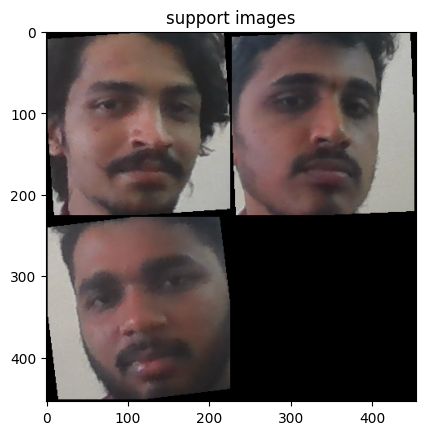

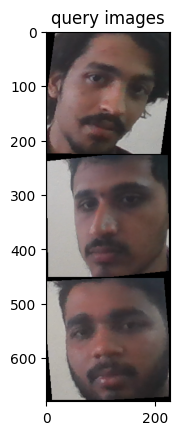

In [ ]:
import matplotlib.pyplot as plt
import torchvision
def plot_images(images: Tensor, title: str, images_per_row: int):

    plt.figure()
    plt.title(title)
    plt.imshow(
        torchvision.utils.make_grid(images, nrow=images_per_row).permute(1, 2, 0)
    )

(
    example_support_images,
    example_support_labels,
    example_query_images,
    example_query_labels,
    example_class_ids,
) = next(iter(val_loader))

#print(example_support_images.cpu().numpy())
plot_images(example_support_images.cpu(), "support images", images_per_row=2)
plot_images(example_query_images.cpu(), "query images", images_per_row=1)

In [ ]:
(
    example_support_images,
    example_support_labels,
    example_query_images,
    example_query_labels,
    example_class_ids,
) = next(iter(test_loader))


model.eval()
example_scores = model(
    example_support_images,
    example_support_labels,
    example_query_images,


)
print(example_scores.data)
#print(example_scores)
_, example_predicted_labels = torch.max(example_scores, 1)

correct=0

print("Ground Truth / Predicted")
for i in range(len(example_query_labels)):
    print(f"{example_query_labels[i]} / {example_predicted_labels[i]}")
    if example_query_labels[i] == example_predicted_labels[i]:
      correct+=1
accuracy=correct / len(example_query_labels)
print(f"accuracy = {accuracy}")

tensor([[73.8358, 53.5382, 97.3730],
        [38.0327, 79.4229, 31.7003],
        [99.1227, 77.8768, 77.2273]], device='cuda:0')
Ground Truth / Predicted
2 / 2
1 / 1
0 / 0
accuracy = 1.0


# HOG + nn.maxpool2d + NN

In [ ]:
import os
import cv2
import numpy as np
import torch
import torchvision.transforms as transforms
from torch.utils.data import Dataset, DataLoader
from PIL import Image
import hashlib
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from skimage import color

transform = transforms.Compose([
    transforms.ToTensor(),  # Convert to tensor
])

def augment_and_save_images(image_path, class_name):
    images = []
    labels = []
    transformations = [
        transforms.RandomVerticalFlip(p=0.5),
        transforms.RandomAffine(degrees=10, shear=10),
        #transforms.RandomCrop(size=224, padding=20),
        transforms.RandomPerspective(distortion_scale=0.2, p=0.5),
        transforms.RandomRotation(degrees=10),
    ]
    generated_images = set()

    original_image = Image.open(image_path)
    original_image = original_image.resize((244,224))
    original_image_array = np.array(original_image)

    images.append(original_image_array)
    labels.append(class_name)

    for transform_fn in transformations:
        augmented_image = transform_fn(original_image)
        augmented_image_array = np.array(augmented_image)
        image_hash = hashlib.sha256(augmented_image_array.tobytes()).hexdigest()
        if image_hash not in generated_images:
            generated_images.add(image_hash)
            images.append(augmented_image_array)
            labels.append(class_name)
    #print(images)
    return images, labels

class CustomDataset(Dataset):
    def __init__(self, folder_path, transform,split,device):
        self.folder_path = folder_path
        self.transform = transform
        self.le=LabelEncoder()
        self.device=device
        self.images = []
        self.labels = []

        self.split=split

        self.load_data()

    def load_data(self):
        class_names = ['Cyst','Normal','Stone','Tumor']
        for class_name in class_names:
            class_path = os.path.join(self.folder_path, class_name)
            for image_name in os.listdir(class_path):
                if not image_name.startswith('_DS_Store'):
                    image_path = os.path.join(class_path, image_name)

                    augmented_images, label = augment_and_save_images(image_path, class_name)

                    self.images.extend(augmented_images)
                    self.labels.extend(label)

        self.images=np.array(self.images)
        self.labels=np.array(self.labels)


        self.labels=self.le.fit_transform(self.labels)

        x_train,x_mid,y_train,y_mid=train_test_split(self.images,self.labels,test_size=0.2)
        x_val,x_test,y_val,y_test=train_test_split(x_mid,y_mid,test_size=0.5)
        #print(len(y_train));print(len(x_val))
        if self.split=='train':
          self.images=x_train
          self.labels=y_train
          print("Train")

        if self.split=='val':
          self.images=x_val
          self.labels=y_val
          print("Val")

        if self.split=='test':
          self.images=x_test
          self.labels=y_test
          print("Test")

        return self.images,self.labels

    def __getitem__(self, index):
      image = self.images[index]
      label = self.labels[index]

      if self.transform:
        image=self.transform(image)
      #label=torch.tensor(label)
      #print(label)
      image=image.to(self.device)
      label=torch.tensor(label,device=self.device)

      return image,label

    def __len__(self):
        return len(self.images)


if torch.cuda.is_available():
  device=torch.device('cuda:0')
else:
  device=torch.device('cpu')
path = "/content/drive/MyDrive/Medical_cv/CT-KIDNEY-DATASET-Normal-Cyst-Tumor-Stone(just 10 image each)"

val_data = CustomDataset(path, transform,split='val',device=device)
train_data = CustomDataset(path,transform,split='train',device=device)
test_data = CustomDataset(path,transform,split='test', device=device)

val_loader = DataLoader(val_data)
train_loader = DataLoader(train_data,batch_size=2,shuffle=True)
test_loader = DataLoader(test_data)



Val
Train
Test


In [ ]:
import torch
import numpy as np
from skimage import color
from skimage.feature import hog
from skimage.filters import sobel
import plotly.express as ex

class HOG():

    def hog_calculation(self, image, pixels_per_cell=(2, 2), cells_per_block=(4, 4), block_norm='L2-Hys',  show_image=False, gray_conversion = False):
        self.gray_conversion = gray_conversion
        self.show_image = show_image
        self.pixels_per_cell= pixels_per_cell
        self.cells_per_block=cells_per_block
        self.block_norm=block_norm
        batch = []
        for i in range(len(image)):  # Iterate over the batch dimension
            if self.gray_conversion ==True:
                print(image.shape);print(image[i].shape)
                im = image[i].cpu().numpy().transpose(1, 2, 0)  # Convert to NumPy array
                print(im.shape)

                im = color.rgb2gray(im)

                gradient_magnitude = sobel(im)
                gradient_direction = np.arctan2(sobel(im, axis=0), sobel(im, axis=1))
                fd, hog_image = hog(gradient_magnitude, pixels_per_cell = self.pixels_per_cell, cells_per_block=self.cells_per_block, block_norm=self.block_norm, visualize=True)
                print(hog_image.shape)
                hog_image = hog_image.reshape(1, *hog_image.shape)
                if self.show_image:
                    fig = ex.imshow(hog_image.squeeze(), color_continuous_scale='gray')
                    fig.show()
                batch.append(hog_image)

            else:
                im = image[i].cpu().squeeze().numpy()
                print(im.shape)
                gradient_magnitude = sobel(im)
                gradient_direction = np.arctan2(sobel(im, axis=0), sobel(im, axis=1))
                fd, hog_image = hog(gradient_magnitude, pixels_per_cell = self.pixels_per_cell, cells_per_block=self.cells_per_block, block_norm=self.block_norm, visualize=True)
                #print(hog_image.shape)
                hog_image = hog_image.reshape(1, *hog_image.shape)
                if self.show_image:
                    fig = ex.imshow(hog_image.squeeze(), color_continuous_scale='gray')
                    fig.show()
                batch.append(hog_image)

        return torch.tensor(batch)
    def shape(self,x):
      return x.shape

# Example usage
for i, (x, y) in enumerate(train_loader):
    if i == 0:
        image = x
        label = y

n = HOG()
image=n.hog_calculation(image, gray_conversion = True)




torch.Size([2, 3, 224, 244])
torch.Size([3, 224, 244])
(224, 244, 3)
(224, 244)
torch.Size([2, 3, 224, 244])
torch.Size([3, 224, 244])
(224, 244, 3)
(224, 244)


In [ ]:
image.shape


torch.Size([2, 1, 224, 244])

In [ ]:

import torch.nn as nn
pool=nn.MaxPool2d(2,stride=2)
image_p=pool(image);print(image_p.shape)
#image_p=image_p[0].squeeze(0)

ex.imshow(image_p[0].squeeze(0),color_continuous_scale='gray')



torch.Size([2, 1, 112, 122])


In [ ]:
image_p.shape

torch.Size([2, 1, 112, 122])

In [ ]:
image=n.hog_calculation(image_p)

(112, 122)
(112, 122)


In [ ]:
print(image.shape)

torch.Size([2, 1, 112, 122])


In [ ]:
ex.imshow(image[0].squeeze(0),color_continuous_scale='gray')

In [ ]:
 # Represent the image's pixel values in DataFrame
import cv2
import pandas as pd
import numpy as np


image=cv2.imread("/content/drive/MyDrive/Medical_cv/CT-KIDNEY-DATASET-Normal-Cyst-Tumor-Stone(just 10 image each)/Cyst/Cyst- (4).jpg",cv2.IMREAD_GRAYSCALE)
#image=cv2.imread("/content/drive/MyDrive/Medical_cv/CT-KIDNEY-DATASET-Normal-Cyst-Tumor-Stone(just 10 image each)/Cyst/Cyst- (4).jpg")
#image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB) # For color Image


image_array=np.array(image)

row=[]
column=[]
pixel=[]
for i in range(image.shape[0]):
  for j in range(image.shape[1]):
    pixel.append((image_array[i][j]).tolist())
    column.append(j)
    row.append(i)
#dict_={'row':row,'column':column,'pixel':pixel}



df=pd.DataFrame({'Length':row,'width':column,'pixel':pixel})

pixel_df=df.pivot_table(index='Length',values='pixel',columns='width',aggfunc='first')


pixel_df

width,0,1,2,3,4,5,6,7,8,9,...,502,503,504,505,506,507,508,509,510,511
Length,,,,,,,,,,,,,,,,,,,,,
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
507,0,0,0,0,123,165,172,165,59,0,...,0,0,0,0,0,1,0,0,0,0
508,0,0,0,0,10,122,160,168,157,65,...,0,0,0,0,0,0,0,0,0,0
509,0,0,0,0,0,22,93,109,167,177,...,0,0,0,0,0,0,0,0,0,0


# Program Starts here

[0 0 0]


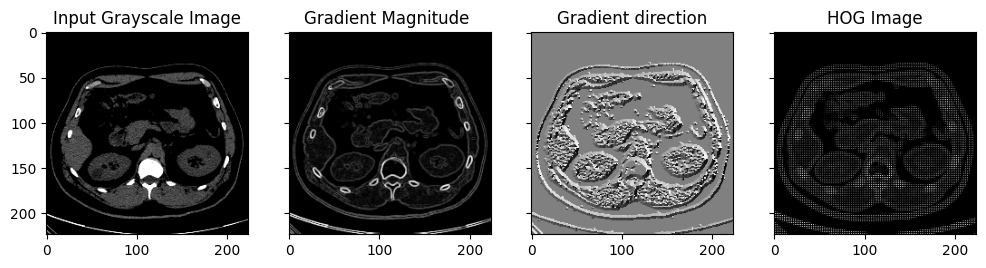

In [ ]:

image_path = "/content/drive/MyDrive/Medical_cv/CT-KIDNEY-DATASET-Normal-Cyst-Tumor-Stone(just 10 image each)/Cyst/Cyst- (4).jpg"

from skimage.filters import sobel
from skimage import color, io, exposure
import numpy as np
from skimage.feature import hog
import cv2
import matplotlib.pyplot as plt


image_cv2_bgr = cv2.imread(image_path);print(image_cv2_bgr[223][223])
image = io.imread(image_path)
image = cv2.resize(image, (224,224))
gray_image = color.rgb2gray(image)

#gray_img = cv2.resize(gray_image, (128, 64))
gray_img=gray_image.copy()

gradient_magnitude=sobel(gray_image)
gradient_direction=np.arctan2(sobel(gray_image,axis=0),sobel(gray_image,axis=1))
fd, hog_image = hog(gradient_magnitude, pixels_per_cell=(2,2), cells_per_block=(2, 2), block_norm='L2-Hys', visualize=True)
# we can vary the pixels_per_cell

#fd, hog_image = hog(gray_img, orientations=9, pixels_per_cell=(8,8), cells_per_block=(2, 2), block_norm='L2-Hys', visualize=True)
#print(fd)  # feature vector
fig, (ax1, ax2, ax3,ax4) = plt.subplots(1, 4, figsize=(12, 6), sharex=True, sharey=True)

ax1.imshow(gray_img, cmap=plt.cm.gray)
ax1.set_title('Input Grayscale Image')


hog_image_rescaled = exposure.rescale_intensity(hog_image, in_range=(0, 10))
gamma_corrected = exposure.adjust_gamma(hog_image_rescaled, gamma=0.4)


ax2.imshow(gradient_magnitude,cmap=plt.cm.gray)
ax2.set_title('Gradient Magnitude ')

ax3.imshow(gradient_direction,cmap=plt.cm.gray)
ax3.set_title('Gradient direction')

ax4.imshow(gamma_corrected, cmap=plt.cm.gray)
ax4.set_title('HOG Image')


plt.show()


In [ ]:
import os
import cv2
import numpy as np
import torch
import torchvision.transforms as transforms
from torch.utils.data import Dataset, DataLoader
from PIL import Image
import hashlib
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from skimage import color

transform = transforms.Compose([
    transforms.ToTensor(),  # Convert to tensor
])

def augment_and_save_images(image_path, class_name):
    images = []
    labels = []
    transformations = [
        transforms.RandomVerticalFlip(p=0.5),
        transforms.RandomAffine(degrees=10, shear=10),
        #transforms.RandomCrop(size=224, padding=20),
        transforms.RandomPerspective(distortion_scale=0.2, p=0.5),
        transforms.RandomRotation(degrees=10),
    ]
    generated_images = set()

    original_image = Image.open(image_path)
    original_image = original_image.resize((244,224))
    original_image_array = np.array(original_image)

    images.append(original_image_array)
    labels.append(class_name)

    for transform_fn in transformations:
        augmented_image = transform_fn(original_image)
        augmented_image_array = np.array(augmented_image)
        image_hash = hashlib.sha256(augmented_image_array.tobytes()).hexdigest()
        if image_hash not in generated_images:
            generated_images.add(image_hash)
            images.append(augmented_image_array)
            labels.append(class_name)
    #print(images)
    return images, labels

class CustomDataset(Dataset):
    def __init__(self, folder_path, transform,split,device):
        self.folder_path = folder_path
        self.transform = transform
        self.le=LabelEncoder()
        self.device=device
        self.images = []
        self.labels = []

        self.split=split

        self.load_data()

    def load_data(self):
        class_names = ['Cyst','Normal','Stone','Tumor']
        for class_name in class_names:
            class_path = os.path.join(self.folder_path, class_name)
            for image_name in os.listdir(class_path):
                if not image_name.startswith('_DS_Store'):
                    image_path = os.path.join(class_path, image_name)

                    augmented_images, label = augment_and_save_images(image_path, class_name)

                    self.images.extend(augmented_images)
                    self.labels.extend(label)

        self.images=np.array(self.images)
        self.labels=np.array(self.labels)


        self.labels=self.le.fit_transform(self.labels)

        x_train,x_mid,y_train,y_mid=train_test_split(self.images,self.labels,test_size=0.2)
        x_val,x_test,y_val,y_test=train_test_split(x_mid,y_mid,test_size=0.5)
        #print(len(y_train));print(len(x_val))
        if self.split=='train':
          self.images=x_train
          self.labels=y_train
          print("Train")

        if self.split=='val':
          self.images=x_val
          self.labels=y_val
          print("Val")

        if self.split=='test':
          self.images=x_test
          self.labels=y_test
          print("Test")

        return self.images,self.labels

    def __getitem__(self, index):
      image = self.images[index]
      label = self.labels[index]

      if self.transform:
        image=self.transform(image)
      #label=torch.tensor(label)
      #print(label)
      image=image.to(self.device)
      label=torch.tensor(label,device=self.device)

      return image,label

    def __len__(self):
        return len(self.images)


if torch.cuda.is_available():
  device=torch.device('cuda:0')
else:
  device=torch.device('cpu')
path = "/content/drive/MyDrive/Medical_cv/CT-KIDNEY-DATASET-Normal-Cyst-Tumor-Stone(just 10 image each)"

val_data = CustomDataset(path, transform,split='val',device=device)
train_data = CustomDataset(path,transform,split='train',device=device)
test_data = CustomDataset(path,transform,split='test', device=device)

val_loader = DataLoader(val_data)
train_loader = DataLoader(train_data,batch_size=2,shuffle=True)
test_loader = DataLoader(test_data)



Val
Train
Test


In [ ]:
import torch
import numpy as np
from skimage import color
from skimage.feature import hog
from skimage.filters import sobel
import plotly.express as ex

class HOG():

    def hog_calculation(self, image, pixels_per_cell=(2, 2), cells_per_block=(4, 4), block_norm='L2-Hys',  show_image=False, gray_conversion = False):
        self.gray_conversion = gray_conversion
        self.show_image = show_image
        self.pixels_per_cell= pixels_per_cell
        self.cells_per_block=cells_per_block
        self.block_norm=block_norm
        batch = []
        for i in range(len(image)):  # Iterate over the batch dimension
            if self.gray_conversion ==True:
                #print(image.shape);print(image[i].shape)
                im = image[i].cpu().numpy().transpose(1, 2, 0)  # Convert to NumPy array
                #print(im.shape)

                im = color.rgb2gray(im)

                gradient_magnitude = sobel(im)
                gradient_direction = np.arctan2(sobel(im, axis=0), sobel(im, axis=1))
                fd, hog_image = hog(gradient_magnitude, pixels_per_cell = self.pixels_per_cell, cells_per_block=self.cells_per_block, block_norm=self.block_norm, visualize=True)
                #print(hog_image.shape)
                hog_image = hog_image.reshape(1, *hog_image.shape)
                if self.show_image:
                    fig = ex.imshow(hog_image.squeeze(), color_continuous_scale='gray')
                    fig.show()
                batch.append(hog_image)

            else:
                im = image[i].cpu().squeeze().numpy()
                #print(im.shape)
                gradient_magnitude = sobel(im)
                gradient_direction = np.arctan2(sobel(im, axis=0), sobel(im, axis=1))
                fd, hog_image = hog(gradient_magnitude, pixels_per_cell = self.pixels_per_cell, cells_per_block=self.cells_per_block, block_norm=self.block_norm, visualize=True)
                #print(hog_image.shape)
                hog_image = hog_image.reshape(1, *hog_image.shape)
                if self.show_image:
                    fig = ex.imshow(hog_image.squeeze(), color_continuous_scale='gray')
                    fig.show()
                batch.append(hog_image)

        return torch.tensor(batch)
    def shape(self,x):
      return x.shape




In [ ]:
import torch.nn as nn
from skimage.feature import hog

class hognn(nn.Module):
  def __init__(self,num_clases):
    super(hognn,self).__init__()
    self.h = HOG()
    self.linear1 = nn.Linear(in_features = 3416, out_features = 100)
    self.linear2 = nn.Linear(in_features = 100, out_features = 4)
    self.maxpool = nn.MaxPool2d(2,stride=2)

  def forward(self,x):
    device = x.device
    x = self.h.hog_calculation( x,gray_conversion = True)
    x = self.maxpool(x)
    x = self.h.hog_calculation(x)
    x=self.maxpool(x)

    x = torch.tensor(x,device = device)

    x=x.view(x.size(0),-1)
    x=self.linear1(x)
    x=torch.relu(x)
    x=self.linear2(x)
    #x = torch.tensor(x,device = device)
    return x

'''
for i, (x, y) in enumerate(train_loader):
    if i == 0:
        image = x
        label = y
#model=hognn(4)
out=model(image)

#ex.imshow(out[0].squeeze(0),color_continuous_scale='gray')
'''
print()


In [ ]:
import torch.nn as nn
import torch.optim as optim
def training(epochs, train_loader, val_loader):
  model = hognn(4).to(device)
  criterion = nn.CrossEntropyLoss().to(device)
  optimizer = optim.Adam(model.parameters(),lr= 0.01)
  report={
      'training_loss' : [],
      'accuracy' : []
  }
  for epoch in  range(epochs):
    loss_value=0.0
    for x,y in train_loader:
      model.train()
      optimizer.zero_grad()

      yhat = model(x)

      loss = criterion(yhat,y)
      loss_value += loss.item()
      loss.backward()
      optimizer.step()
    report['training_loss'].append(loss_value / len(train_loader))

    for x, y in val_loader:
      predicted = []
      actual = []
      model.eval()
      yhat=model(x)
      _,predicted_label = torch.max(yhat, 1)
      print(f"Actual output : {y.item()}  Predicted output : {predicted_label}")
      predicted.append(predicted_label)
      actual.append(y.item())

    correct = 0
    for i in range(len(predicted)):
      if predicted[i] == actual[i]:
        correct +=1
    print(f" Epoch {epoch+1} / {epochs} Training Loss : {loss_value / len(train_loader)} Validation Accuracy : {(correct / len(predicted)) * 100}")
    report['accuracy'].append((correct / len(predicted)) * 100)
  return model , report


if torch.cuda.is_available():
  device = torch.device('cuda')
else:
  device = torch.device('cpu')

model, report = training(2,train_loader, val_loader)

<ipython-input-14-148617780fa1>:19: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x = torch.tensor(x,device = device)


Actual output : 2  Predicted output : tensor([2], device='cuda:0')
Actual output : 2  Predicted output : tensor([2], device='cuda:0')
Actual output : 3  Predicted output : tensor([3], device='cuda:0')
Actual output : 2  Predicted output : tensor([2], device='cuda:0')
Actual output : 3  Predicted output : tensor([3], device='cuda:0')
Actual output : 1  Predicted output : tensor([1], device='cuda:0')
Actual output : 3  Predicted output : tensor([3], device='cuda:0')
Actual output : 1  Predicted output : tensor([1], device='cuda:0')
Actual output : 0  Predicted output : tensor([0], device='cuda:0')
Actual output : 0  Predicted output : tensor([0], device='cuda:0')
Actual output : 3  Predicted output : tensor([3], device='cuda:0')
Actual output : 0  Predicted output : tensor([0], device='cuda:0')
Actual output : 0  Predicted output : tensor([0], device='cuda:0')
Actual output : 3  Predicted output : tensor([3], device='cuda:0')
Actual output : 2  Predicted output : tensor([3], device='cuda

# Object Localization for MNIST dataset

[ref](https://github.com/y33-j3T/Coursera-Deep-Learning/blob/master/Advanced%20Computer%20Vision%20with%20TensorFlow/Week%201%20-%20Introduction%20to%20Computer%20Vision/Copy%20of%20C3_W1_Lab_3_Object_Localization.ipynb)

In [ ]:
import os, re, time, json
import PIL.Image, PIL.ImageFont, PIL.ImageDraw
import numpy as np
try:
  # %tensorflow_version only exists in Colab.
  %tensorflow_version 2.x
except Exception:
  pass
import tensorflow as tf
from matplotlib import pyplot as plt
import tensorflow_datasets as tfds

print("Tensorflow version " + tf.__version__)

Colab only includes TensorFlow 2.x; %tensorflow_version has no effect.
Tensorflow version 2.15.0


In [ ]:
#@title Plot Utilities for Bounding Boxes [RUN ME]

im_width = 75
im_height = 75
use_normalized_coordinates = True

def draw_bounding_boxes_on_image_array(image,
                                       boxes,
                                       color=[],
                                       thickness=1,
                                       display_str_list=()):
  """Draws bounding boxes on image (numpy array).
  Args:
    image: a numpy array object.
    boxes: a 2 dimensional numpy array of [N, 4]: (ymin, xmin, ymax, xmax).
           The coordinates are in normalized format between [0, 1].
    color: color to draw bounding box. Default is red.
    thickness: line thickness. Default value is 4.
    display_str_list_list: a list of strings for each bounding box.
  Raises:
    ValueError: if boxes is not a [N, 4] array
  """
  image_pil = PIL.Image.fromarray(image)
  rgbimg = PIL.Image.new("RGBA", image_pil.size)
  rgbimg.paste(image_pil)
  draw_bounding_boxes_on_image(rgbimg, boxes, color, thickness,
                               display_str_list)
  return np.array(rgbimg)


def draw_bounding_boxes_on_image(image,
                                 boxes,
                                 color=[],
                                 thickness=1,
                                 display_str_list=()):
  """Draws bounding boxes on image.
  Args:
    image: a PIL.Image object.
    boxes: a 2 dimensional numpy array of [N, 4]: (ymin, xmin, ymax, xmax).
           The coordinates are in normalized format between [0, 1].
    color: color to draw bounding box. Default is red.
    thickness: line thickness. Default value is 4.
    display_str_list: a list of strings for each bounding box.

  Raises:
    ValueError: if boxes is not a [N, 4] array
  """
  boxes_shape = boxes.shape
  if not boxes_shape:
    return
  if len(boxes_shape) != 2 or boxes_shape[1] != 4:
    raise ValueError('Input must be of size [N, 4]')
  for i in range(boxes_shape[0]):
    draw_bounding_box_on_image(image, boxes[i, 1], boxes[i, 0], boxes[i, 3],
                               boxes[i, 2], color[i], thickness, display_str_list[i])

def draw_bounding_box_on_image(image,
                               ymin,
                               xmin,
                               ymax,
                               xmax,
                               color='red',
                               thickness=1,
                               display_str=None,
                               use_normalized_coordinates=True):
  """Adds a bounding box to an image.
  Bounding box coordinates can be specified in either absolute (pixel) or
  normalized coordinates by setting the use_normalized_coordinates argument.
  Args:
    image: a PIL.Image object.
    ymin: ymin of bounding box.
    xmin: xmin of bounding box.
    ymax: ymax of bounding box.
    xmax: xmax of bounding box.
    color: color to draw bounding box. Default is red.
    thickness: line thickness. Default value is 4.
    display_str_list: string to display in box
    use_normalized_coordinates: If True (default), treat coordinates
      ymin, xmin, ymax, xmax as relative to the image.  Otherwise treat
      coordinates as absolute.
  """
  draw = PIL.ImageDraw.Draw(image)
  im_width, im_height = image.size
  if use_normalized_coordinates:
    (left, right, top, bottom) = (xmin * im_width, xmax * im_width,
                                  ymin * im_height, ymax * im_height)
  else:
    (left, right, top, bottom) = (xmin, xmax, ymin, ymax)
  draw.line([(left, top), (left, bottom), (right, bottom),
             (right, top), (left, top)], width=thickness, fill=color)



In [ ]:
#@title Visualization Utilities [RUN ME]
"""
This cell contains helper functions used for visualization
and downloads only.

You can skip reading it, as there is very
little Keras or Tensorflow related code here.
"""

# Matplotlib config
plt.rc('image', cmap='gray')
plt.rc('grid', linewidth=0)
plt.rc('xtick', top=False, bottom=False, labelsize='large')
plt.rc('ytick', left=False, right=False, labelsize='large')
plt.rc('axes', facecolor='F8F8F8', titlesize="large", edgecolor='white')
plt.rc('text', color='a8151a')
plt.rc('figure', facecolor='F0F0F0')# Matplotlib fonts
MATPLOTLIB_FONT_DIR = os.path.join(os.path.dirname(plt.__file__), "mpl-data/fonts/ttf")

# pull a batch from the datasets. This code is not very nice, it gets much better in eager mode (TODO)
def dataset_to_numpy_util(training_dataset, validation_dataset, N):

  # get one batch from each: 10000 validation digits, N training digits
  batch_train_ds = training_dataset.unbatch().batch(N)

  # eager execution: loop through datasets normally
  if tf.executing_eagerly():
    for validation_digits, (validation_labels, validation_bboxes) in validation_dataset:
      validation_digits = validation_digits.numpy()
      validation_labels = validation_labels.numpy()
      validation_bboxes = validation_bboxes.numpy()
      break
    for training_digits, (training_labels, training_bboxes) in batch_train_ds:
      training_digits = training_digits.numpy()
      training_labels = training_labels.numpy()
      training_bboxes = training_bboxes.numpy()
      break

  # these were one-hot encoded in the dataset
  validation_labels = np.argmax(validation_labels, axis=1)
  training_labels = np.argmax(training_labels, axis=1)

  return (training_digits, training_labels, training_bboxes,
          validation_digits, validation_labels, validation_bboxes)

# create digits from local fonts for testing
def create_digits_from_local_fonts(n):
  font_labels = []
  img = PIL.Image.new('LA', (75*n, 75), color = (0,255)) # format 'LA': black in channel 0, alpha in channel 1
  font1 = PIL.ImageFont.truetype(os.path.join(MATPLOTLIB_FONT_DIR, 'DejaVuSansMono-Oblique.ttf'), 25)
  font2 = PIL.ImageFont.truetype(os.path.join(MATPLOTLIB_FONT_DIR, 'STIXGeneral.ttf'), 25)
  d = PIL.ImageDraw.Draw(img)
  for i in range(n):
    font_labels.append(i%10)
    d.text((7+i*75,0 if i<10 else -4), str(i%10), fill=(255,255), font=font1 if i<10 else font2)
  font_digits = np.array(img.getdata(), np.float32)[:,0] / 255.0 # black in channel 0, alpha in channel 1 (discarded)
  font_digits = np.reshape(np.stack(np.split(np.reshape(font_digits, [75, 75*n]), n, axis=1), axis=0), [n, 75*75])
  return font_digits, font_labels


# utility to display a row of digits with their predictions
def display_digits_with_boxes(digits, predictions, labels, pred_bboxes, bboxes, iou, title):

  n = 10

  indexes = np.random.choice(len(predictions), size=n)
  n_digits = digits[indexes]
  n_predictions = predictions[indexes]
  n_labels = labels[indexes]

  n_iou = []
  if len(iou) > 0:
    n_iou = iou[indexes]

  if (len(pred_bboxes) > 0):
    n_pred_bboxes = pred_bboxes[indexes,:]

  if (len(bboxes) > 0):
    n_bboxes = bboxes[indexes,:]


  n_digits = n_digits * 255.0
  n_digits = n_digits.reshape(n, 75, 75)
  fig = plt.figure(figsize=(20, 4))
  plt.title(title)
  plt.yticks([])
  plt.xticks([])

  for i in range(10):
    ax = fig.add_subplot(1, 10, i+1)
    bboxes_to_plot = []
    if (len(pred_bboxes) > i):
      bboxes_to_plot.append(n_pred_bboxes[i])

    if (len(bboxes) > i):
      bboxes_to_plot.append(n_bboxes[i])

    img_to_draw = draw_bounding_boxes_on_image_array(image=n_digits[i], boxes=np.asarray(bboxes_to_plot), color=['red', 'green'], display_str_list=["true", "pred"])
    plt.xlabel(n_predictions[i])
    plt.xticks([])
    plt.yticks([])

    if n_predictions[i] != n_labels[i]:
      ax.xaxis.label.set_color('red')



    plt.imshow(img_to_draw)

    if len(iou) > i :
      color = "black"
      if (n_iou[i][0] < iou_threshold):
        color = "red"
      ax.text(0.2, -0.3, "iou: %s" %(n_iou[i][0]), color=color, transform=ax.transAxes)


# utility to display training and validation curves
def plot_metrics(metric_name, title, ylim=5):
  plt.title(title)
  plt.ylim(0,ylim)
  plt.plot(history.history[metric_name],color='blue',label=metric_name)
  plt.plot(history.history['val_' + metric_name],color='green',label='val_' + metric_name)

In [ ]:
gpus = tf.config.experimental.list_logical_devices("GPU")
print(len(gpus))

1


In [ ]:
# Detect hardware
try:
  tpu = tf.distribute.cluster_resolver.TPUClusterResolver() # TPU detection
except ValueError:
  tpu = None
  gpus = tf.config.experimental.list_logical_devices("GPU")

# Select appropriate distribution strategy
if tpu:
  tf.config.experimental_connect_to_cluster(tpu)
  tf.tpu.experimental.initialize_tpu_system(tpu)
  strategy = tf.distribute.experimental.TPUStrategy(tpu) # Going back and forth between TPU and host is expensive. Better to run 128 batches on the TPU before reporting back.
  print('Running on TPU ', tpu.cluster_spec().as_dict()['worker'])
elif len(gpus) > 1:
  strategy = tf.distribute.MirroredStrategy([gpu.name for gpu in gpus])
  print('Running on multiple GPUs ', [gpu.name for gpu in gpus])
elif len(gpus) == 1:
  strategy = tf.distribute.get_strategy() # default strategy that works on CPU and single GPU
  print('Running on single GPU ', gpus[0].name)
else:
  strategy = tf.distribute.get_strategy() # default strategy that works on CPU and single GPU
  print('Running on CPU')
print("Number of accelerators: ", strategy.num_replicas_in_sync)

Running on single GPU  /device:GPU:0
Number of accelerators:  1


In [ ]:
BATCH_SIZE = 64 * strategy.num_replicas_in_sync # Gobal batch size.
# The global batch size will be automatically sharded across all
# replicas by the tf.data.Dataset API. A single TPU has 8 cores.
# The best practice is to scale the batch size by the number of
# replicas (cores). The learning rate should be increased as well.


In [ ]:

'''
Transforms each image in dataset by pasting it on a 75x75 canvas at random locations.
'''
def read_image_tfds(image, label):
    xmin = tf.random.uniform((), 0 , 48, dtype=tf.int32)
    ymin = tf.random.uniform((), 0 , 48, dtype=tf.int32)
    image = tf.reshape(image, (28,28,1,))
    image = tf.image.pad_to_bounding_box(image, ymin, xmin, 75, 75)
    image = tf.cast(image, tf.float32)/255.0
    xmin = tf.cast(xmin, tf.float32)
    ymin = tf.cast(ymin, tf.float32)

    xmax = (xmin + 28) / 75
    ymax = (ymin + 28) / 75
    xmin = xmin / 75
    ymin = ymin / 75
    return image, (tf.one_hot(label, 10), [xmin, ymin, xmax, ymax])

'''
Loads and maps the training split of the dataset using the map function. Note that we try to load the gcs version since TPU can only work with datasets on Google Cloud Storage.
'''
def get_training_dataset():

      with  strategy.scope():
        dataset = tfds.load("mnist", split="train", as_supervised=True, try_gcs=True)
        dataset = dataset.map(read_image_tfds, num_parallel_calls=16)
        dataset = dataset.shuffle(5000, reshuffle_each_iteration=True)
        dataset = dataset.repeat() # Mandatory for Keras for now
        dataset = dataset.batch(BATCH_SIZE, drop_remainder=True) # drop_remainder is important on TPU, batch size must be fixed
        dataset = dataset.prefetch(-1)  # fetch next batches while training on the current one (-1: autotune prefetch buffer size)
      return dataset

'''
Loads and maps the validation split of the dataset using the map function. Note that we try to load the gcs version since TPU can only work with datasets on Google Cloud Storage.
'''
def get_validation_dataset():
    dataset = tfds.load("mnist", split="test", as_supervised=True, try_gcs=True)
    dataset = dataset.map(read_image_tfds, num_parallel_calls=16)

    #dataset = dataset.cache() # this small dataset can be entirely cached in RAM
    dataset = dataset.batch(10000, drop_remainder=True) # 10000 items in eval dataset, all in one batch
    dataset = dataset.repeat() # Mandatory for Keras for now
    return dataset

# instantiate the datasets
with strategy.scope():
  training_dataset = get_training_dataset()
  validation_dataset = get_validation_dataset()

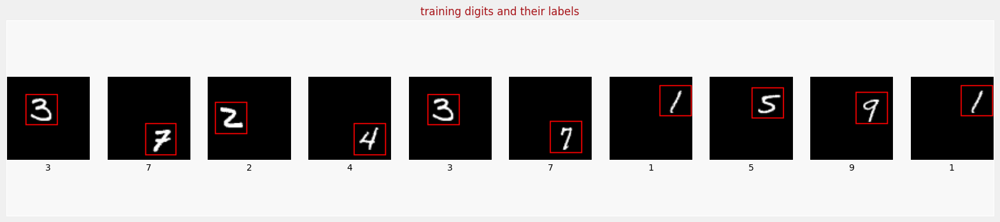

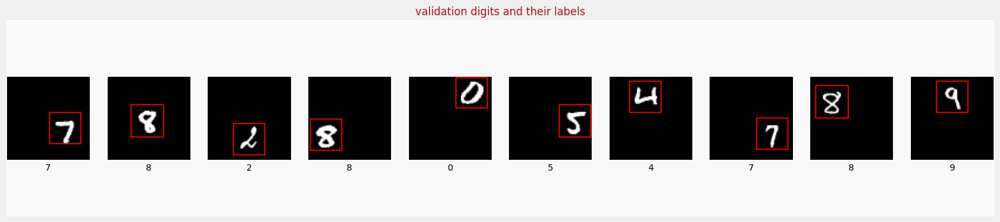

In [ ]:
(training_digits, training_labels, training_bboxes,
 validation_digits, validation_labels, validation_bboxes) = dataset_to_numpy_util(training_dataset, validation_dataset, 10)

display_digits_with_boxes(training_digits, training_labels, training_labels, np.array([]), training_bboxes, np.array([]), "training digits and their labels")
display_digits_with_boxes(validation_digits, validation_labels, validation_labels, np.array([]), validation_bboxes, np.array([]), "validation digits and their labels")


In [ ]:
'''
Feature extractor is the CNN that is made up of convolution and pooling layers.
'''
def feature_extractor(inputs):
    x = tf.keras.layers.Conv2D(16, activation='relu', kernel_size=3, input_shape=(75, 75, 1))(inputs)
    x = tf.keras.layers.AveragePooling2D((2, 2))(x)

    x = tf.keras.layers.Conv2D(32,kernel_size=3,activation='relu')(x)
    x = tf.keras.layers.AveragePooling2D((2, 2))(x)

    x = tf.keras.layers.Conv2D(64,kernel_size=3,activation='relu')(x)
    x = tf.keras.layers.AveragePooling2D((2, 2))(x)

    return x

'''
dense_layers adds a flatten and dense layer.
This will follow the feature extraction layers
'''
def dense_layers(inputs):
  x = tf.keras.layers.Flatten()(inputs)
  x = tf.keras.layers.Dense(128, activation='relu')(x)
  return x


'''
Classifier defines the classification output.
This has a set of fully connected layers and a softmax layer.
'''
def classifier(inputs):

  classification_output = tf.keras.layers.Dense(10, activation='softmax', name = 'classification')(inputs)
  return classification_output


'''
This function defines the regression output for bounding box prediction.
Note that we have four outputs corresponding to (xmin, ymin, xmax, ymax)
'''
def bounding_box_regression(inputs):
    bounding_box_regression_output = tf.keras.layers.Dense(units = '4', name = 'bounding_box')(inputs)
    return bounding_box_regression_output


def final_model(inputs):
    feature_cnn = feature_extractor(inputs)
    dense_output = dense_layers(feature_cnn)

    '''
    The model branches here.
    The dense layer's output gets fed into two branches:
    classification_output and bounding_box_output
    '''
    classification_output = classifier(dense_output)
    bounding_box_output = bounding_box_regression(dense_output)

    model = tf.keras.Model(inputs = inputs, outputs = [classification_output, bounding_box_output])

    return model


def define_and_compile_model(inputs):
  model = final_model(inputs)

  model.compile(optimizer='adam',
              loss = {'classification' : 'categorical_crossentropy',
                      'bounding_box' : 'mse'
                     },
              metrics = {'classification' : 'accuracy',
                         'bounding_box' : 'mse'
                        })
  return model


with strategy.scope():
  inputs = tf.keras.layers.Input(shape=(75, 75, 1,))
  model = define_and_compile_model(inputs)

# print model layers
model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 75, 75, 1)]          0         []                            
                                                                                                  
 conv2d (Conv2D)             (None, 73, 73, 16)           160       ['input_1[0][0]']             
                                                                                                  
 average_pooling2d (Average  (None, 36, 36, 16)           0         ['conv2d[0][0]']              
 Pooling2D)                                                                                       
                                                                                                  
 conv2d_1 (Conv2D)           (None, 34, 34, 32)           4640      ['average_pooling2d[0][0]'

In [ ]:
EPOCHS = 10 # 45
steps_per_epoch = 60000//BATCH_SIZE  # 60,000 items in this dataset
validation_steps = 1

history = model.fit(training_dataset,
                    steps_per_epoch=steps_per_epoch, validation_data=validation_dataset, validation_steps=validation_steps, epochs=EPOCHS)

loss, classification_loss, bounding_box_loss, classification_accuracy, bounding_box_mse = model.evaluate(validation_dataset, steps=1)
print("Validation accuracy: ", classification_accuracy)

Epoch 1/10
937/937 [==============================] - 50s 37ms/step - loss: 1.1007 - classification_loss: 1.0870 - bounding_box_loss: 0.0137 - classification_accuracy: 0.6106 - bounding_box_mse: 0.0137 - val_loss: 0.3760 - val_classification_loss: 0.3688 - val_bounding_box_loss: 0.0072 - val_classification_accuracy: 0.8838 - val_bounding_box_mse: 0.0072
Epoch 2/10
937/937 [==============================] - 20s 22ms/step - loss: 0.3072 - classification_loss: 0.3017 - bounding_box_loss: 0.0055 - classification_accuracy: 0.9065 - bounding_box_mse: 0.0055 - val_loss: 0.2326 - val_classification_loss: 0.2288 - val_bounding_box_loss: 0.0039 - val_classification_accuracy: 0.9293 - val_bounding_box_mse: 0.0039
Epoch 3/10
937/937 [==============================] - 19s 21ms/step - loss: 0.2197 - classification_loss: 0.2164 - bounding_box_loss: 0.0033 - classification_accuracy: 0.9338 - bounding_box_mse: 0.0033 - val_loss: 0.1728 - val_classification_loss: 0.1701 - val_bounding_box_loss: 0.0026 -

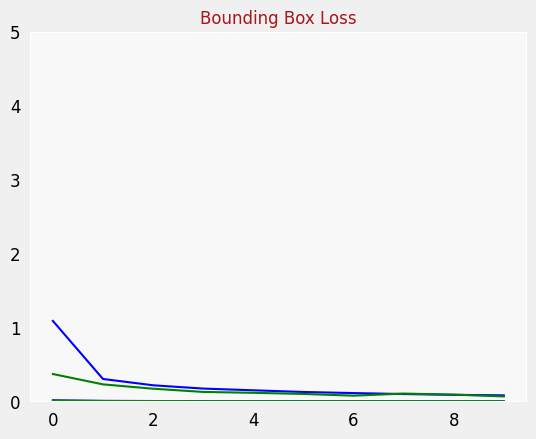

In [ ]:
plot_metrics("classification_loss", "Classification Loss")
plot_metrics("bounding_box_loss", "Bounding Box Loss")

In [ ]:
def intersection_over_union(pred_box, true_box):
    xmin_pred, ymin_pred, xmax_pred, ymax_pred =  np.split(pred_box, 4, axis = 1)
    xmin_true, ymin_true, xmax_true, ymax_true = np.split(true_box, 4, axis = 1)

    smoothing_factor = 1e-10

    xmin_overlap = np.maximum(xmin_pred, xmin_true)
    xmax_overlap = np.minimum(xmax_pred, xmax_true)
    ymin_overlap = np.maximum(ymin_pred, ymin_true)
    ymax_overlap = np.minimum(ymax_pred, ymax_true)

    pred_box_area = (xmax_pred - xmin_pred) * (ymax_pred - ymin_pred)
    true_box_area = (xmax_true - xmin_true) * (ymax_true - ymin_true)

    overlap_area = np.maximum((xmax_overlap - xmin_overlap), 0)  * np.maximum((ymax_overlap - ymin_overlap), 0)
    union_area = (pred_box_area + true_box_area) - overlap_area

    iou = (overlap_area + smoothing_factor) / (union_area + smoothing_factor)

    return iou

157/157 [==============================] - 2s 8ms/step
Number of predictions where iou > threshold(0.6): 9423
Number of predictions where iou < threshold(0.6): 577


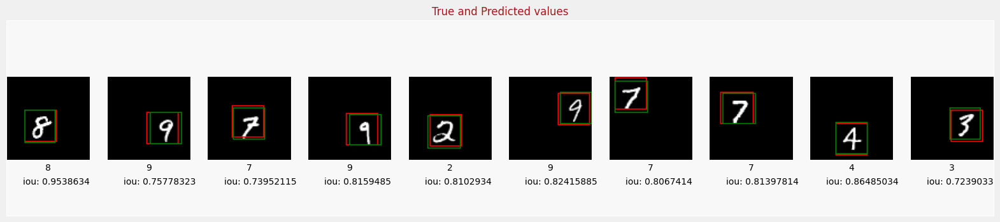

In [ ]:
# recognize validation digits
predictions = model.predict(validation_digits, batch_size=64)
predicted_labels = np.argmax(predictions[0], axis=1)

predicted_bboxes = predictions[1]

iou = intersection_over_union(predicted_bboxes, validation_bboxes)

iou_threshold = 0.6

print("Number of predictions where iou > threshold(%s): %s" % (iou_threshold, (iou >= iou_threshold).sum()))
print("Number of predictions where iou < threshold(%s): %s" % (iou_threshold, (iou < iou_threshold).sum()))


display_digits_with_boxes(validation_digits, predicted_labels, validation_labels, predicted_bboxes, validation_bboxes, iou, "True and Predicted values")